In [183]:
2

2

In [2]:
import matplotlib as mpl

In [3]:
mpl.rc_file_defaults()

In [4]:
import pickle
from os import makedirs as makedirs
import subprocess

import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.animation import FFMpegWriter
from matplotlib.collections import PatchCollection
from multiprocessing import Pool, cpu_count
from scipy.spatial.distance import squareform, cdist, pdist

from pycwt.helpers import fft, fft_kwargs, rect
from functools import partial
from skimage.metrics import structural_similarity as ssim
from skimage.segmentation import watershed
import shapely.geometry as geo
from shapely.ops import snap
import scipy.stats as st
import scipy.sparse
from sklearn import datasets, linear_model, cluster
from sklearn.linear_model import LinearRegression
from persim import sliced_wasserstein as slw
import statsmodels.api as sm
from tqdm import tqdm
import seaborn as sns #; sns.set()
from pyitlib import discrete_random_variable as drv
from sklearn.decomposition import NMF, FastICA
import umap

import p_utils

# Static parameters

curdir = './results/'

buffLen = p_utils.buffLen
truncDim = p_utils.truncDim	
trimLen = p_utils.trimLen

goodStates = ['Null','Fixation','Rest', 'Memory', 'Video', 'Math']

saveloc = './results/'
savename = 'PaperFigures'

sig = 0.05

['agraph.txt', 'analyzeICAHomology.m', 'analyzeICAHomology.m~', 'brainPlots.py', 'brainstructures.csv', 'centroids.csv', 'clusts.txt', 'colorTransform.txt', 'constructBrainPlotter.ipynb', 'cycleFile.txt', 'cyclesMatrixFile.txt', 'degreeArrayFile.txt', 'diag0.txt', 'diag1.txt', 'diag2.txt', 'diaghist1.txt', 'diaghist2.txt', 'DiffLarge.txt', 'DiffLarge_Diagram.txt', 'DiffLarge_Simplex.txt', 'DiffNodes.txt', 'DiffNodes_Diagram.txt', 'DiffNodes_Simplex.txt', 'DiffSmall.txt', 'DiffSmall_Diagram.txt', 'DiffSmall_Simplex.txt', 'DoAgglomGraph_v01.ipynb', 'DoCoarseGraph-Copy1.ipynb', 'DoCoarseGraph-Copy2.ipynb', 'DoCoarseGraph-Copy3.ipynb', 'DoCoarseGraph.ipynb', 'DoICAGraph.ipynb', 'EdgesLess.txt', 'EdgesLess_Diagram.txt', 'EdgesLess_Simplex.txt', 'edgesMatrixFile.txt', 'EdgesMore.txt', 'EdgesMore_Diagram.txt', 'EdgesMore_Simplex.txt', 'Figure4_UMAPMeanGrap.png', 'Figure5A.png', 'Figure5B.png', 'Figure5_Homology_Math.png', 'Figure5_Homology_MathTest.png', 'Figure5_Homology_Memory.png', 'Figure

In [5]:
metrics = {'Diagram':'Diagram', 'Simplex':'Simplex', 'Strength': 'Strength', 'Activity': 'Activity'}
basedir = {}
inputsdir = {}
localdir = {}
maxdims = {}
for  metric in metrics:
    if metric == 'Diagram':
        basedir[metric] = '../z18_GonzCast_WeightedCWT/'
        inputsdir[metric] = '../z18_GonzCast_WeightedCWT/results/rippedTesting/'
        #basedir[metric] = '../z22_GonzCast_WeightedCWT_Thresheld/'
        #inputsdir[metric] = '../z22_GonzCast_WeightedCWT_Thresheld/results/rippedTesting/'
        #basedir[metric] = '../z26_GonzCast_FullCWT/'
        #inputsdir[metric] = '../z26_GonzCast_FullCWT/results/rippedTesting/'
        maxdims[metric] = 2
    elif metric == 'Simplex':
        basedir[metric] = '../z19_GonzCast_WeightedCWT_Simplex/'
        inputsdir[metric] = '../z19_GonzCast_WeightedCWT_Simplex/results/simplexTraining/'    
        #basedir[metric] = '../z20_GonzCast_WeightedCWT_Simplex_Thresheld/'
        #inputsdir[metric] = '../z20_GonzCast_WeightedCWT_Simplex_Thresheld/results/simplexTraining/'    
        maxdims[metric] = 1
    if metric == 'Strength':
        basedir[metric] = '../z23_GonzCast_WeightedCWT_Strength/'        
        inputsdir[metric] = '../z23_GonzCast_WeightedCWT_Strength/results/strengthTraining/'
        maxdims[metric] = 0
    if metric == 'Activity':
        basedir[metric] = '../z25_GonzCast_Activations/'        
        inputsdir[metric] = '../z25_GonzCast_Activations/results/activityTraining/'
        maxdims[metric] = 2
    localdir[metric] = basedir[metric] + 'results/UMAPxyAll' + metric + '/'     
    
    
#conditions = {0:['Diagram', 0], 1:['Diagram', 1], 2:['Diagram', 2],
#              3:['Strength', 0], 4:['Simplex', 0], 5:['Simplex', 1]}


conditions = {0:['Activity', 2], 1:['Simplex', 1], 2:['Strength', 0],
              3:['Diagram', 0], 4:['Diagram', 1], 5:['Diagram', 2]}

condition_labels_all = {'Activity_2': 'Nodes', 'Strength_0': 'Strength', 'Simplex_1': 'Edges',
              'Diagram_0':'H0', 'Diagram_1':'H1', 'Diagram_2':'H2'}
              

#conditions = {0:['Diagram', 0], 1:['Diagram', 1], 2:['Diagram', 2]}
#conditions = {0:['Activity', 0], 1:['Activity', 1], 2:['Activity', 2]}


In [6]:
def setFed(data):
    x = data[:,0]
    y = data[:,1]
    range1 = max([max(x) - min(x), max(y) - min(y)]) 
    deltax = (max(x) - min(x))/32
    deltay = (max(y) - min(y))/32

    xmin = min(x) - deltax
    xmax = max(x) + deltax
    ymin = min(y) - deltay
    ymax = max(y) + deltay
    
    xfrac = (xmax-xmin)/range1
    yfrac = (ymax-ymin)/range1
    
    max_grid = 256
    xsteps = int(np.round(xfrac*max_grid))
    ysteps = int(np.round(yfrac*max_grid))
    
    print(xmin, xmax, xsteps, ymin, ymax, ysteps)# Create meshgrid
    xx, yy = np.mgrid[xmin:xmax:xsteps*1j, ymin:ymax:ysteps*1j]
    #xx, yy = np.mgrid[xmin:xmax:56j, ymin:ymax:56j]

    return xx, yy, xmin, xmax, ymin, ymax

def getFed(data,xx=None,yy=None):
    x = data[:,0]
    y = data[:,1]

    values = np.vstack([x, y])
    kernel = st.gaussian_kde(values,bw_method=0.08)
    kFactor = kernel.factor

    positions = np.vstack([xx.ravel(), yy.ravel()])
    f = np.reshape(kernel(positions).T, xx.shape)

    return f, kFactor

def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)
        
def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{:.2f}'.format(height),
                    xy=(rect.get_x() + rect.get_width(), height),
                    xytext=(0, 0),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


In [7]:
Nv = 18

epath = '/keilholz-lab/Jacob/TDABrains_00/data/FCStateClassif/timing.txt'
etime = pd.read_csv(epath,sep='\t',header=0).values.astype('int')
print('etime hist')
print(np.histogram(etime))
eset = np.unique(etime)
ttime = np.zeros(etime.shape)
rtime = np.zeros(etime.shape)
inite = -1
initt = -1
for i, t in enumerate(etime):
    if t == inite:
        initt += 1
        ttime[i,0] = initt
    else:
        ttime[i,0] = 0
        inite = t
        initt = 0

    if i < 508:
        rtime[i] = 1
    else:
        rtime[i] = 2
print('ttime hist')
print(np.histogram(ttime))
print(ttime.shape)
print(ttime)

trimLen = p_utils.trimLen

ce = []
ct = []
cr = []
cv = []
ci = []

for ni in range(Nv):
    ce.append(etime[trimLen:-trimLen])
    ct.append(ttime[trimLen:-trimLen])
    cr.append(rtime[trimLen:-trimLen])
    cv.append(np.zeros(ct[-1].shape)+ni)
    ci.append(np.arange(ct[-1].shape[0]))
    print(np.histogram(ce[-1]))
    print(np.histogram(ct[-1]))

nT = len(ct)

print(len(ct))
print(ct[0].shape)
print(np.concatenate(ct).shape)

CE = np.concatenate(ce).ravel()
print(['CE shape is: ', CE.shape])
types_ce = np.unique(CE)
# Set index boundaries for list of events
mxe1 = np.max(types_ce)+1
mne = 0

CV = np.concatenate(cv).ravel()
print(['CV shape is: ', CV.shape])
types_cv = np.unique(CV)
# set index boundaries for list of volunteers
mxv1 = np.max(types_cv)+1
mnv = Nv

CT = np.concatenate(ct).ravel()

CR = np.concatenate(cr).ravel()    

CI = np.concatenate(ci).ravel()
types_ci = np.unique(CI)
mxi1 = np.max(types_ci)+1


etime hist
(array([ 57,   0, 240,   0,   0, 240,   0, 240,   0, 240]), array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]))
ttime hist
(array([153,  96,  96,  96,  96,  96,  96,  96,  96,  96]), array([  0. ,  11.9,  23.8,  35.7,  47.6,  59.5,  71.4,  83.3,  95.2,
       107.1, 119. ]))
(1017, 1)
[[  0.]
 [  0.]
 [  1.]
 ...
 [117.]
 [118.]
 [119.]]
(array([ 56,   0, 121,   0,   0, 240,   0, 120,   0, 240]), array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]))
(array([128,  72,  72,  72,  72,  72,  72,  72,  72,  73]), array([  0. ,  11.9,  23.8,  35.7,  47.6,  59.5,  71.4,  83.3,  95.2,
       107.1, 119. ]))
(array([ 56,   0, 121,   0,   0, 240,   0, 120,   0, 240]), array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]))
(array([128,  72,  72,  72,  72,  72,  72,  72,  72,  73]), array([  0. ,  11.9,  23.8,  35.7,  47.6,  59.5,  71.4,  83.3,  95.2,
       107.1, 119. ]))
(array([ 56,   0, 121,   0,   0, 240,   0, 120,   0, 240]), array([1. , 1.4, 1.8, 2

In [8]:
def getIndexerRanges(nP, nW):    
    # Lookup table translating all possible nd simplices into ordinal labels
    # Possible simplices are limited by disconnected construction of the multi-layer graph
    # Goal is to store boolean sparse matrices when indexed simplex is present
    indexerRanges = {}
    i0 = 0
    i00 = 0
    for dim in range(0,1+1,1):
        for w in range(nW):
            vec = range(nP*w,nP*(w+1),1)
            for i, s in enumerate(itertools.combinations(vec,dim+1), start=i0):
                pass
            i0 = i+1
        indexerRanges[dim] = [i00,i0]
        i00 = i0
    print(indexerRanges)
    indexerA = np.arange(i+1)
    return indexerRanges, indexerA

nP = p_utils.knn
nW = 1
    
indexerRanges, indexerA = getIndexerRanges(nP,nW)

{0: [0, 328], 1: [328, 53956]}


In [8]:
volunteers = p_utils.getSecondList(inputsdir[metric])

In [9]:
# Get underlying data

vloc = '/keilholz-lab/Jacob/TDABrains_00/data/FCStateClassif/anat/'

volunteers, restDirs, taskDirs, EVtxt, Blocks, Blockstxt = p_utils.getLists(vloc=vloc)

trimLen = p_utils.trimLen

h0 = {}
h1 = {}

volunteers = p_utils.getSecondList(inputsdir[metric])
for vi, voln in tqdm(enumerate(volunteers),desc='load inputs for metric {}'.format(metric)):

    adata = np.load(vloc + voln ).T        
    adata = np.delete(adata, p_utils.missingVoxels, axis=0)
    h0[voln] = adata.copy()

    nvox, nT = nP, nT = np.shape(adata)
    #print(nP,nT)
    
    data = adata[:,trimLen:-trimLen]

    h1[voln] = data
    
print(len(h0))
h1 = np.concatenate([h1[hh] for hh in h1],axis=1)
print(h1.shape)

load inputs for metric Activity: 0it [00:00, ?it/s]

['SBJ01_Gordon333.npy', 'SBJ02_Gordon333.npy', 'SBJ03_Gordon333.npy', 'SBJ04_Gordon333.npy', 'SBJ06_Gordon333.npy', 'SBJ07_Gordon333.npy', 'SBJ08_Gordon333.npy', 'SBJ09_Gordon333.npy', 'SBJ10_Gordon333.npy', 'SBJ12_Gordon333.npy', 'SBJ13_Gordon333.npy', 'SBJ14_Gordon333.npy', 'SBJ15_Gordon333.npy', 'SBJ16_Gordon333.npy', 'SBJ17_Gordon333.npy', 'SBJ18_Gordon333.npy', 'SBJ19_Gordon333.npy', 'SBJ20_Gordon333.npy']


load inputs for metric Activity: 18it [00:01, 17.36it/s]


18
(328, 13986)


In [132]:
metrics.keys()

dict_keys(['Diagram', 'Simplex', 'Strength', 'Activity'])

In [10]:
# Get underlying data
h2 = {}
for metric in metrics:    
    for dim in range(maxdims[metric]+1):
        condition_label = '{}_{}'.format(metric,dim)
        h2[condition_label] = []    
    
    '''if condition_label=='Simplex_1':
        pass
    else:
        continue
    '''
    
    volunteers = p_utils.getSecondList(inputsdir[metric])
    for vi, voln in tqdm(enumerate(volunteers),desc='load inputs for metric {}'.format(metric)):
        locU = inputsdir[metric]
        with open(locU + str(voln) + '.pkl', 'rb') as file:
            uus = pickle.load(file)        
            
        for uu in uus:
            for dim in range(maxdims[metric]+1):
                condition_label = '{}_{}'.format(metric,dim)
                if metric == 'Diagram':
                    h2[condition_label].append(uu['dgms'][dim])
                elif metric == 'Simplex' or metric == 'Strength':                    
                    ind = np.full(indexerA.shape,True)
                    ind[:indexerRanges[dim][0]] = False
                    ind[indexerRanges[dim][1]:] = False                    
                    h2[condition_label].append( uu.toarray()[0,indexerA[ind]] )                                    
                elif metric == 'Activity':
                    h2[condition_label].append(uu[dim])
                    
                    


                

load inputs for metric Diagram: 18it [02:15,  7.55s/it]
load inputs for metric Simplex: 18it [01:31,  5.10s/it]
load inputs for metric Strength: 18it [00:03,  5.39it/s]
load inputs for metric Activity: 18it [00:08,  2.14it/s]


In [11]:
                 
# Get UMAP data
h3 = {}
for metric in metrics:    
    # Get underlying data
    for dim in range(maxdims[metric]+1):
        condition_label = '{}_{}'.format(metric,dim)
        h3[condition_label] = []

    volunteers = p_utils.getSecondList(localdir[metric])
    for vi, vol in tqdm(enumerate(volunteers),desc='load embedding for metric {}'.format(metric)):
        embfile = localdir[metric] + str(vol) + '.pkl'
        with open(embfile,'rb') as file:
            temp = pickle.load(file)
        for dim in range(maxdims[metric]+1):
            condition_label = '{}_{}'.format(metric,dim)
            h3[condition_label].append(temp[dim])

            

load embedding for metric Diagram: 18it [00:00, 28.28it/s]
load embedding for metric Simplex: 18it [00:00, 67.42it/s]
load embedding for metric Strength: 18it [00:00, 42.28it/s]
load embedding for metric Activity: 18it [00:00, 27.97it/s]


In [12]:

with open('../performance.pkl','rb') as file:    
    performance_log = pickle.load(file)

performance = {}
performance_mean = {}
for perf in performance_log:
    performance[perf] = np.full(CV.shape,np.nan,dtype='float')
    performance_mean[perf] = np.full(len(types_cv),np.nan,dtype='float')

for ii, [vv, ee, rr] in enumerate(zip(CV, CE, CR)):
    if ee>2:        
        for perf in performance_log:
            performance[perf][ii] = performance_log[perf].loc[
                volunteers[int(vv)][:5],goodStates[int(ee)]+'_'+str(int(rr))]  

for vi in types_cv.astype(int):
    for perf in performance_log:
        performance_mean[perf][vi] = np.mean( 
            (performance_log[perf].loc[volunteers[vi][:5],:].values).astype('float') )


### Figure 1: Experimental-wise and volunteer-wise Separability

In [13]:
getfiles = p_utils.getSecondList(vloc = './figures/', prefix='resultsSaves')

In [14]:
results_array = []
for gotfile in tqdm(getfiles):
    with open('./figures/' + gotfile + '.pkl', 'rb') as file:
        results_array.append(pickle.load(file))

100%|██████████| 128/128 [00:07<00:00, 16.48it/s]


In [15]:
len_ra = len(results_array)
print(len_ra)

128


In [13]:
results_array.pop(87)

{'vBarOut': {'Simplex_1': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Activity_2': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Strength_0': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Diagram_0': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Diagram_1': array([13986.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
             0.,     0.]),
  'Diagram_2': array([13986.,     0.,     0.,     0.,    

In [14]:
len_ra = len(results_array)
print(len_ra)

127


In [18]:
results_array[0].keys()


dict_keys(['vBarOut', 'barChart_full', 'vals', 'barChart_randtot', 'barChart_randsub', 'barChart'])

In [16]:
# find correct fast video group

conditions_extended = conditions.copy()
for condition in conditions:
    conditions_extended[condition+6] = conditions[condition]

pars = []      
res_type = 'vals'

outWave = {'more':{}, 'less':{}}
outTargs = {'more':{}, 'less':{}}

for ei, e in enumerate(types_ce[2:], start=0):            
    outWave['less'][e] = {}
    outWave['more'][e] = {}
    outTargs['less'][e] = {}
    outTargs['more'][e] = {}

    for pi, perf in enumerate(performance):
        outWave['less'][e][perf] = {}        
        outWave['more'][e][perf] = {}
        outTargs['less'][e][perf] = {}
        outTargs['more'][e][perf] = {}

        for i, condition in enumerate(conditions):
            condition_label = '{}_{}'.format(*conditions[condition])
            #print(condition_label)

            k = -1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            aa, bb0 = np.unique(inds, return_counts=True)
            bb = bb0/np.sum(bb0)
            outWave['less'][e][perf][condition_label] = np.array(list(
                h1[:,ind]*count for ind, count in zip(aa,bb)))
            outTargs['less'][e][perf][condition_label] = {'inds':aa,'fracs':bb}

            k=1
            inds = np.concatenate(
                [np.concatenate(re[res_type][e][perf][condition_label]['a' + str(k)]).ravel()
                                   for re in results_array 
               if re[res_type][e][perf][condition_label]['a' + str(k)]] )
            cc, dd0 = np.unique(inds, return_counts=True)
            dd = dd0/np.sum(dd0)            
            outWave['more'][e][perf][condition_label] = np.array(list(
                [h1[:,ind]*count for ind, count in zip(cc,dd)]))
            outTargs['more'][e][perf][condition_label] = {'inds':cc,'fracs':dd}
            
            print([goodStates[e], perf, condition_label, len(aa), np.sum(bb0), len(cc), np.sum(dd0),
                  np.mean(outWave['less'][e][perf][condition_label]), 
                  np.mean(outWave['more'][e][perf][condition_label])])
            

['Memory', 'correct', 'Activity_2', 10720, 40992, 13366, 143986, -1.6362769075742364e-07, 1.1344469081118971e-07]
['Memory', 'correct', 'Simplex_1', 11522, 95242, 12886, 162288, -1.2576278358815611e-07, 1.064173353335961e-07]
['Memory', 'correct', 'Strength_0', 7255, 20639, 10340, 68015, -8.594885209847008e-08, 4.915975539331345e-08]
['Memory', 'correct', 'Diagram_0', 4312, 62099, 3933, 106842, -8.7400411789136e-07, 6.881011578656474e-07]
['Memory', 'correct', 'Diagram_1', 6072, 72743, 3753, 83107, -6.792470035696174e-07, 1.5372032933690845e-06]
['Memory', 'correct', 'Diagram_2', 6412, 107973, 3980, 36806, -1.716937940341391e-06, -1.3749038131813675e-06]
['Memory', 'time', 'Activity_2', 13667, 168252, 10289, 37866, 1.2278195923703402e-07, -2.244096337936724e-07]
['Memory', 'time', 'Simplex_1', 12440, 162013, 10211, 91882, 1.0912745845392757e-07, -1.1940455074646627e-07]
['Memory', 'time', 'Strength_0', 9867, 147886, 8513, 58380, 7.602157460412209e-08, -9.096711724974226e-08]
['Memory',

In [18]:
outTargs['more'][e][perf][condition_label]

{'inds': array([  251,   252,   253, ..., 13811, 13814, 13819]),
 'fracs': array([1.28293947e-05, 3.84881841e-05, 8.98057630e-05, ...,
        1.28293947e-05, 2.56587894e-05, 1.28293947e-05])}

###  Compare

In [17]:
def calcWeightedJaccard(inputs):
    A = 1-inputs[0]
    B = 1-inputs[1]

    numerator = np.min([A,B], axis=0)
    denomerator = np.max([A,B],axis=0)
    
    dist = 1-(np.sum(numerator)/np.sum(denomerator))

    return dist


In [18]:
fname = ('OutGraphs_AndGG.pkl')
with open(fname, 'rb') as file:    
    og = pickle.load(file)
outGraph_more = og['outGraph_more']
outGraph_less = og['outGraph_less']
GG_all = og['GG_all']

In [229]:
bb = masks['brainlocs']==2
jj=np.unique(masks['gordon'][bb])
jj = jj[~np.isnan(jj)]
[jj.min(),jj.max()]

[0.0, 333.0]

In [ ]:
def getFlatBrain():
    # load data
    with open('flatBrainMasks.pkl','rb')as file:
        masks = pickle.load(file)

    # draw all polygons
    polyset = {}
    sides = ['L','R']

    ylim = [0,0]
    xlim = [0,0]

    for side in [1,2]:    
        sideMask = masks['brainlocs']==side
        segs = np.unique(masks['gordon'][sideMask])
        segs = segs[~np.isnan(segs)]
        segs = segs[segs>0].astype('int')
        for seg in segs:
            polyset[seg] = []
            #asegment = masks['gordon']==seg
            #asegmentside = asegment[sideMask]
            #polyset[sides[side-1]][seg]['points'] = masks['vert'+sides[side]][asegmentside,:2]
            #polyset[sides[side-1]][seg]['point_inds'] = set(np.arange(len(asegmentside))[asegmentside])    
            #polyset[sides[side-1]][seg]['polys'] = []

        segsArray = masks['gordon'][sideMask].astype('int')
        faces = masks['face'+sides[side-1]]
        for face in faces:
            seg = np.unique([segsArray[i-1] for i in face])
            kk = len(seg)
            if kk==1 and not any(seg<1):
                seg = seg[0]
                temp = np.array([masks['vert'+sides[side-1]][ff,:2] for ff in face])
                if not any(np.all(temp==0,axis=1)) and not any(pdist(temp)>10):
                    polyset[seg].append(temp)

                ylim[0] = min(ylim[0],min(temp[:,1]))
                ylim[1] = max(ylim[1],max(temp[:,1]))
                xlim[0] = min(xlim[0],min(temp[:,0]))
                xlim[1] = max(xlim[1],max(temp[:,0]))

    return masks, polyset, ylim, xlim

In [ ]:
masks,polyset,ylim,xlim = getFlatBrain()

In [ ]:
masks['centroids'][:,0] -= 250

In [409]:
masksS = masks.copy()

In [185]:
import csv

In [415]:
spec = ['GFL_Faces_sphere.csv','faceL']
temp = np.genfromtxt(spec[0],delimiter=',')
print(masksS[spec[1]].shape)
masksS[spec[1]] = temp
print(masksS[spec[1]].shape)

(59013, 3)
(64980, 3)


In [411]:
masksS.keys()

dict_keys(['vertL', 'faceL', 'vertR', 'faceR', 'gordon', 'brainlocs', 'centroids'])

In [416]:
with open('SphereBrainMasks.pkl','wb') as file:
    pickle.dump(masksS,file)

In [417]:
masksS_cp = masksS.copy()

In [418]:
def getDim3Brain(masks=masks):
    # load data
    #with open('Dim3BrainMasks.pkl','rb')as file:
    with open('SphereBrainMasks.pkl','rb')as file:
        masks = pickle.load(file)

    # draw all polygons
    polyset = {}
    sides = ['L','R']

    ylim = [0,0]
    xlim = [0,0]
    zlim = [0,0]

    for side in [1,2]:    
        sideMask = masks['brainlocs']==side
        segs = np.unique(masks['gordon'][sideMask])
        segs = segs[~np.isnan(segs)]
        segs = segs[segs>0].astype('int')
        for seg in segs:
            polyset[seg] = []
            
        segsArray = masks['gordon'][sideMask].astype('int')
        faces = masks['face'+sides[side-1]].astype('int')
        for face in faces:
            seg = np.unique([segsArray[i-1] for i in face])
            kk = len(seg)
            if kk==1 and not any(seg<1):
                seg = seg[0]
                temp = np.array([masks['vert'+sides[side-1]][ff,:3] for ff in face])
                if not any(np.all(temp==0,axis=1)) and not any(pdist(temp)>10):
                    polyset[seg].append(temp)

                zlim[0] = min(zlim[0],min(temp[:,2]))
                zlim[1] = max(zlim[1],max(temp[:,2]))
                ylim[0] = min(ylim[0],min(temp[:,1]))
                ylim[1] = max(ylim[1],max(temp[:,1]))
                xlim[0] = min(xlim[0],min(temp[:,0]))
                xlim[1] = max(xlim[1],max(temp[:,0]))

    return masks, polyset, ylim, xlim, zlim

In [241]:
sides = ['L','R']
side=1

In [238]:
sideMask = masks3['brainlocs']==1

In [252]:
segsArray=masks3['gordon'][sideMask].astype('int')

In [243]:
faces = masks['face'+sides[side-1]].astype('int')
face=faces[0]

In [253]:
seg = np.unique([segsArray[i-1] for i in face])

In [255]:
seg=seg[0]

In [262]:
masks3['vertR'][:4,:]

array([[-123.1693  ,  141.5483  ,    0.      ],
       [ -51.26225 ,  108.8392  ,    0.      ],
       [   7.978838,   31.52619 ,    0.      ],
       [  64.64063 ,   89.49998 ,    0.      ]])

In [257]:
np.array([masks3['vert'+sides[side-1]][ff,:3] for ff in face])

array([[137.0409 , 168.1441 ,   0.     ],
       [135.9482 , 170.7847 ,   0.     ],
       [ 59.65317, 123.0859 ,   0.     ]])

In [419]:

masks3,polyset3,ylim3,xlim3,zlim3 = getDim3Brain(masks=masks3)

In [227]:
np.sum(sideMask)

32492

In [302]:
np.array([aa[:,0],bb[:,0],cc[:,0]]).shape

(3, 3)

In [316]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

In [327]:
def patch(ax, x, y, z, v, vmin=0, vmax=100, cmap_name='viridis'):
    cmap = mpl.cm.get_cmap(cmap_name)               # Get colormap by name
    c = cmap(mpl.colors.Normalize(vmin, vmax)(v))   # Normalize value and get color
    pc = Poly3DCollection([list(zip(x,y,z))])       # Create PolyCollection from coords
    pc.set_facecolor(c)                             # Set facecolor to mapped value
    pc.set_edgecolor(None)                           # Set edgecolor to black
    ax.add_collection3d(pc)                         # Add PolyCollection to axes
    return pc

def view(ax, code):
    if code == 2: #view(2) sets the default two-dimensional view, az = 0, el = 90.
        ax.view_init(90, 0)     # (args are reversed from MATLAB)

    if code == 3: #view(3) sets the default three-dimensional view, az = –37.5, el = 30.
        ax.view_init(30, -37.5)

In [318]:
aa

array([[-37.171,  13.738, -38.594],
       [-37.545,  14.244, -37.866],
       [-36.701,  14.593, -36.9  ]])

In [322]:
y


array([13.738, 14.244, 14.593])

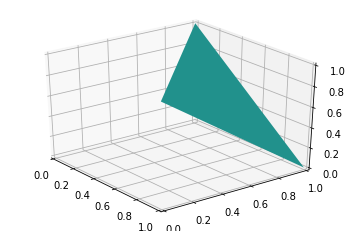

In [329]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim(left=-40,right=40)
ax.set_ylim(bottom=-40,top=40)
ax.set_zlim(bottom=-40,top=40)

x = aa[:,0]
y = aa[:,1]
z = aa[:,2]
v = 100.0
patch(ax, x, y, z, v)

x = [1.0, 1.0, 0.0];
y = [0.0, 1.0, 1.0];
z = [1.0, 0.0, 1.0];
v = 50.0;
patch(ax, x, y, z, v)


polyset3[seg][0]

view(ax, 3)
plt.show()

In [324]:
x = [1.0, 1.0, 0.0];
y = [0.0, 1.0, 1.0];
z = [1.0, 0.0, 1.0];
v = 50.0;
patch(ax, x, y, z, v)

view(ax, 3)
plt.show()

In [291]:
bb[:,0]

array([-36.307, -37.171, -36.701])

In [295]:
np.array([aa[:,0],bb[:,0]])

array([[-37.171, -37.545, -36.701],
       [-36.307, -37.171, -36.701]])

In [279]:
polyset3[1]

[array([[-37.171,  13.738, -38.594],
        [-37.545,  14.244, -37.866],
        [-36.701,  14.593, -36.9  ]]),
 array([[-36.307,  14.138, -37.539],
        [-37.171,  13.738, -38.594],
        [-36.701,  14.593, -36.9  ]]),
 array([[-36.795,  13.173, -39.286],
        [-37.171,  13.738, -38.594],
        [-36.307,  14.138, -37.539]]),
 array([[-35.903,  13.616, -38.181],
        [-36.795,  13.173, -39.286],
        [-36.307,  14.138, -37.539]]),
 array([[-36.429,  12.543, -39.941],
        [-36.795,  13.173, -39.286],
        [-35.903,  13.616, -38.181]]),
 array([[-35.503,  13.032, -38.808],
        [-36.429,  12.543, -39.941],
        [-35.903,  13.616, -38.181]]),
 array([[-36.081,  11.85 , -40.557],
        [-36.429,  12.543, -39.941],
        [-35.503,  13.032, -38.808]]),
 array([[-36.081,  11.85 , -40.557],
        [-36.975,  12.274, -40.424],
        [-36.429,  12.543, -39.941]]),
 array([[-36.649,  11.548, -41.041],
        [-36.975,  12.274, -40.424],
        [-36.081,  11.

/home/Jacob/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:393: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/Jacob/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


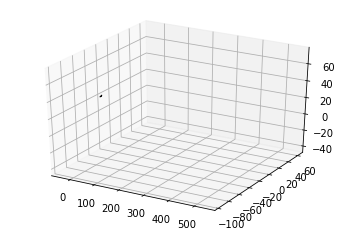

In [341]:

ax = plt.subplot(111,projection='3d')
ax.set_ylim(ylim3)
ax.set_xlim(xlim3)
ax.set_zlim(zlim3)


pc=Poly3DCollection(polyset3[seg][0])
pc.set_edgecolor('k')
ax.add_collection3d(pc)

plt.show()

In [344]:
help(Poly3DCollection)

Help on class Poly3DCollection in module mpl_toolkits.mplot3d.art3d:

class Poly3DCollection(matplotlib.collections.PolyCollection)
 |  Poly3DCollection(verts, *args, zsort='average', **kwargs)
 |  
 |  A collection of 3D polygons.
 |  
 |  .. note::
 |      **Filling of 3D polygons**
 |  
 |      There is no simple definition of the enclosed surface of a 3D polygon
 |      unless the polygon is planar.
 |  
 |      In practice, Matplotlib performs the filling on the 2D projection of
 |      the polygon. This gives a correct filling appearance only for planar
 |      polygons. For all other polygons, you'll find orientations in which
 |      the edges of the polygon intersect in the projection. This will lead
 |      to an incorrect visualization of the 3D area.
 |  
 |      If you need filled areas, it is recommended to create them via
 |      `~mpl_toolkits.mplot3d.axes3d.Axes3D.plot_trisurf`, which creates a
 |      triangulation and thus generates consistent surfaces.
 |  
 |  Meth

In [352]:
xlim3

[-64.612, 566.28]

In [361]:
[np.max(masks3['vertL'][:,0]),np.min(masks3['vertR'][:,0])]

[0.41132, 499.27]

In [362]:
xlim3

[-64.612, 566.28]

/home/Jacob/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:393: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/Jacob/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


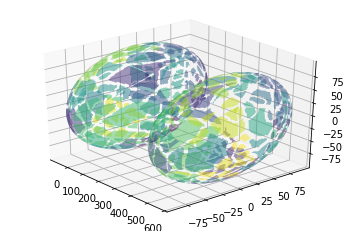

In [420]:
ax = plt.subplot(111, projection='3d')
ax.set_ylim(ylim3)
ax.set_xlim(xlim3)
ax.set_zlim(zlim3)

cmap = plt.get_cmap('viridis', 334)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

for seg in list(set(polyset.keys()) - set(missingVoxels)):
    
    patches = [ax.add_collection3d(Poly3DCollection(
        tri, edgecolor = None, facecolor=cmap(seg), alpha=0.6)) 
                                   for tri in polyset3[seg]]
    #polyobs[seg] = PatchCollection(patches,match_original=True)
    #ax.add_collection3d(*patches)
    
ax.view_init(30, -40)
plt.show()

In [21]:
masks['centroids'][:,0] -= 250

In [22]:
conditions_extended = conditions.copy()
for condition in conditions:
    conditions_extended[condition+6] = conditions[condition]

###  Generate New Wavelet Coherence

In [617]:
adata[0].shape

(328, 1017)

In [23]:
def computeWCT(adata, clusts):

    uclusts = np.unique(clusts)
    frq_edges = p_utils.frq_edges
    
    pool = Pool(10)
    
    WCT = []
    for qdata in adata:
        
        idata = np.empty([len(uclusts),qdata.shape[1]], dtype='float')        
        for ci, clusti in enumerate(uclusts):
            idata[ci,:] = np.mean(qdata[clusts==clusti,:],axis=0)

        sj, frequencies, coi, mother, s0, dj, J, s1, TR = p_utils.getCWT_auxInfoPlus(idata[0,:])

        W = pool.map(p_utils.getCWT_coeff,tqdm(idata))        

        W = np.array(W)
        print(W.shape)
        #W = W[:10,:]
        _, m, n = nP, nW, nT = W.shape 

        k = 2 * np.pi * fft.fftfreq(fft_kwargs(W[0, 0, :])['n'])
        k2 = k ** 2            
        scales1 = np.ones([1, n]) * sj[:, None]
        snorm = sj / TR
        F = np.exp(-0.5 * (snorm[:, np.newaxis] ** 2) * k2)  # Outer product

        wsize = mother.deltaj0 / dj * 2
        win = rect(np.int(np.round(wsize)), normalize=True)                                                

        print('Smooth wavelets')
        mapFun = partial(p_utils.cwt2smooth_local, n=n, F=F, win=win)
        S = pool.map(mapFun,tqdm( list(np.abs(W[ic,:,:].squeeze())**2/scales1 for ic in range(nP)) ))                
        print('One smoothed values histogram')
        print(np.histogram(S[0].ravel()))

        samps = np.arange(nP)

        mapCross = partial(p_utils.cross)
        W12 = list(pool.imap(mapCross,tqdm(list([W[sma,:,:].squeeze(),W[smb,:,:].squeeze()] for sma, smb in itertools.combinations(samps,2)), desc='Cross wavelets')))
        mapCoher = partial(p_utils.coher_postCross,n=n,F=F,win=win,scales1=scales1)
        wct = list(pool.imap(mapCoher,tqdm(list([W12[i],S[sma],S[smb]] for i,[sma,smb] in enumerate(itertools.combinations(samps,2))), desc='Wavelet coherence' )))
        mapNorms = partial(p_utils.crossNorms, frq_edges=frq_edges)
        nW12 = list(pool.imap(mapNorms,tqdm(W12)))
        print('one W12 norms histogram, having shape {}'.format(nW12[0].shape))
        print(np.histogram(nW12[0]))

    
        # Trim input data
        temp = np.array(wct)
        temp = temp[:,:,trimLen:-trimLen]
        tnW12 = np.array(nW12)[:,:,trimLen:-trimLen]
        aa, bb, cc = temp.shape
        wct = np.zeros((aa, 1, cc))
        [uu0, uu1] = frq_edges
        wct[:,0,:] = np.sum(np.multiply(temp[:,uu0:uu1,:], tnW12[:,uu0:uu1,:]),axis=1)
        _, m, n = _, nW, nT = wct.shape
        print('wct is shape {}.'.format(wct.shape))
        print('One wct histogram')
        print(np.histogram(wct[0].ravel()))
        
        WCT.append(wct)
        
    pool.close()
    pool.join()
    pool.terminate

    return WCT


In [24]:
apath  = '/keilholz-lab/Jacob/TDABrains_00/data/FCStateClassif/anat/'

vloc = apath   
volunteers, restDirs, taskDirs, EVtxt, Blocks, Blockstxt = p_utils.getLists(vloc=vloc)

nVols = len(volunteers)

print('nVols is {}'.format(nVols))

adata = []
for voln in volunteers:
    """Perform calculations of inter-volunteer dynamics"""
    temp = np.load(vloc + voln ).T        
    adata.append(np.delete(temp, p_utils.missingVoxels, axis=0))


['SBJ01_Gordon333.npy', 'SBJ02_Gordon333.npy', 'SBJ03_Gordon333.npy', 'SBJ04_Gordon333.npy', 'SBJ06_Gordon333.npy', 'SBJ07_Gordon333.npy', 'SBJ08_Gordon333.npy', 'SBJ09_Gordon333.npy', 'SBJ10_Gordon333.npy', 'SBJ12_Gordon333.npy', 'SBJ13_Gordon333.npy', 'SBJ14_Gordon333.npy', 'SBJ15_Gordon333.npy', 'SBJ16_Gordon333.npy', 'SBJ17_Gordon333.npy', 'SBJ18_Gordon333.npy', 'SBJ19_Gordon333.npy', 'SBJ20_Gordon333.npy']
nVols is 18


In [799]:
1

1

###  Compare coarsened networks

In [25]:
from scipy.cluster.hierarchy import average, fcluster

In [26]:
from ripser import ripser

In [27]:
from gudhi.representations import Landscape
L_resolution = 333
L_numLandscapes = 1 
L_fun = Landscape(resolution=L_resolution, num_landscapes=L_numLandscapes)

In [28]:
def doLandscape(dgm):
    if len(dgm)>0:
        L = L_fun.fit_transform([dgm])
    else:
        L = np.zeros(L_resolution)
    return L

In [29]:
from sklearn.decomposition import FastICA

In [421]:
reducer_3 = umap.UMAP(n_neighbors=15, n_components=3, metric='precomputed', n_epochs=None, 
                    learning_rate=1.0, init=masks3['centroids'], min_dist=0, spread=1, 
                    set_op_mix_ratio=1.0, local_connectivity=1.0, repulsion_strength=10, 
                    negative_sample_rate=5, transform_queue_size=3.0, a=None, b=None, 
                    random_state=None, metric_kwds=None, angular_rp_forest=False, 
                    target_n_neighbors=-1, target_metric='categorical', target_metric_kwds=None,
                    target_weight=0.5, transform_seed=42, verbose=False)

outGraph_average = np.mean(np.array(h2['Simplex_1']),axis=0)
avgG = squareform(outGraph_average)
hh = reducer_3.fit_transform(avgG)

GG={}
GG['gg3'] = masks3['centroids']
GG['gg2'] = masks['centroids']
GG['avgG'] = avgG
GG['hh'] = hh
GG['dist']= pdist(hh, metric='euclidean')
GG['linkage'] = average(GG['dist'])

GG['DGMS'] = {}

In [405]:
reducer_2 = umap.UMAP(n_neighbors=15, n_components=2, metric='precomputed', n_epochs=None, 
                    learning_rate=1.0, init=masks['centroids'], min_dist=0, spread=1, 
                    set_op_mix_ratio=1.0, local_connectivity=1.0, repulsion_strength=10, 
                    negative_sample_rate=5, transform_queue_size=3.0, a=None, b=None, 
                    random_state=None, metric_kwds=None, angular_rp_forest=False, 
                    target_n_neighbors=-1, target_metric='categorical', target_metric_kwds=None,
                    target_weight=0.5, transform_seed=42, verbose=False)

outGraph_average = np.mean(np.array(h2['Simplex_1']),axis=0)
avgG = squareform(outGraph_average)
hh = reducer_2.fit_transform(avgG)

GG={}
GG['gg'] = masks['centroids']
GG['gg2'] = masks['centroids']
GG['avgG'] = avgG
GG['hh'] = hh
GG['dist']= pdist(hh, metric='euclidean')
GG['linkage'] = average(GG['dist'])

GG['DGMS'] = {}

In [432]:
GG['DGMS'][328] = {}
gdata = np.array(h2['Simplex_1']).T

for ei, e in enumerate(types_ce[2:], start=0):            
    for pi, perf in enumerate(['correct']):
        for valence in ['more','less']:
            inds = outTargs[valence][e][perf]['Simplex_1']['inds']
            fracs = outTargs[valence][e][perf]['Simplex_1']['fracs']
            temp = np.concatenate([(gdata[:,aa]*bb)[:,None] for aa,bb in zip(inds,fracs)],axis=1)
            graph = squareform(np.sum(temp,axis=1))
            
            rips = ripser(graph, distance_matrix=True, maxdim=2)
            combinationName = '{}_{}_{}'.format(goodStates[e],perf,valence)
            print(combinationName)
            print(np.histogram(squareform(graph)))
            GG['DGMS'][328][combinationName] = rips['dgms']
            
graph = squareform(np.mean(gdata,axis=1))
rips = ripser(graph, distance_matrix=True, maxdim=2)
GG['DGMS'][328]['All_all_all'] = rips['dgms']

graph = squareform(np.mean(gdata,axis=1))
rips = ripser(graph, distance_matrix=True, maxdim=2)
GG['DGMS'][328]['Rest_rest_rest'] = rips['dgms']

Memory_correct_more
(array([    8,    51,   223,   572,  1391,  3242,  7712, 15711, 20797,
        3921]), array([0.07036444, 0.13614317, 0.2019219 , 0.26770064, 0.33347937,
       0.3992581 , 0.46503683, 0.53081557, 0.5965943 , 0.66237303,
       0.72815177]))
Memory_correct_less
(array([   16,    47,   210,   647,  1420,  2968,  6681, 13344, 20807,
        7488]), array([0.07162459, 0.13993182, 0.20823905, 0.27654628, 0.34485351,
       0.41316074, 0.48146797, 0.5497752 , 0.61808243, 0.68638966,
       0.75469689]))
Video_correct_more
(array([    6,    39,   132,   428,  1019,  2337,  4988, 12646, 25885,
        6148]), array([0.08725415, 0.15258257, 0.21791098, 0.28323939, 0.3485678 ,
       0.41389622, 0.47922463, 0.54455304, 0.60988145, 0.67520987,
       0.74053828]))
Video_correct_less
(array([    8,    35,   136,   404,   881,  1977,  4510, 11014, 26038,
        8625]), array([0.09261503, 0.15732568, 0.22203634, 0.28674699, 0.35145764,
       0.41616829, 0.48087894, 0.54558959,

###  Do code for matlab

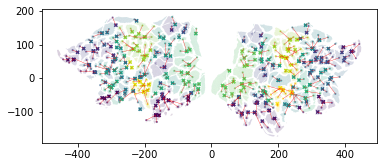

In [420]:
ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

cmap = plt.get_cmap('viridis',334)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

for seg in list(set(polyset.keys()) - set(missingVoxels)):
    patches = [Polygon(tri, edgecolor = None, facecolor=cmap(seg), alpha=0.2) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])

gg = GG['gg']
hh = GG['hh']
plt.scatter(*hh.T,c=np.arange(328), marker='x', s=10)
plt.scatter(*gg.T,c=np.arange(328), marker='.', alpha=0.5, s=6)
plt.plot(np.array([gg.T[0,:],hh.T[0,:]]),np.array([gg.T[1,:],hh.T[1,:]]),linewidth=0.3, color='r')
plt.axis('scaled')
plt.show()

In [383]:
gg = GG['gg']
hh = GG['hh']
ax.scatter(*hh.T,c=np.arange(328), marker='x', s=10)
ax.scatter(*gg.T,c=np.arange(328), marker='.', alpha=0.5, s=6)
for i in range(len(gg)):
    ax.plot(
        np.array([gg.T[0,i],hh.T[0,i]]),np.array([gg.T[1,i],hh.T[1,i]]),np.array([gg.T[2,i],hh.T[2,i]]),
             linewidth=0.3, color='r')


/home/Jacob/anaconda3/lib/python3.7/site-packages/numpy/lib/function_base.py:393: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/Jacob/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


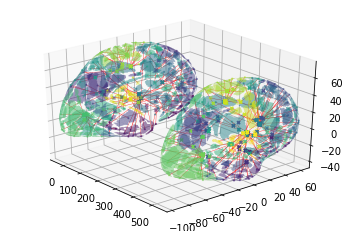

In [387]:
ax = plt.subplot(111, projection='3d')
ax.set_ylim(ylim3)
ax.set_xlim(xlim3)
ax.set_zlim(zlim3)

cmap = plt.get_cmap('viridis', 334)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

for seg in list(set(polyset.keys()) - set(missingVoxels)):
    
    patches = [ax.add_collection3d(Poly3DCollection(
        tri, edgecolor = None, facecolor=cmap(seg), alpha=0.6)) 
                                   for tri in polyset3[seg]]
    #polyobs[seg] = PatchCollection(patches,match_original=True)
    #ax.add_collection3d(*patches)


gg = GG['gg']
hh = GG['hh']
ax.scatter(*hh.T,c=np.arange(328), marker='x', s=10)
ax.scatter(*gg.T,c=np.arange(328), marker='.', alpha=0.5, s=6)
for i in range(len(gg)):
    ax.plot(
        np.array([gg.T[0,i],hh.T[0,i]]),np.array([gg.T[1,i],hh.T[1,i]]),np.array([gg.T[2,i],hh.T[2,i]]),
             linewidth=0.3, color='r')

#plt.axis('scaled')
    
ax.view_init(30, -40)

plt.savefig('temp.png',dpi=300)

plt.show()


In [472]:
spec = ['/keilholz-lab/Jacob/TDABrains_00/data/null_WG33/Gordon333NodeNames.txt','labels']
temp = pd.read_csv(spec[0],header=None,in)
masksS[spec[1]] = temp
print(masksS[spec[1]].shape)

(333, 1)


In [809]:
np.histogram(gg
             [:130
              ,0])

(array([13, 23,  3, 16,  7,  7, 21,  4, 20, 16]),
 array([-443.08157349, -354.62298889, -266.1644043 , -177.7058197 ,
         -89.24723511,   -0.78865051,   87.66993408,  176.12851868,
         264.58710327,  353.04568787,  441.50427246]))

In [473]:
temp = masks['labels']
temp

,0
0,L_Default_1
1,L_SMhand_2
2,L_SMmouth_3
3,L_Default_4
4,L_Visual_5
...,...
328,R_Auditory_329
329,R_Auditory_330
330,R_Default_331
331,R_VentralAttn_332


In [446]:
# Do clustering at granularity = grain

grain = 17
clusts = fcluster(GG['linkage'], t=grain, criterion='maxclust')


In [447]:
WCT = computeWCT(adata, clusts)
coarseData = np.squeeze(np.concatenate(WCT,axis=2))

Cross wavelets:  49%|████▊     | 66/136 [00:00<00:00, 656.53it/s]

(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([4875, 3965, 2444, 1791,  976,  582,  270,  172,  128,   52]), array([2.42238223e-07, 1.69416418e-03, 3.38808612e-03, 5.08200806e-03,
       6.77593000e-03, 8.46985194e-03, 1.01637739e-02, 1.18576958e-02,
       1.35516178e-02, 1.52455397e-02, 1.69394616e-02]))


  0%|          | 0/17 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8623, 2805, 1625,  884,  608,  412,  182,   53,   36,   27]), array([0.        , 0.05045384, 0.10090769, 0.15136153, 0.20181537,
       0.25226922, 0.30272306, 0.3531769 , 0.40363075, 0.45408459,
       0.50453843]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 59, 104, 108, 108,  79, 101,  85,  16,  41,  76]), array([0.19481514, 0.26202997, 0.32924481, 0.39645965, 0.46367448,
       0.53088932, 0.59810416, 0.66531899, 0.73253383, 0.79974867,
       0.8669635 ]))


Wavelet coherence:   0%|          | 0/136 [00:00<?, ?it/s]

(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([8965, 3746, 1144,  583,  295,  197,  134,   87,   70,   34]), array([5.28668221e-07, 4.57889742e-03, 9.15726617e-03, 1.37356349e-02,
       1.83140037e-02, 2.28923724e-02, 2.74707412e-02, 3.20491099e-02,
       3.66274787e-02, 4.12058474e-02, 4.57842162e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9892, 2607, 1479,  646,  366,   92,   76,   64,   11,   22]), array([0.        , 0.06578501, 0.13157003, 0.19735504, 0.26314006,
       0.32892507, 0.39471008, 0.4604951 , 0.52628011, 0.59206513,
       0.65785014]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 39,  50,  64,  32,  87,  69,  92,  81,  85, 178]), array([0.33085652, 0.3826359 , 0.43441529, 0.48619467, 0.53797406,
       0.58975344, 0.64153283, 0.69331221, 0.7450916 , 0.79687098,
       0.84865036]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([10146,  3342,   575,   351,   260,   224,    96,   123,    60,
          78]), array([4.95157881e-07, 4.05146125e-03, 8.10242734e-03, 1.21533934e-02,
       1.62043595e-02, 2.02553256e-02, 2.43062917e-02, 2.83572578e-02,
       3.24082239e-02, 3.64591900e-02, 4.05101561e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8483, 2312, 1495,  812,  652,  623,  500,  219,  112,   47]), array([0.        , 0.04181359, 0.08362718, 0.12544078, 0.16725437,
       0.20906796, 0.25088155, 0.29269514, 0.33450873, 0.37632233,
       0.41813592]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 40,  61,  44, 103, 176, 126, 105,  76,  20,  26]), array([0.08689144, 0.15611528, 0.22533913, 0.29456297, 0.36378681,
       0.43301066, 0.5022345 , 0.57145834, 0.64068218, 0.70990603,
       0.77912987]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([7951, 4182, 1417,  726,  457,  227,  162,   70,   37,   26]), array([2.19862333e-07, 2.79351660e-03, 5.58681334e-03, 8.38011008e-03,
       1.11734068e-02, 1.39667036e-02, 1.67600003e-02, 1.95532970e-02,
       2.23465938e-02, 2.51398905e-02, 2.79331872e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8717, 3084, 1724, 1006,  413,  103,  105,   54,   17,   32]), array([0.        , 0.05611858, 0.11223716, 0.16835575, 0.22447433,
       0.28059291, 0.33671149, 0.39283007, 0.44894866, 0.50506724,
       0.56118582]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 22,  67,  61,  76,  87,  66,  79,  92, 164,  63]), array([0.1955508 , 0.25466703, 0.31378325, 0.37289948, 0.43201571,
       0.49113194, 0.55024816, 0.60936439, 0.66848062, 0.72759685,
       0.78671307]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([9898, 2948, 1283,  610,  304,   78,   48,   41,   15,   30]), array([1.47810422e-07, 2.34708856e-03, 4.69402931e-03, 7.04097006e-03,
       9.38791081e-03, 1.17348516e-02, 1.40817923e-02, 1.64287331e-02,
       1.87756738e-02, 2.11226146e-02, 2.34695553e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9211, 2335, 1569, 1046,  579,  290,  121,   38,   22,   44]), array([0.        , 0.05444492, 0.10888984, 0.16333476, 0.21777968,
       0.2722246 , 0.32666952, 0.38111444, 0.43555936, 0.49000428,
       0.54444919]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 84,  40,  25,  67,  84, 101, 125, 160,  52,  39]), array([0.09193712, 0.15150255, 0.21106799, 0.27063343, 0.33019887,
       0.3897643 , 0.44932974, 0.50889518, 0.56846061, 0.62802605,
       0.68759149]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([6989, 2915, 2243, 1291,  536,  364,  304,  233,  185,  195]), array([1.16009190e-06, 2.39792675e-03, 4.79469342e-03, 7.19146008e-03,
       9.58822674e-03, 1.19849934e-02, 1.43817601e-02, 1.67785267e-02,
       1.91752934e-02, 2.15720601e-02, 2.39688267e-02]))


Cross wavelets:  83%|████████▎ | 113/136 [00:00<00:00, 1127.07it/s]

one W12 norms histogram, having shape (15, 1017)
(array([7481, 2556, 1986, 1242,  882,  420,  328,  237,   65,   58]), array([0.        , 0.03959337, 0.07918674, 0.11878012, 0.15837349,
       0.19796686, 0.23756023, 0.27715361, 0.31674698, 0.35634035,
       0.39593372]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 26,  40,  76,  82, 110, 111, 140, 116,  56,  20]), array([0.0806595 , 0.14294532, 0.20523115, 0.26751697, 0.3298028 ,
       0.39208862, 0.45437445, 0.51666027, 0.5789461 , 0.64123192,
       0.70351775]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([9106, 3582, 1134,  534,  377,  200,  181,   88,   32,   21]), array([1.41609674e-07, 4.41615338e-03, 8.83216516e-03, 1.32481769e-02,
       1.76641887e-02, 2.20802005e-02, 2.64962123e-02, 3.09122240e-02,
       3.53282358e-02, 3.97442476e-02, 4.41602594e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8064, 2356, 1712, 1124,  675,  571,  430,  195,   85,   43]), array([0.        , 0.04111317, 0.08222633, 0.1233395 , 0.16445266,
       0.20556583, 0.24667899, 0.28779216, 0.32890532, 0.37001849,
       0.41113165]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 84,  83,  95, 126, 137,  81,  49,  48,  41,  33]), array([0.40394401, 0.44479855, 0.4856531 , 0.52650764, 0.56736218,
       0.60821673, 0.64907127, 0.68992582, 0.73078036, 0.7716349 ,
       0.81248945]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([7869, 3185, 1577,  944,  883,  195,  186,  154,  190,   72]), array([2.33089148e-07, 5.74456748e-03, 1.14889019e-02, 1.72332363e-02,
       2.29775707e-02, 2.87219050e-02, 3.44662394e-02, 4.02105738e-02,
       4.59549082e-02, 5.16992426e-02, 5.74435770e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9514, 2446, 1655,  829,  443,  183,   77,   32,   60,   16]), array([0.        , 0.06009924, 0.12019848, 0.18029772, 0.24039696,
       0.3004962 , 0.36059544, 0.42069468, 0.48079392, 0.54089316,
       0.60099241]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 25,  71, 115,  67, 106,  76, 141,  96,  32,  48]), array([0.32227069, 0.37252903, 0.42278737, 0.47304571, 0.52330406,
       0.5735624 , 0.62382074, 0.67407909, 0.72433743, 0.77459577,
       0.82485411]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([6670, 3676, 1798, 1111,  810,  354,  297,  274,  176,   89]), array([2.97959762e-07, 2.42104757e-03, 4.84179718e-03, 7.26254679e-03,
       9.68329641e-03, 1.21040460e-02, 1.45247956e-02, 1.69455452e-02,
       1.93662949e-02, 2.17870445e-02, 2.42077941e-02]))


Cross wavelets:  76%|███████▌  | 103/136 [00:00<00:00, 1028.73it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9243, 2373, 1450,  661,  658,  459,  157,  129,   85,   40]), array([0.        , 0.05083784, 0.10167567, 0.15251351, 0.20335134,
       0.25418918, 0.30502701, 0.35586485, 0.40670269, 0.45754052,
       0.50837836]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 60,  86,  30, 122, 130,  82,  54,  69,  32, 112]), array([0.27488109, 0.3366029 , 0.39832471, 0.46004652, 0.52176834,
       0.58349015, 0.64521196, 0.70693377, 0.76865559, 0.8303774 ,
       0.89209921]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([8092, 3883, 1736,  642,  455,  236,   58,   75,   28,   50]), array([2.75640154e-07, 5.36277108e-03, 1.07252665e-02, 1.60877619e-02,
       2.14502574e-02, 2.68127528e-02, 3.21752483e-02, 3.75377437e-02,
       4.29002391e-02, 4.82627346e-02, 5.36252300e-02]))


Cross wavelets:  82%|████████▏ | 111/136 [00:00<00:00, 1105.37it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9594, 2601, 1257,  617,  432,  339,  243,  129,   22,   21]), array([0.        , 0.05720764, 0.11441528, 0.17162291, 0.22883055,
       0.28603819, 0.34324583, 0.40045346, 0.4576611 , 0.51486874,
       0.57207638]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 70,  58,  19,  20,  65,  95, 104, 146, 100, 100]), array([0.22639192, 0.29754651, 0.3687011 , 0.4398557 , 0.51101029,
       0.58216488, 0.65331947, 0.72447406, 0.79562866, 0.86678325,
       0.93793784]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([6091, 4344, 2201, 1111,  413,  345,  320,  171,   91,  168]), array([6.04356341e-07, 4.33517637e-03, 8.66974838e-03, 1.30043204e-02,
       1.73388924e-02, 2.16734644e-02, 2.60080364e-02, 3.03426084e-02,
       3.46771804e-02, 3.90117525e-02, 4.33463245e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([10823,  1750,   995,   563,   362,   239,   299,    90,    61,
          73]), array([0.        , 0.06415193, 0.12830386, 0.19245579, 0.25660773,
       0.32075966, 0.38491159, 0.44906352, 0.51321545, 0.57736738,
       0.64151931]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 33,  31,  18,  22,  14, 179, 167, 117,  67, 129]), array([0.51773287, 0.55249364, 0.5872544 , 0.62201517, 0.65677593,
       0.6915367 , 0.72629746, 0.76105822, 0.79581899, 0.83057975,
       0.86534052]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([6023, 3012, 2197, 1580,  707,  500,  543,  432,  195,   66]), array([2.10505049e-07, 1.58607014e-03, 3.17192977e-03, 4.75778940e-03,
       6.34364903e-03, 7.92950866e-03, 9.51536829e-03, 1.11012279e-02,
       1.26870876e-02, 1.42729472e-02, 1.58588068e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9280, 2526, 1374,  822,  464,  280,  227,  202,   28,   52]), array([0.        , 0.05243552, 0.10487104, 0.15730657, 0.20974209,
       0.26217761, 0.31461313, 0.36704865, 0.41948417, 0.4719197 ,
       0.52435522]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 24,  99, 253, 148,  53,  44,  37,  22,  29,  68]), array([0.14409306, 0.21259049, 0.28108793, 0.34958537, 0.41808281,
       0.48658024, 0.55507768, 0.62357512, 0.69207255, 0.76056999,
       0.82906743]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([6240, 4872, 2384,  714,  356,  314,  172,  101,   64,   38]), array([1.67108660e-07, 2.18589334e-03, 4.37161957e-03, 6.55734580e-03,
       8.74307203e-03, 1.09287983e-02, 1.31145245e-02, 1.53002507e-02,
       1.74859770e-02, 1.96717032e-02, 2.18574294e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([10145,  2544,  1143,   602,   280,   102,   183,   113,    86,
          57]), array([0.        , 0.06361991, 0.12723981, 0.19085972, 0.25447963,
       0.31809954, 0.38171944, 0.44533935, 0.50895926, 0.57257916,
       0.63619907]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 52,  10,  14,  43, 111, 109,  96, 131, 136,  75]), array([0.38597508, 0.43775097, 0.48952686, 0.54130275, 0.59307864,
       0.64485453, 0.69663042, 0.74840631, 0.80018221, 0.8519581 ,
       0.90373399]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([8108, 3557, 1313,  931,  556,  332,  231,  133,   65,   29]), array([3.28334043e-07, 4.54298091e-03, 9.08563348e-03, 1.36282861e-02,
       1.81709386e-02, 2.27135912e-02, 2.72562438e-02, 3.17988964e-02,
       3.63415489e-02, 4.08842015e-02, 4.54268541e-02]))


Cross wavelets:  49%|████▉     | 67/136 [00:00<00:00, 668.41it/s]

one W12 norms histogram, having shape (15, 1017)
(array([8124, 2207, 1528,  996,  846,  681,  462,  267,  100,   44]), array([0.        , 0.03915227, 0.07830455, 0.11745682, 0.15660909,
       0.19576137, 0.23491364, 0.27406591, 0.31321819, 0.35237046,
       0.39152274]))
wct is shape (136, 1, 777).
One wct histogram
(array([101, 110,  67,  43,  74, 102, 105,  51,  41,  83]), array([0.13502507, 0.19443312, 0.25384117, 0.31324922, 0.37265727,
       0.43206532, 0.49147337, 0.55088142, 0.61028947, 0.66969751,
       0.72910556]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([6912, 4862, 2105,  703,  314,  200,  110,   11,   14,   24]), array([5.51362323e-07, 4.00795073e-03, 8.01535010e-03, 1.20227495e-02,
       1.60301488e-02, 2.00375482e-02, 2.40449476e-02, 2.80523469e-02,
       3.20597463e-02, 3.60671457e-02, 4.00745450e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9102, 2188, 1449,  781,  562,  431,  280,  238,  135,   89]), array([0.        , 0.04647326, 0.09294653, 0.13941979, 0.18589305,
       0.23236631, 0.27883958, 0.32531284, 0.3717861 , 0.41825937,
       0.46473263]))
wct is shape (136, 1, 777).
One wct histogram
(array([149,  59,  54,  44,  57,  60,  66, 164,  66,  58]), array([0.40067495, 0.44730559, 0.49393623, 0.54056687, 0.58719751,
       0.63382815, 0.68045879, 0.72708943, 0.77372007, 0.8203507 ,
       0.86698134]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([8408, 3667, 1816,  626,  441,  195,   22,   26,   37,   17]), array([3.54028789e-07, 6.27063243e-03, 1.25409108e-02, 1.88111892e-02,
       2.50814676e-02, 3.13517460e-02, 3.76220244e-02, 4.38923028e-02,
       5.01625812e-02, 5.64328596e-02, 6.27031380e-02]))


Cross wavelets:   0%|          | 0/136 [00:00<?, ?it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9625, 2318, 1359,  645,  488,  426,  260,   84,   15,   35]), array([0.        , 0.0558786 , 0.11175721, 0.16763581, 0.22351441,
       0.27939301, 0.33527162, 0.39115022, 0.44702882, 0.50290743,
       0.55878603]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 32,  17,  57,  17,  23,  98, 156,  93, 188,  96]), array([0.34433452, 0.39809998, 0.45186545, 0.50563091, 0.55939638,
       0.61316185, 0.66692731, 0.72069278, 0.77445824, 0.82822371,
       0.88198918]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([4306, 2141, 2450, 2187, 1760,  985,  843,  332,  182,   69]), array([3.17872749e-07, 2.98806364e-03, 5.97580941e-03, 8.96355518e-03,
       1.19513010e-02, 1.49390467e-02, 1.79267925e-02, 2.09145383e-02,
       2.39022840e-02, 2.68900298e-02, 2.98777756e-02]))


Cross wavelets:  82%|████████▏ | 111/136 [00:00<00:00, 1105.76it/s]

one W12 norms histogram, having shape (15, 1017)
(array([9120, 2368, 1668,  871,  672,  296,  119,   57,   43,   41]), array([0.        , 0.05293567, 0.10587134, 0.15880701, 0.21174268,
       0.26467835, 0.31761402, 0.37054969, 0.42348536, 0.47642103,
       0.5293567 ]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 26,  61,  70,  31,  26,  51,  65, 152, 158, 137]), array([0.32604314, 0.37917397, 0.4323048 , 0.48543563, 0.53856646,
       0.59169729, 0.64482812, 0.69795895, 0.75108978, 0.80422061,
       0.85735145]))
(17, 15, 1017)
Smooth wavelets
One smoothed values histogram
(array([7539, 3927, 1678,  962,  603,  184,  123,   97,   71,   71]), array([4.39517814e-07, 3.46520853e-03, 6.92997753e-03, 1.03947465e-02,
       1.38595155e-02, 1.73242846e-02, 2.07890536e-02, 2.42538226e-02,
       2.77185916e-02, 3.11833606e-02, 3.46481296e-02]))


100%|██████████| 136/136 [00:00<00:00, 362.03it/s]


one W12 norms histogram, having shape (15, 1017)
(array([9080, 2741, 1611, 1153,  455,   89,   30,   65,   14,   17]), array([0.        , 0.05843588, 0.11687176, 0.17530764, 0.23374352,
       0.2921794 , 0.35061528, 0.40905116, 0.46748704, 0.52592292,
       0.5843588 ]))
wct is shape (136, 1, 777).
One wct histogram
(array([ 37, 122, 143,  55, 106, 132,  41,  43,  53,  45]), array([0.19141629, 0.25171258, 0.31200887, 0.37230515, 0.43260144,
       0.49289773, 0.55319402, 0.61349031, 0.6737866 , 0.73408289,
       0.79437917]))


In [426]:
print(grain)
print(coarseData.shape)

32
(496, 13986)


In [427]:
goodStates

['Null', 'Fixation', 'Rest', 'Memory', 'Video', 'Math']

In [477]:
valence = 'less'
e = 3
perf = 'correct'
inds = outTargs[valence][e][perf]['Simplex_1']['inds']
fracs = outTargs[valence][e][perf]['Simplex_1']['fracs']

In [478]:
sets = np.zeros(6)
for aa,bb in zip(inds,fracs):
    sets[CE[aa]] +=bb

In [479]:
sets

array([0.        , 0.06394238, 0.06067701, 0.56852019, 0.13032066,
       0.17653976])

In [476]:
sets

array([0.        , 0.08844529, 0.13456214, 0.21108116, 0.10065569,
       0.46525572])

In [448]:
GG['DGMS'][grain] = {}

dirname = 'toMatlab_grain{}/'.format(grain)
makedirs(dirname ,exist_ok=True)

coarseOuts = {'more':{}, 'less':{}}

for ei, e in enumerate(types_ce[2:], start=0):            
    coarseOuts['less'][e] = {}
    coarseOuts['more'][e] = {}

    for pi, perf in enumerate(['correct']):
        
        for valence in ['more','less']:
            inds = outTargs[valence][e][perf]['Simplex_1']['inds']
            fracs = outTargs[valence][e][perf]['Simplex_1']['fracs']
            temp = np.concatenate([(coarseData[:,aa]*bb)[:,None] for aa,bb in zip(inds,fracs)],axis=1)
            combinationName = '{}_{}_{}'.format(goodStates[e],perf,valence)

            graph = squareform(np.sum(temp,axis=1))
            np.savetxt(X=graph, fname=dirname+ combinationName + '.txt', delimiter=',')                
            print([grain, combinationName])
            print(np.histogram(squareform(graph)))
            GG['DGMS'][grain][combinationName] = rips['dgms']
            
graph = squareform(np.mean(coarseData,axis=1))
np.savetxt(X=graph, fname=dirname+'All_all_all.txt', delimiter=',')                
rips = ripser(graph, distance_matrix=True, maxdim=1)
GG['DGMS'][grain]['All_all_all'] = rips['dgms']

graph = squareform(np.mean(coarseData[:,CE==2],axis=1))
np.savetxt(X=graph, fname=dirname+'Rest_rest_rest.txt', delimiter=',')                
rips = ripser(graph, distance_matrix=True, maxdim=1)
GG['DGMS'][grain]['Rest_rest_rest'] = rips['dgms']


[17, 'Memory_correct_more']
(array([ 4,  2,  8,  5, 14, 22, 28, 34, 16,  3]), array([0.51360302, 0.55421913, 0.59483523, 0.63545134, 0.67606745,
       0.71668356, 0.75729966, 0.79791577, 0.83853188, 0.87914799,
       0.9197641 ]))
[17, 'Memory_correct_less']
(array([ 3,  4,  6, 12, 11, 25, 17, 24, 22, 12]), array([0.40312514, 0.44818966, 0.49325418, 0.5383187 , 0.58338322,
       0.62844774, 0.67351226, 0.71857678, 0.7636413 , 0.80870582,
       0.85377034]))
[17, 'Video_correct_more']
(array([ 5,  2,  6,  8, 18, 20, 27, 26, 19,  5]), array([0.39087854, 0.43989572, 0.48891291, 0.53793009, 0.58694727,
       0.63596445, 0.68498164, 0.73399882, 0.783016  , 0.83203319,
       0.88105037]))
[17, 'Video_correct_less']
(array([ 7,  7,  5, 15, 14, 24, 36, 15, 10,  3]), array([0.43848389, 0.48406781, 0.52965172, 0.57523563, 0.62081954,
       0.66640345, 0.71198736, 0.75757127, 0.80315518, 0.84873909,
       0.894323  ]))
[17, 'Math_correct_more']
(array([ 6,  1, 10, 12, 19, 18, 34, 22, 12, 

(array([ 32.,   0.,   0.,   0.,  46., 182., 208., 282., 210.,  64.]),
 array([0.        , 0.08335233, 0.16670465, 0.25005698, 0.33340931,
        0.41676164, 0.50011396, 0.58346629, 0.66681862, 0.75017095,
        0.83352327]),
 <a list of 10 Patch objects>)

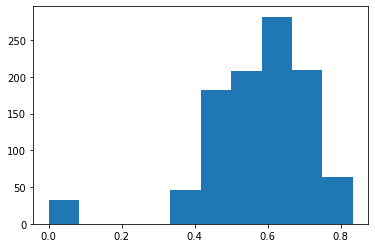

In [429]:
plt.hist(graph.ravel())

In [727]:
grain

33

In [ ]:
plot

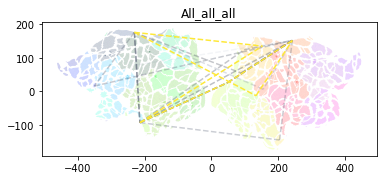

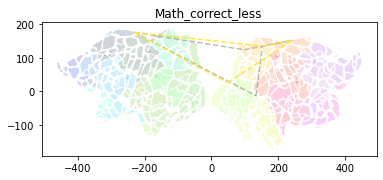

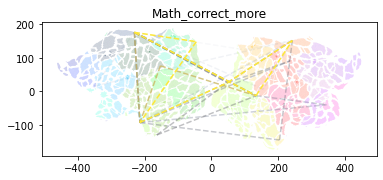

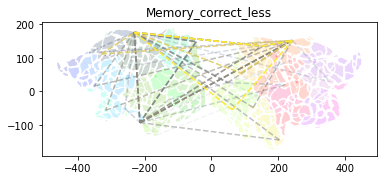

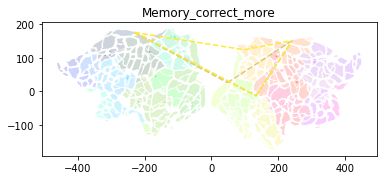

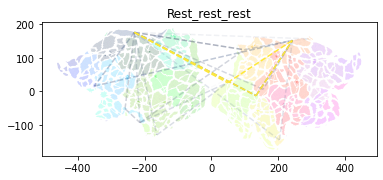

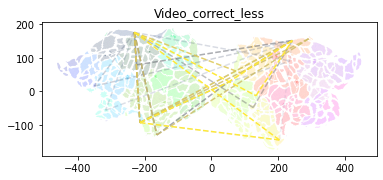

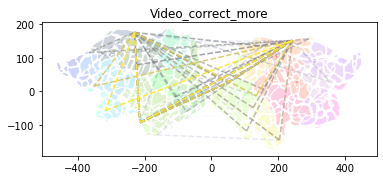

In [467]:
#grain = 34
setIn = p_utils.getSecondList('./fromMatlab_grain{}/'.format(grain))

for seti, aset in enumerate(setIn):
    
    fig = plt.figure(seti)
    
    with open('./fromMatlab_grain{}/'.format(grain) + aset + '.txt', 'r') as file:
        tt=file.readlines()

    lifetimes = []
    yy=tt[0].split(sep='),')
    for y in yy:
        newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
        lifetimes.append( np.array([float(i) for i in newstr.split()]).reshape([-1,2]) )

    generators = []
    yy=tt[1].split(sep='],')
    for y in yy:
        newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
        generators.append( np.array([int(i) for i in newstr.split()]).reshape([-1,2]) )                       

    ax = plt.subplot(111)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)

    this = GG

    cmap_name = 'gist_ncar'
    cmap = plt.get_cmap(cmap_name,max(clusts)+6)

    ax.set_title(aset)

    polyobs = {}

    missingVoxels = [133, 296, 299, 302, 304]

    facecolors = []
    for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
        patches = [Polygon(tri, edgecolor = None, 
                           facecolor=cmap(clusts[segi]), 
                           alpha=0.2) for tri in polyset[seg]]
        polyobs[seg] = PatchCollection(patches,match_original=True)
        ax.add_collection(polyobs[seg])
        facecolors.append(clusts[segi])

        pts = geo.MultiPoint(hh[clusts==2,:])

    targs = []
    targs_full = np.empty(clusts.shape, dtype='int')
    for clu in np.unique(clusts):
        those = clusts==clu
        temp = avgG[those,:][:,those]
        temp = np.mean(temp,axis=0)
        temp = np.argmax(temp)
        val = np.arange(len(clusts))[those][temp]
        targs.append(val)
        targs_full[those] = val

    xoffset = [-30,0]
    if len(generators[0]):
        lifetimes_d = np.diff(lifetimes)
        maxLife = np.max(lifetimes_d)
        argLife = np.argsort(np.concatenate(lifetimes_d).ravel())    
        cmap0 = plt.get_cmap('cividis', 256)
        for ci, ind in enumerate(argLife):
            cc = generators[ind]
            life = float(lifetimes_d[ind])
            for row,col in cc:
                color = cmap0(int((life/maxLife)*256))
                xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
                ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]

                plt.plot(xs,ys,linestyle='--',color=color,alpha=(life/maxLife))

    plt.axis('scaled')    
#    plt.savefig('./coarseFigures/grain{}_'.format(grain)+aset+'.png')    
    plt.show()
    

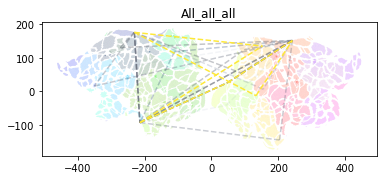

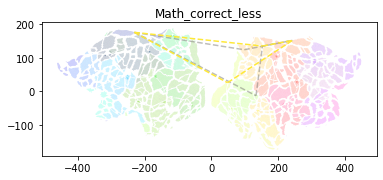

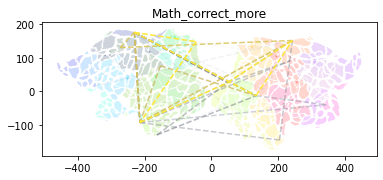

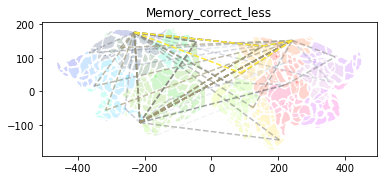

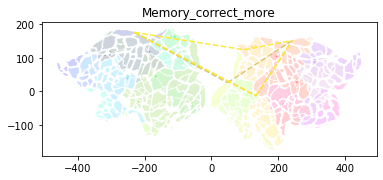

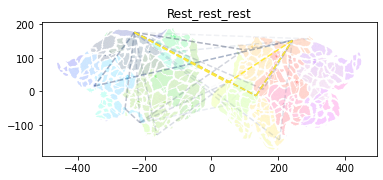

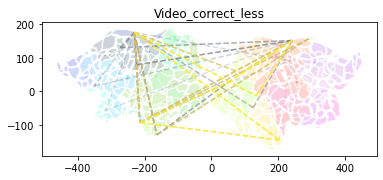

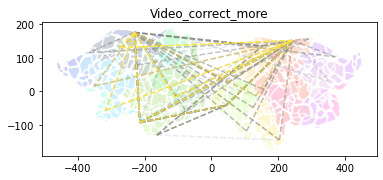

In [470]:
#grain = 34
setIn = p_utils.getSecondList('./fromMatlab_grain{}/'.format(grain))

for seti, aset in enumerate(setIn):
    
    fig = plt.figure(seti)
    
    with open('./fromMatlab_grain{}/'.format(grain) + aset + '.txt', 'r') as file:
        tt=file.readlines()

    lifetimes = []
    yy=tt[0].split(sep='),')
    for y in yy:
        newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
        lifetimes.append( np.array([float(i) for i in newstr.split()]).reshape([-1,2]) )

    generators = []
    yy=tt[1].split(sep='],')
    for y in yy:
        newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
        generators.append( np.array([int(i) for i in newstr.split()]).reshape([-1,2]) )                       

    ax = plt.subplot(111)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)

    this = GG

    cmap_name = 'gist_ncar'
    cmap = plt.get_cmap(cmap_name,max(clusts)+6)

    ax.set_title(aset)

    polyobs = {}

    missingVoxels = [133, 296, 299, 302, 304]

    facecolors = []
    for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
        patches = [Polygon(tri, edgecolor = None, 
                           facecolor=cmap(clusts[segi]), 
                           alpha=0.2) for tri in polyset[seg]]
        polyobs[seg] = PatchCollection(patches,match_original=True)
        ax.add_collection(polyobs[seg])
        facecolors.append(clusts[segi])

        pts = geo.MultiPoint(hh[clusts==2,:])

    targs = []
    targs_full = np.empty(clusts.shape, dtype='int')
    for clu in np.unique(clusts):
        those = clusts==clu
        temp = avgG[those,:][:,those]
        temp = np.mean(temp,axis=0)
        temp = np.argmax(temp)
        val = np.arange(len(clusts))[those][temp]
        targs.append(val)
        targs_full[those] = val

    xoffset = [-30,0]
    if len(generators[0]):
        lifetimes_d = np.diff(lifetimes)
        maxLife = np.max(lifetimes_d)
        argLife = np.argsort(np.concatenate(lifetimes_d).ravel())    
        cmap0 = plt.get_cmap('cividis', 256)
        for ci, ind in enumerate(argLife):
            cc = generators[ind]
            life = float(lifetimes_d[ind])
            for row,col in cc:
                color = cmap0(int((life/maxLife)*256))
                xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
                ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]

                plt.plot(xs,ys,linestyle='--',color=color,alpha=(life/maxLife))

    plt.axis('scaled')    
    #plt.savefig('./coarseFigures/grain{}_'.format(grain)+aset+'.png')    
    plt.show()
    

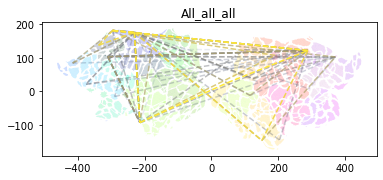

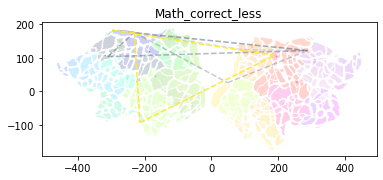

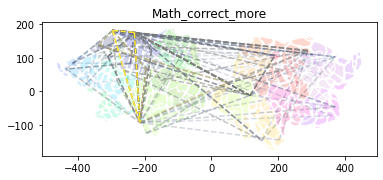

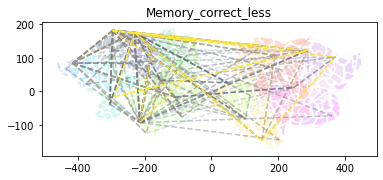

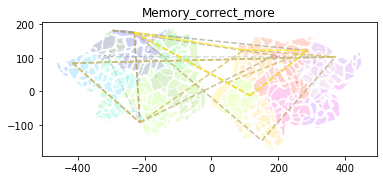

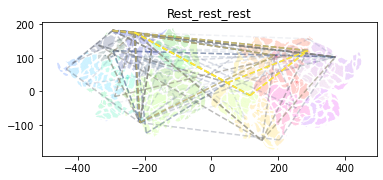

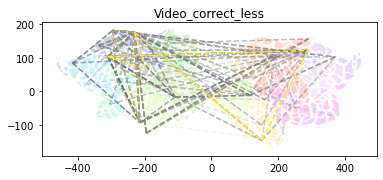

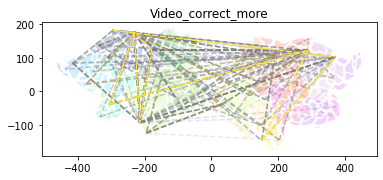

In [512]:
#grain = 34
setIn = p_utils.getSecondList('./fromMatlab_grain{}/'.format(grain))

for seti, aset in enumerate(setIn):
    
    fig = plt.figure(seti)
    
    with open('./fromMatlab_grain{}/'.format(grain) + aset + '.txt', 'r') as file:
        tt=file.readlines()

    lifetimes = []
    yy=tt[0].split(sep='),')
    for y in yy:
        newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
        lifetimes.append( np.array([float(i) for i in newstr.split()]).reshape([-1,2]) )

    generators = []
    yy=tt[1].split(sep='],')
    for y in yy:
        newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
        generators.append( np.array([int(i) for i in newstr.split()]).reshape([-1,2]) )                       

    ax = plt.subplot(111)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)

    this = GG

    cmap_name = 'gist_ncar'
    cmap = plt.get_cmap(cmap_name,max(clusts)+6)

    ax.set_title(aset)

    polyobs = {}

    missingVoxels = [133, 296, 299, 302, 304]

    facecolors = []
    for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
        patches = [Polygon(tri, edgecolor = None, 
                           facecolor=cmap(clusts[segi]), 
                           alpha=0.2) for tri in polyset[seg]]
        polyobs[seg] = PatchCollection(patches,match_original=True)
        ax.add_collection(polyobs[seg])
        facecolors.append(clusts[segi])

        pts = geo.MultiPoint(hh[clusts==2,:])

    targs = []
    targs_full = np.empty(clusts.shape, dtype='int')
    for clu in np.unique(clusts):
        those = clusts==clu
        temp = avgG[those,:][:,those]
        temp = np.mean(temp,axis=0)
        temp = np.argmin(temp)
        val = np.arange(len(clusts))[those][temp]
        targs.append(val)
        targs_full[those] = val

    xoffset = [-30,0]
    if len(generators[0]):
        lifetimes_d = np.diff(lifetimes)
        maxLife = np.max(lifetimes_d)
        argLife = np.argsort(np.concatenate(lifetimes_d).ravel())    
        cmap0 = plt.get_cmap('cividis', 256)
        for ci, ind in enumerate(argLife):
            cc = generators[ind]
            life = float(lifetimes_d[ind])
            for row,col in cc:
                color = cmap0(int((life/maxLife)*256))
                xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
                ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]

                plt.plot(xs,ys,linestyle='--',color=color,alpha=(life/maxLife))

    plt.axis('scaled')    
    #plt.savefig('./coarseFigures/grain{}_'.format(grain)+aset+'.png')    
    plt.show()
    

In [861]:
#grain = 32
setIn = p_utils.getSecondList('./fromMatlab_grain{}/'.format(grain))

seti = 0 
aset = setIn[0]


In [237]:
setIn

['All_all_all',
 'Math_correct_less',
 'Math_correct_more',
 'Memory_correct_less',
 'Memory_correct_more',
 'Rest_rest_rest',
 'Video_correct_less',
 'Video_correct_more']

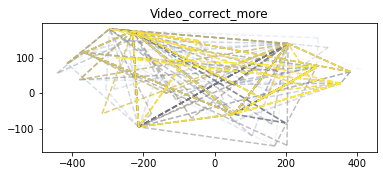

In [127]:
#grain = 32
setIn = p_utils.getSecondList('./fromMatlab_grain{}/'.format(grain))

setNum = 7
seti = setNum 
aset = setIn[setNum]

fig = plt.figure(seti)

with open('./fromMatlab_grain{}/'.format(grain) + aset + '.txt', 'r') as file:
    tt=file.readlines()

lifetimes = []
yy=tt[0].split(sep='),')
for y in yy:
    newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
    lifetimes.append( np.array([float(i) for i in newstr.split()]).reshape([-1,2]) )

generators = []
yy=tt[1].split(sep='],')
for y in yy:
    newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
    generators.append( np.array([int(i) for i in newstr.split()]).reshape([-1,2]) )                       

ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

this = GG

cmap_name = 'gist_rainbow'
cmap = plt.get_cmap(cmap_name,max(clusts))

ax.set_title(aset)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]
'''
facecolors = []
for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
    patches = [Polygon(tri, edgecolor = None, 
                       facecolor=cmap(clusts[segi]), 
                       alpha=0.2) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])
    facecolors.append(clusts[segi])

    pts = geo.MultiPoint(hh[clusts==2,:])
'''
targs = []
targs_full = np.empty(clusts.shape, dtype='int')
for clu in np.unique(clusts):
    those = clusts==clu
    temp = avgG[those,:][:,those]
    temp = np.mean(temp,axis=0)
    temp = np.argmax(temp)
    val = np.arange(len(clusts))[those][temp]
    targs.append(val)
    targs_full[those] = val

if len(generators[0]):
    lifetimes_d = np.diff(lifetimes)
    maxLife = np.max(lifetimes_d)
    argLife = np.argsort(np.concatenate(lifetimes_d).ravel())    
    cmap0 = plt.get_cmap('cividis', 256)
    for ci, ind in enumerate(argLife):
        cc = generators[ind]
        life = float(lifetimes_d[ind])
        for row,col in cc:
            color = cmap0(int((life/maxLife)*255))
            xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
            ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]

            plt.plot(xs,ys,linestyle='--',color=color,alpha=(life/maxLife))

plt.axis('scaled')    
#plt.savefig('./coarseFigures/grain{}_'.format(grain)+aset+'.png')    
plt.show()


In [129]:
np.max(np.concatenate([generators[aL] for aL in argLife]))

63

In [94]:
lifetimes_d[argLife].ravel()/maxLife

array([0.06153846, 0.13846154, 0.16923077, 0.18461538, 0.2       ,
       0.2       , 0.21538462, 0.21538462, 0.26153846, 0.26153846,
       0.32307692, 0.4       , 0.41538462, 0.50769231, 0.50769231,
       0.58461538, 0.67692308, 0.73846154, 0.95384615, 1.        ])

In [87]:
life/maxLife

1.0

In [85]:
lifetimes_d.ravel()[argLife]

array([0.0044, 0.0099, 0.0121, 0.0132, 0.0143, 0.0143, 0.0154, 0.0154,
       0.0187, 0.0187, 0.0231, 0.0286, 0.0297, 0.0363, 0.0363, 0.0418,
       0.0484, 0.0528, 0.0682, 0.0715])

In [78]:
sorted(argLife)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

In [781]:
cmap0(4)


(0.01568627450980392, 0.5078431372549019, 0.4, 1.0)

In [791]:
cmap0(3)

(0.011764705882352941, 0.5058823529411764, 0.4, 1.0)

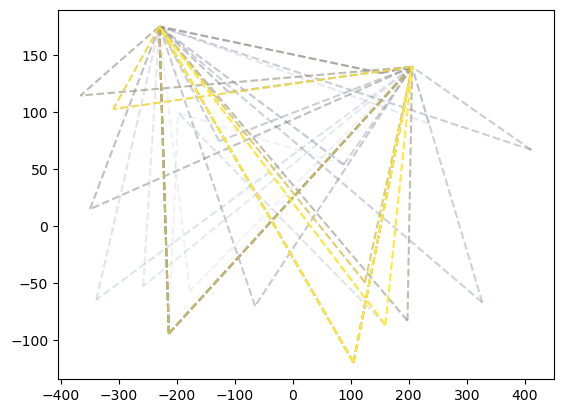

In [799]:
xoffset = [-30,0]
if len(generators[0]):
    lifetimes_d = np.diff(lifetimes)
    maxLife = np.max(lifetimes_d)
    argLife = np.argsort(np.concatenate(lifetimes_d).ravel())    
    cmap0 = plt.get_cmap('cividis', 256)
    for ci, ind in enumerate(argLife):
        cc = generators[ind]
        life = float(lifetimes_d[ind])
        for row,col in cc:
            color = cmap0(int((life/maxLife)*256))
            xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
            ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]

            plt.plot(xs,ys,linestyle='--',color=color,alpha=(life/maxLife))



In [746]:
cmap0(0.3)

(1.0, 0.72, 0.0, 1.0)

In [744]:
help(cmap0)

Help on LinearSegmentedColormap in module matplotlib.colors object:

class LinearSegmentedColormap(Colormap)
 |  LinearSegmentedColormap(name, segmentdata, N=256, gamma=1.0)
 |  
 |  Colormap objects based on lookup tables using linear segments.
 |  
 |  The lookup table is generated using linear interpolation for each
 |  primary color, with the 0-1 domain divided into any number of
 |  segments.
 |  
 |  Method resolution order:
 |      LinearSegmentedColormap
 |      Colormap
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, name, segmentdata, N=256, gamma=1.0)
 |      Create color map from linear mapping segments
 |      
 |      segmentdata argument is a dictionary with a red, green and blue
 |      entries. Each entry should be a list of *x*, *y0*, *y1* tuples,
 |      forming rows in a table. Entries for alpha are optional.
 |      
 |      Example: suppose you want red to increase from 0 to 1 over
 |      the bottom half, green to do the same over t

In [500]:
if len(generators[0]):
    3

In [458]:
masks['centroids'][:,0].shape

(328,)

In [461]:
avgG.shape

(328, 328)

In [462]:
clusts.shape

(328,)

###  Plot All

In [48]:
np.insert(np.random.permutation(np.unique(clusts)),0,0)

array([ 0, 21, 26, 41, 19,  7, 28, 18, 30, 42,  4, 31, 32, 33, 29, 37, 49,
       48,  1, 16,  9, 10, 34, 15,  2, 40, 50, 13, 12, 44, 38, 43, 22,  5,
       35, 39, 46, 11, 24, 47, 36,  3,  8, 23, 14, 25, 20, 45, 27,  6, 17],
      dtype=int32)

In [513]:
paint50=paint

In [633]:
rema

0

In [647]:
np.max(clusts)

64

In [757]:
alen = np.max(clusts)+1
resh = 8
rema = alen%resh
print(rema)
if rema:
    arr = np.arange(alen+resh-rema)
else:
    arr = np.arange(alen)    
paint = np.reshape(arr,[-1,resh]).T
paint = paint[paint<alen]
print(paint)

7
[ 0  8 16 24 32 40  1  9 17 25 33 41  2 10 18 26 34 42  3 11 19 27 35 43
  4 12 20 28 36 44  5 13 21 29 37 45  6 14 22 30 38 46  7 15 23 31 39]


In [452]:
# Do clustering at granularity = grain

grain = 17
clusts = fcluster(GG['linkage'], t=grain, criterion='maxclust')
paint = np.insert(np.random.permutation(np.unique(clusts)),0,0)
#paint = np.arange(len(paint))

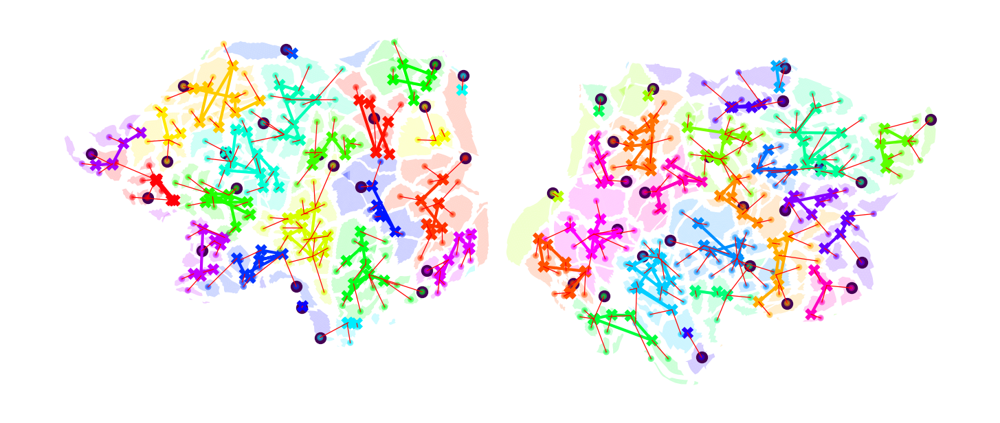

In [759]:
fig = plt.figure(dpi=300)

ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

cmap_name = 'gist_rainbow'
cmap = plt.get_cmap(cmap_name,max(clusts))

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
    patches = [Polygon(tri, edgecolor = None, 
                       facecolor=cmap(paint[clusts[segi]]), 
                       alpha=0.2) for tri in polyset[seg]]    
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])

    
for clust in np.unique(clusts):
    clusti = clusts==clust    
    if sum(clusti)>1:
        plt.plot(hh[clusti,0],hh[clusti,1], c=cmap(paint[clust]), linewidth=1)
    elif sum(clusti)>2:
        plt.plot(*geo.MultiPoint(hh[clusti,:]).convex_hull.exterior.xy, c=cmap(paint[clust]), linewidth=1)
    
    temp = avgG[clusti,:][:,clusti]
    temp = np.mean(temp,axis=0)
    temp = np.argmin(temp)
    val = np.arange(len(clusts))[clusti][temp]
    plt.scatter(gg[val,0],gg[val,1],c=k,marker='o',s=10)

gg = GG['gg']
hh = GG['hh']
plt.scatter(*hh.T,c=cmap(paint[clusts]), marker='x', s=10)
plt.scatter(*gg.T,c=cmap(paint[clusts]), marker='.', alpha=0.5, s=6)
plt.plot(np.array([gg.T[0,:],hh.T[0,:]]),np.array([gg.T[1,:],hh.T[1,:]]),linewidth=0.3, color='r')
plt.axis('scaled')
plt.axis('off')

plt.savefig('./figuresAugust/ReferenceMap_grain{}_'.format(grain) + '.png', transparent=True)    

plt.show()

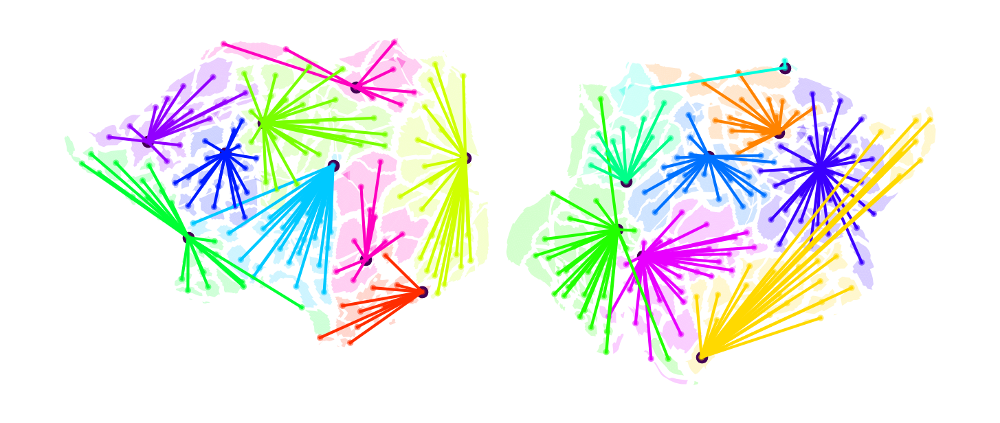

In [453]:
fig = plt.figure(dpi=300)

gg2 = GG['gg2']

ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

cmap_name = 'gist_rainbow'
cmap = plt.get_cmap(cmap_name,max(clusts))

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
    patches = [Polygon(tri, edgecolor = None, 
                       facecolor=cmap(paint[clusts[segi]]), 
                       alpha=0.2) for tri in polyset[seg]]    
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])

    
for clust in np.unique(clusts):
    clusti = clusts==clust    

    temp = avgG[clusti,:][:,clusti]
    temp = np.mean(temp,axis=0)
    temp = np.argmin(temp)
    val = np.arange(len(clusts))[clusti][temp]
    plt.scatter(gg2[val,0],gg2[val,1],c=k,marker='o',s=10)
    
    if sum(clusti)>2:
        for jj in np.arange(len(clusti))[clusti]:
            plt.plot([gg2[val,0],gg2[jj,0]],[gg2[val,1],gg2[jj,1]],
                     c=cmap(paint[clust]), linewidth=1)
    elif sum(clusti)>1:        
        plt.plot(gg2[clusti,0],gg2[clusti,1], c=cmap(paint[clust]), linewidth=1)
        
    temp = avgG[clusti,:][:,clusti]
    temp = np.mean(temp,axis=0)
    temp = np.argmin(temp)
    val = np.arange(len(clusts))[clusti][temp]
    plt.scatter(gg2[val,0],gg2[val,1],c=k,marker='o',s=10)

plt.scatter(*gg2.T,c=cmap(paint[clusts]), marker='.', alpha=0.5, s=6)
plt.axis('scaled')
plt.axis('off')

#plt.savefig('./figuresAugust/ReferenceMap_grain{}_'.format(grain) + '.png', transparent=True)    

plt.show()

In [402]:
sum(clusti)

15

In [398]:
clusti[1]

False

In [398]:
val

120

In [495]:
aset = setIn[1]
seti=1


with open('./fromMatlab_grain{}/'.format(grain) + aset + '.txt', 'r') as file:
    tt=file.readlines()

lifetimes = []
yy=tt[0].split(sep='),')
for y in yy:
    newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
    lifetimes.append( np.array([float(i) for i in newstr.split()]).reshape([-1,2]) )

generators = []
yy=tt[1].split(sep='],')
for y in yy:
    newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
    generators.append( np.array([int(i) for i in newstr.split()]).reshape([-1,2]) )                       


In [460]:
masks.keys()

dict_keys(['vertL', 'faceL', 'vertR', 'faceR', 'gordon', 'brainlocs', 'centroids'])

In [458]:
np.unique(masks['gordon'][~np.isnan(masks['gordon'])])

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118., 119., 120.,
       121., 122., 123., 124., 125., 126., 127., 128., 129., 130., 131.,
       132., 133., 134., 135., 136., 137., 138., 139., 140., 141., 142.,
       143., 144., 145., 146., 147., 148., 149., 15

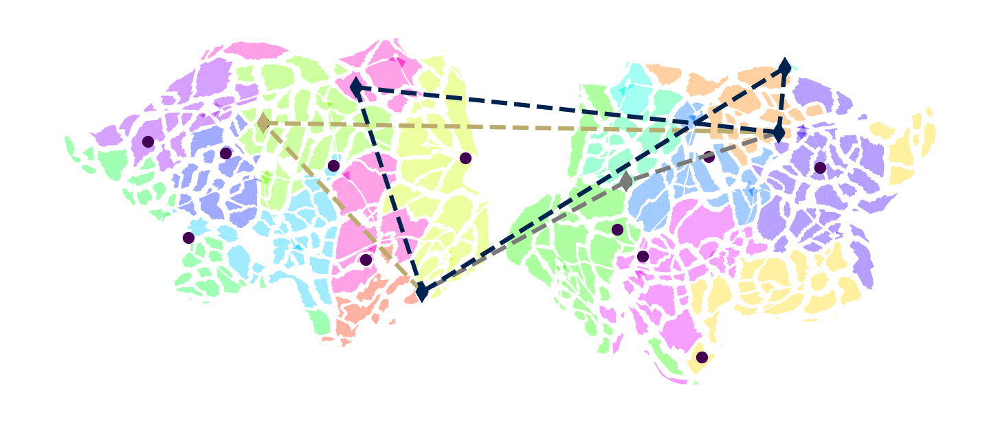

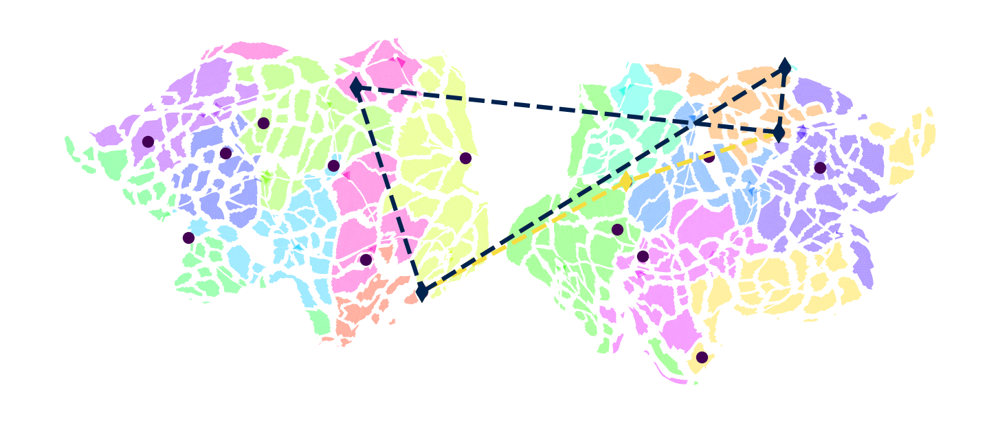

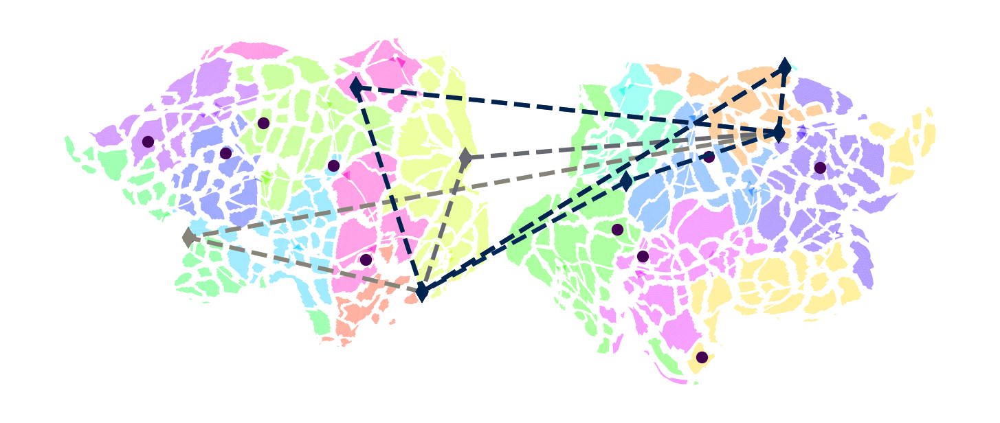

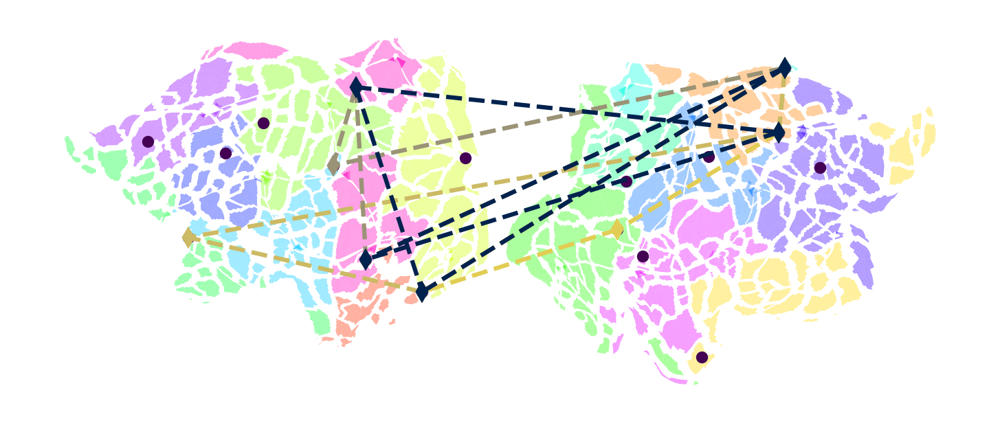

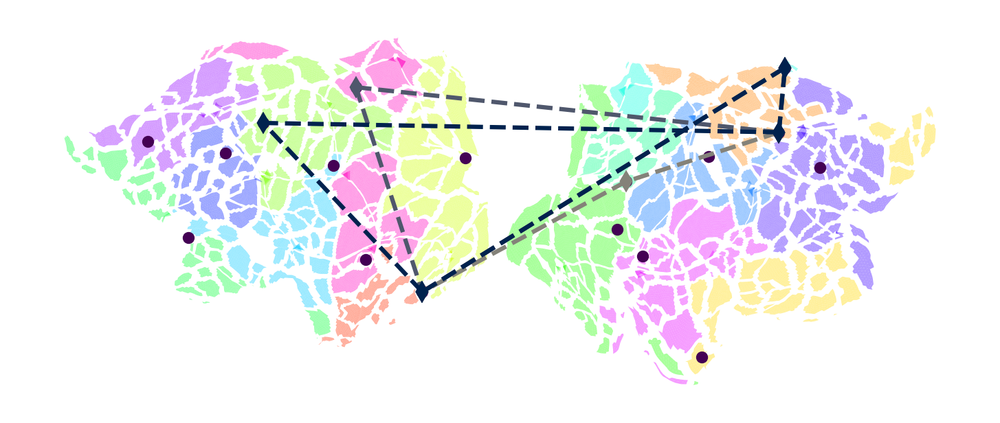

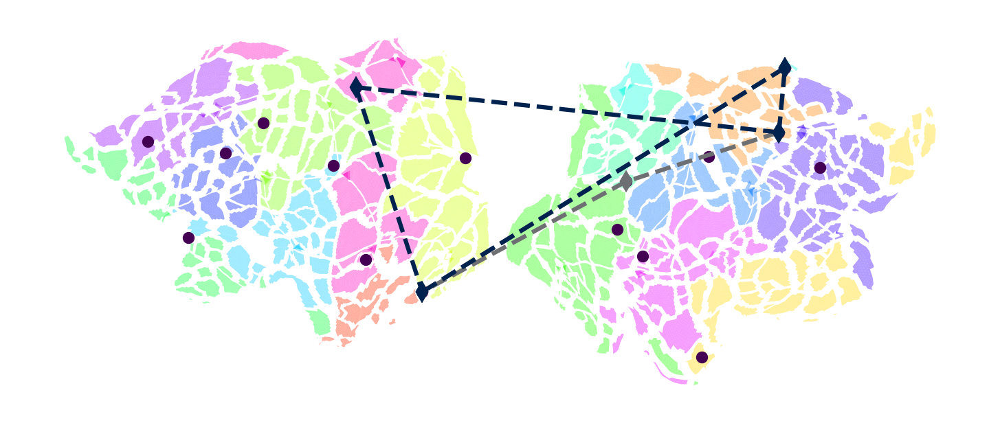

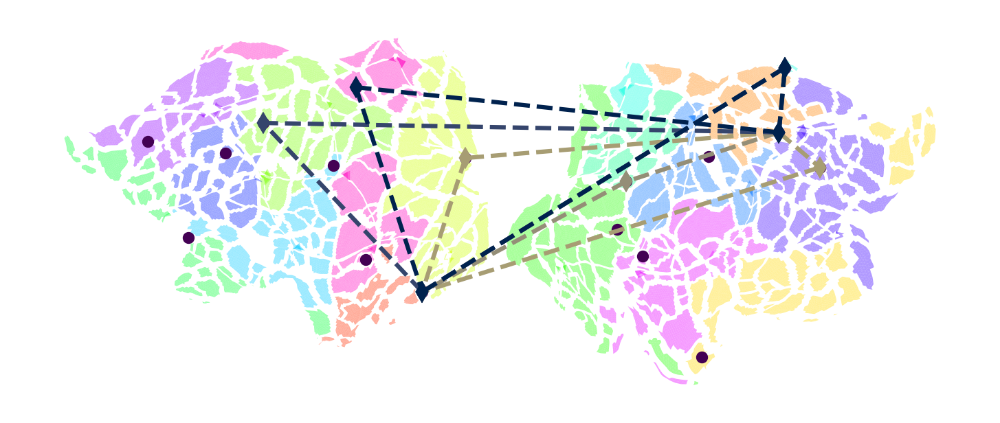

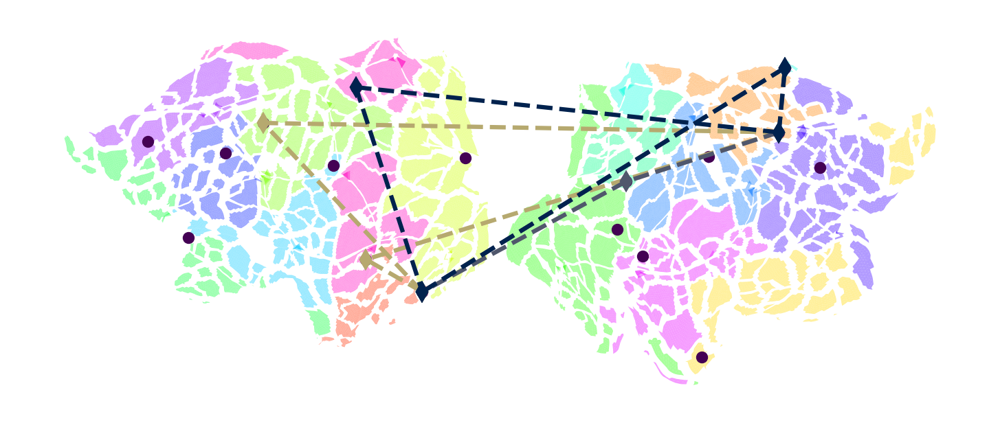

In [454]:
setIn = p_utils.getSecondList('./fromMatlab_grain{}/'.format(grain))

for seti, aset in enumerate(setIn):
    
    fig = plt.figure(seti,dpi=300)
    
    with open('./fromMatlab_grain{}/'.format(grain) + aset + '.txt', 'r') as file:
        tt=file.readlines()

    lifetimes = []
    yy=tt[0].split(sep='),')
    for y in yy:
        newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
        lifetimes.append( np.array([float(i) for i in newstr.split()]).reshape([-1,2]) )

    generators = []
    yy=tt[1].split(sep='],')
    for y in yy:
        newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
        generators.append( np.array([int(i) for i in newstr.split()]).reshape([-1,2]) )                       

    ax = plt.subplot(111)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)

    this = GG
    
    cmap_name = 'gist_rainbow'
    cmap = plt.get_cmap(cmap_name,max(clusts))

    #ax.set_title(aset)

    polyobs = {}

    missingVoxels = [133, 296, 299, 302, 304]

    facecolors = []
    for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
        patches = [Polygon(tri, edgecolor = None, 
                           facecolor=cmap(paint[clusts[segi]]), 
                           alpha=0.4) for tri in polyset[seg]]
        polyobs[seg] = PatchCollection(patches,match_original=True)
        ax.add_collection(polyobs[seg])
        facecolors.append(paint[clusts[segi]])

    targs = []
    targs_full = np.empty(clusts.shape, dtype='int')
    for clu in np.unique(clusts):
        those = clusts==clu
        temp = avgG[those,:][:,those]
        temp = np.mean(temp,axis=0)
        temp = np.argmin(temp)
        val = np.arange(len(clusts))[those][temp]
        targs.append(val)
        targs_full[those] = val
        
        plt.scatter(gg2[val,0],gg2[val,1],c=k,marker='o',s=10)

    xoffset = [-30,0]
    if len(generators[0]):
        lifetimes_d = np.diff(lifetimes)
        maxLife = np.max(lifetimes_d)
        argLife = np.argsort(np.concatenate(lifetimes_d).ravel())    
        cmap0 = plt.get_cmap('cividis_r', 256)
        for ci, ind in enumerate(argLife):
            cc = generators[ind]
            life = float(lifetimes_d[ind])
            for row,col in cc:
                color = cmap0(int((life/maxLife)*256))
                xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
                ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]

                plt.plot(xs,ys,linestyle='--',marker='d',color=color,
                         alpha=1+0*(life/(maxLife*1.1)),markersize=4)

    plt.axis('scaled')    
    plt.axis('off')
    plt.savefig('./figuresSeptember/grain{}_'.format(grain)+aset+'.png', transparent=True)    
    plt.show()
    

In [160]:
from gudhi import plot_persistence_density as dgmD

In [161]:
help(dgmD)

Help on function plot_persistence_density in module gudhi.persistence_graphical_tools:

plot_persistence_density(persistence=[], persistence_file='', nbins=300, bw_method=None, max_intervals=1000, dimension=None, cmap=None, legend=False, axes=None)
    This function plots the persistence density from persistence
    values list or from a :doc:`persistence file <fileformats>`. Be
    aware that this function does not distinguish the dimension, it is
    up to you to select the required one. This function also does not handle
    degenerate data set (scipy correlation matrix inversion can fail).
    
    :param persistence: Persistence intervals values list grouped by dimension.
    :type persistence: list of tuples(dimension, tuple(birth, death)).
    :param persistence_file: A :doc:`persistence file <fileformats>`
        style name (reset persistence if both are set).
    :type persistence_file: string
    :param nbins: Evaluate a gaussian kde on a regular grid of nbins x
        nbin

In [169]:
GG['DGMS'][328]['All_all_all']

[array([[0.        , 0.0865462 ],
        [0.        , 0.09305929],
        [0.        , 0.10242536],
        [0.        , 0.10465944],
        [0.        , 0.12529118],
        [0.        , 0.13465765],
        [0.        , 0.1395379 ],
        [0.        , 0.14054538],
        [0.        , 0.14638466],
        [0.        , 0.15202135],
        [0.        , 0.15387574],
        [0.        , 0.1566911 ],
        [0.        , 0.15684533],
        [0.        , 0.16058926],
        [0.        , 0.17094737],
        [0.        , 0.17456375],
        [0.        , 0.17737193],
        [0.        , 0.18357924],
        [0.        , 0.18606068],
        [0.        , 0.18796854],
        [0.        , 0.18862545],
        [0.        , 0.19076474],
        [0.        , 0.19145018],
        [0.        , 0.1933942 ],
        [0.        , 0.19362651],
        [0.        , 0.19381045],
        [0.        , 0.19384709],
        [0.        , 0.19613527],
        [0.        , 0.19935653],
        [0.   

In [204]:
help(ax.set_ylim)

Help on method set_ylim3d in module mpl_toolkits.mplot3d.axes3d:

set_ylim3d(bottom=None, top=None, emit=True, auto=False, *, ymin=None, ymax=None) method of matplotlib.axes._subplots.Axes3DSubplot instance
    Set 3D y limits.
    
    See :meth:`matplotlib.axes.Axes.set_ylim` for full documentation.



In [207]:
help(np.histogram2d)

Help on function histogram2d in module numpy:

histogram2d(x, y, bins=10, range=None, normed=None, weights=None, density=None)
    Compute the bi-dimensional histogram of two data samples.
    
    Parameters
    ----------
    x : array_like, shape (N,)
        An array containing the x coordinates of the points to be
        histogrammed.
    y : array_like, shape (N,)
        An array containing the y coordinates of the points to be
        histogrammed.
    bins : int or array_like or [int, int] or [array, array], optional
        The bin specification:
    
          * If int, the number of bins for the two dimensions (nx=ny=bins).
          * If array_like, the bin edges for the two dimensions
            (x_edges=y_edges=bins).
          * If [int, int], the number of bins in each dimension
            (nx, ny = bins).
          * If [array, array], the bin edges in each dimension
            (x_edges, y_edges = bins).
          * A combination [int, array] or [array, int], wher

In [212]:
xedges

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ])

In [216]:
help(ax.bar3d)

Help on method bar3d in module mpl_toolkits.mplot3d.axes3d:

bar3d(x, y, z, dx, dy, dz, color=None, zsort='average', shade=True, lightsource=None, *args, **kwargs) method of matplotlib.axes._subplots.Axes3DSubplot instance
    Generate a 3D barplot.
    
    This method creates three dimensional barplot where the width,
    depth, height, and color of the bars can all be uniquely set.
    
    Parameters
    ----------
    x, y, z : array-like
        The coordinates of the anchor point of the bars.
    
    dx, dy, dz : scalar or array-like
        The width, depth, and height of the bars, respectively.
    
    color : sequence of colors, optional
        The color of the bars can be specified globally or
        individually. This parameter can be:
    
        - A single color, to color all bars the same color.
        - An array of colors of length N bars, to color each bar
          independently.
        - An array of colors of length 6, to color the faces of the
          bars 

In [ ]:
ax.set_zlabel

In [301]:
help(plt.subplots_adjust)

Help on function subplots_adjust in module matplotlib.pyplot:

subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    Tune the subplot layout.
    
    The parameter meanings (and suggested defaults) are::
    
      left = 0.125  # the left side of the subplots of the figure
      right = 0.9   # the right side of the subplots of the figure
      bottom = 0.1  # the bottom of the subplots of the figure
      top = 0.9     # the top of the subplots of the figure
      wspace = 0.2  # the amount of width reserved for space between subplots,
                    # expressed as a fraction of the average axis width
      hspace = 0.2  # the amount of height reserved for space between subplots,
                    # expressed as a fraction of the average axis height
    
    The actual defaults are controlled by the rc file



In [305]:
ax.dist

10

In [ ]:
ax.set_yticklabels(ax.get_yticks)

In [336]:
dgm = GG['DGMS'][aspe]['All_all_all'][1]

In [335]:
aspe=328

In [338]:
np.max(dgm)

0.587647557258606

In [526]:
setIn

['All_all_all',
 'Math_correct_less',
 'Math_correct_more',
 'Memory_correct_less',
 'Memory_correct_more',
 'Rest_rest_rest',
 'Video_correct_less',
 'Video_correct_more']

In [773]:
thisSet

'Video_correct_more'

In [3]:
2

2

In [ ]:
setIn = p_utils.getSecondList('./fromMatlab_grain{}/'.format(grain))


['All_all_all', 328, 'y', 8.0, 0.3828125, 0.3671875, 0.336238294839859, 0.49631521105766296]
['All_all_all', 32, 'm', 5.0, 0.4765625, 0.4296875, 0.4741, 0.5720000000000001]
['All_all_all', 17, 'k', 1.0, 0.6171875, 0.5703125, 0.5687, 0.616]


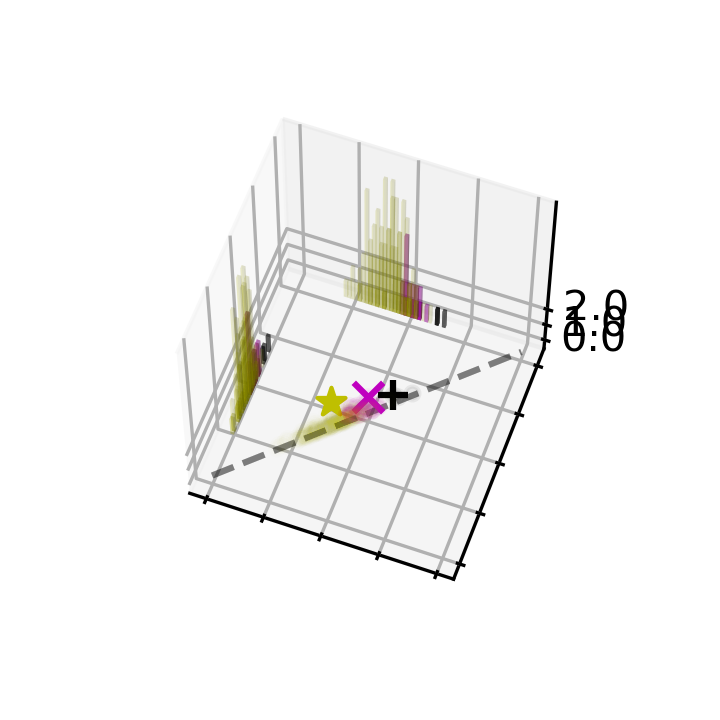

['Math_correct_less', 328, 'y', 13.0, 0.3984375, 0.3828125, 0.3275751769542694, 0.4591186046600342]
['Math_correct_less', 32, 'm', 3.0, 0.5078125, 0.4921875, 0.4631, 0.5335000000000001]
['Math_correct_less', 17, 'k', 1.0, 0.6640625, 0.6171875, 0.6149, 0.6666000000000001]


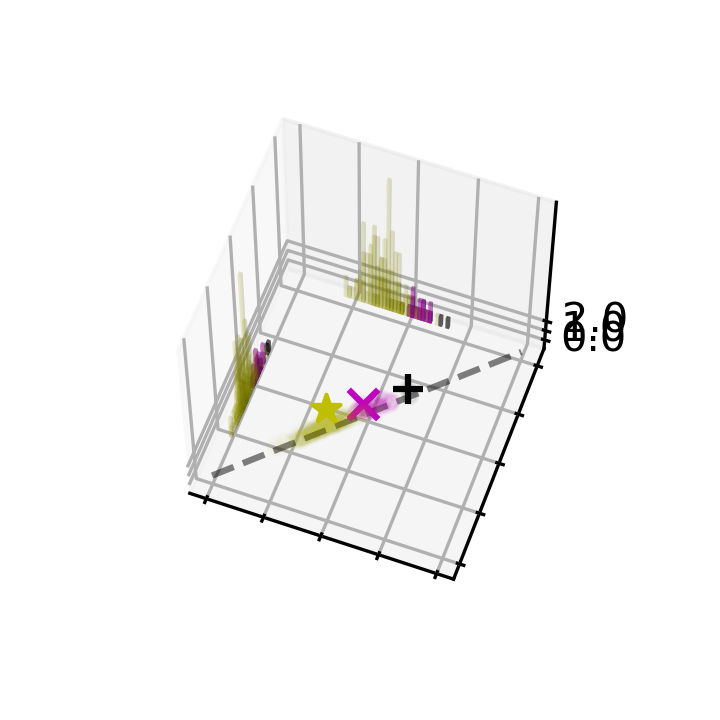

['Math_correct_more', 328, 'y', 10.0, 0.4140625, 0.4140625, 0.34259921312332153, 0.5011159181594849]
['Math_correct_more', 32, 'm', 3.0, 0.4765625, 0.4453125, 0.4268, 0.5236000000000001]
['Math_correct_more', 17, 'k', 1.0, 0.5859375, 0.5390625, 0.5478000000000001, 0.5863]


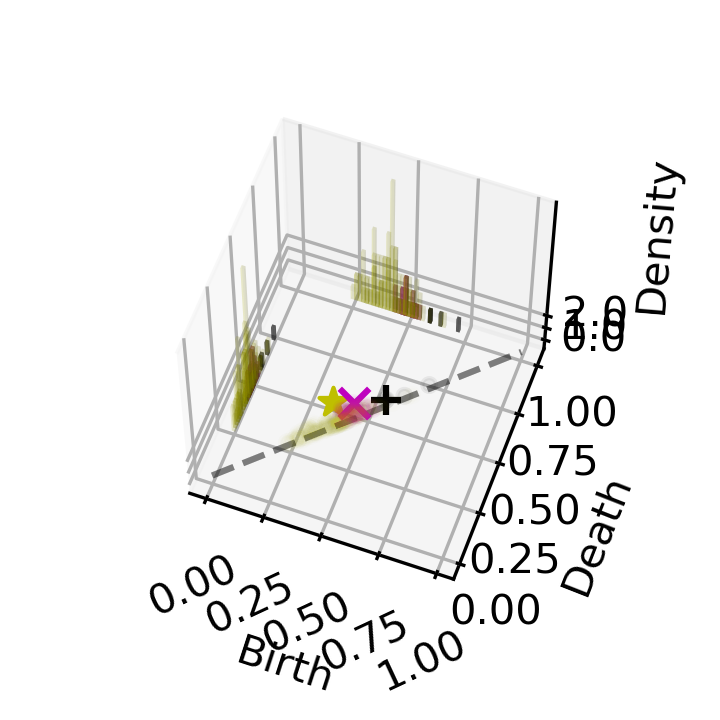

['Memory_correct_less', 328, 'y', 7.0, 0.3828125, 0.3671875, 0.3550434112548828, 0.48222094774246216]
['Memory_correct_less', 32, 'm', 4.0, 0.4765625, 0.4609375, 0.37620000000000003, 0.48510000000000003]
['Memory_correct_less', 17, 'k', 1.0, 0.5390625, 0.5078125, 0.5049, 0.5456000000000001]


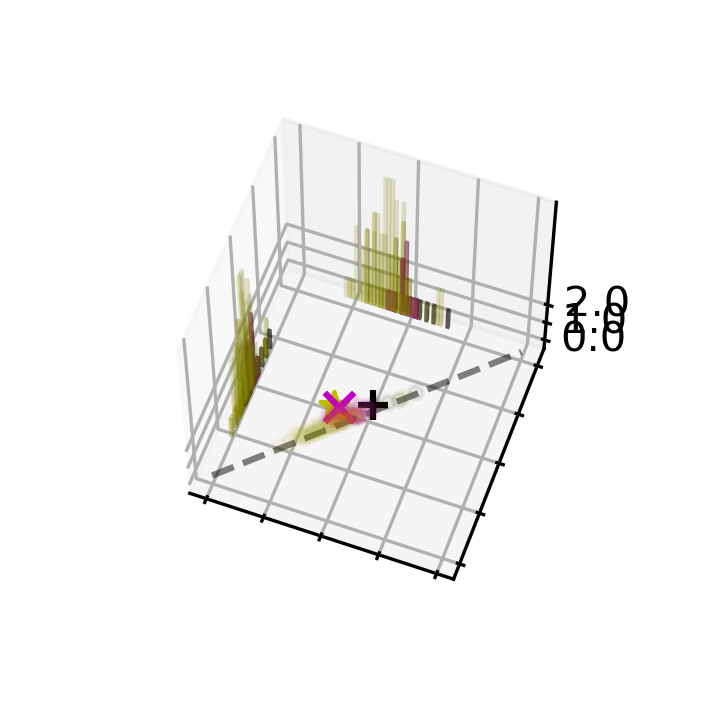

['Memory_correct_more', 328, 'y', 11.0, 0.3359375, 0.3203125, 0.34012362360954285, 0.47324466705322266]
['Memory_correct_more', 32, 'm', 3.0, 0.5234375, 0.4609375, 0.4697, 0.5445]
['Memory_correct_more', 17, 'k', 1.0, 0.6484375, 0.6328125, 0.6985, 0.7315]


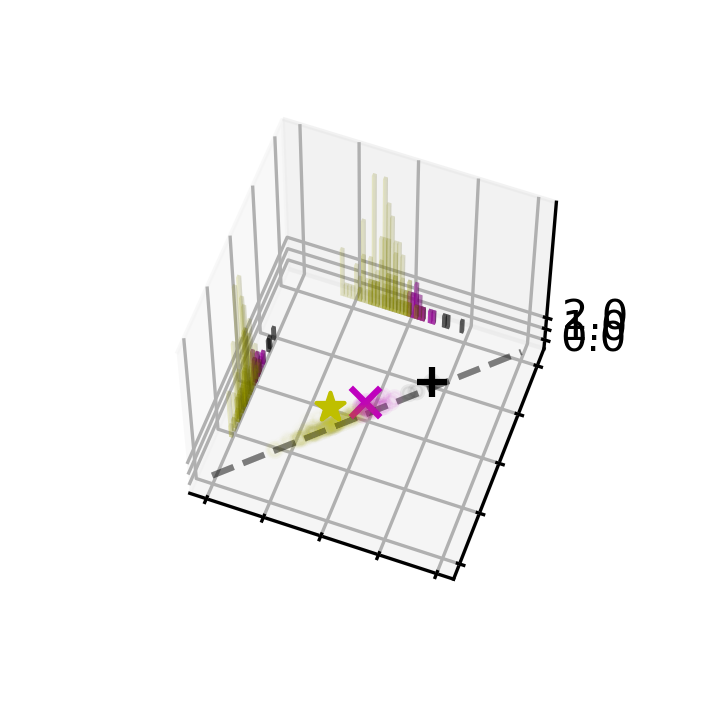

['Rest_rest_rest', 328, 'y', 8.0, 0.3828125, 0.3671875, 0.336238294839859, 0.49631521105766296]
['Rest_rest_rest', 32, 'm', 4.0, 0.4609375, 0.4453125, 0.41140000000000004, 0.4939]
['Rest_rest_rest', 17, 'k', 1.0, 0.6171875, 0.5859375, 0.5819000000000001, 0.6149]


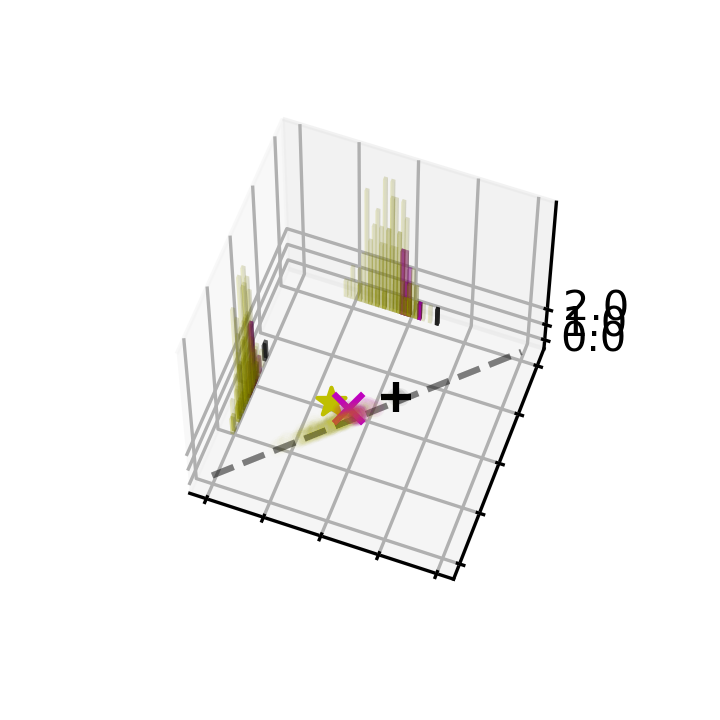

['Video_correct_less', 328, 'y', 9.0, 0.4453125, 0.4296875, 0.3522639870643616, 0.500971794128418]
['Video_correct_less', 32, 'm', 4.0, 0.4453125, 0.4140625, 0.4213, 0.5203]
['Video_correct_less', 17, 'k', 1.0, 0.5703125, 0.5234375, 0.5203, 0.5643]


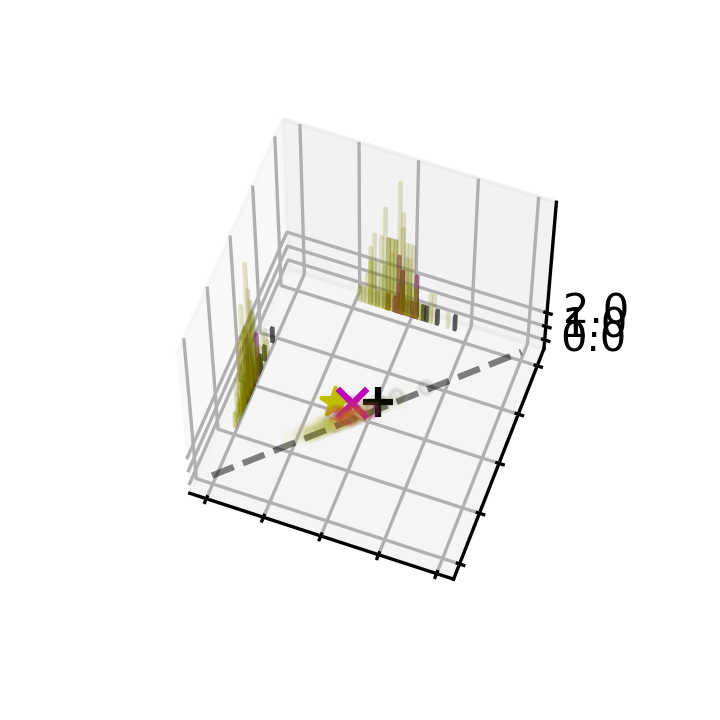

['Video_correct_more', 328, 'y', 9.0, 0.3984375, 0.3828125, 0.3638293445110321, 0.48741111159324646]
['Video_correct_more', 32, 'm', 5.0, 0.4609375, 0.4140625, 0.385, 0.48290000000000005]
['Video_correct_more', 17, 'k', 1.0, 0.6015625, 0.5234375, 0.5236000000000001, 0.5962000000000001]


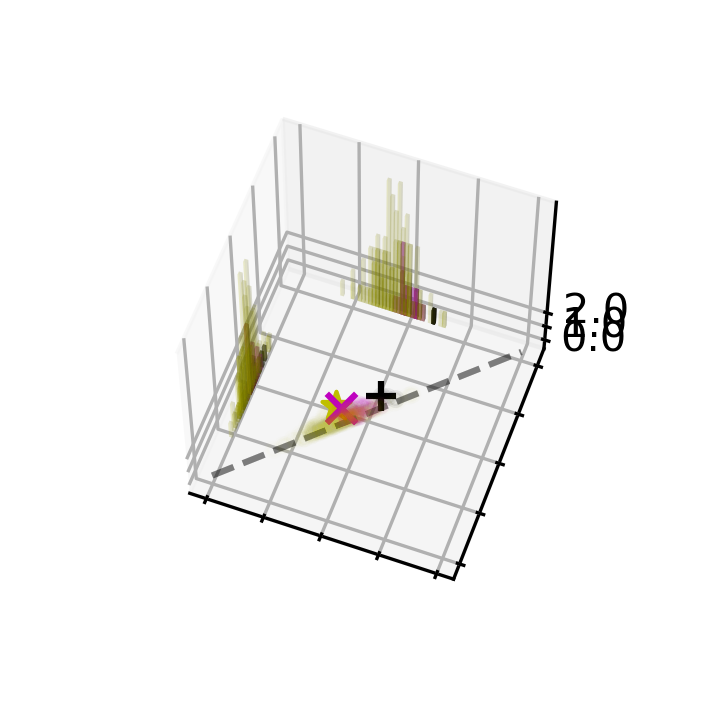

In [449]:
colors = ['y','m','k']
grains = [328,32,17]
cmaps = ['Grays','Blues','Reds']

for thisSet in setIn:

    fig = plt.figure(figsize=[2.5,2.5],dpi=300)          #create a canvas, tell matplotlib it's 3d
    ax = fig.add_subplot(111, projection='3d')
    ax.set_ylim(bottom=0,top=1)
    ax.set_xlim(left=0,right=1)
    ax.set_zlim(bottom=0)

    for aspi, aspe in enumerate(grains):
        
        if aspe==328:
            dgm = GG['DGMS'][aspe][thisSet][1]
        else:
            with open('./fromMatlab_grain{}/'.format(aspe) + thisSet + '.txt', 'r') as file:
                tt=file.readlines()
            lifetimes = []
            yy=tt[0].split(sep='),')
            for y in yy:
                newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
                lifetimes.append( np.array([float(i) for i in newstr.split()]).reshape([-1,2]) )
            dgm = np.concatenate(lifetimes)
            
        if not len(dgm):
            continue
        dgm[dgm>1] = 1
        amxdg = np.argmax(np.diff(dgm,axis=1))
        x,y = dgm[:,0], dgm[:,1]

        #make histogram stuff - set bins - I choose 20x20 because I have a lot of data
        hist, xedges, yedges = np.histogram2d(x, y, range=[[0,1],[0,1]], bins=(64,64))
        xpos, ypos = np.meshgrid(xedges[:-1]+xedges[1:], yedges[:-1]+yedges[1:])

        xpos = xpos.flatten()/2.
        ypos = ypos.flatten()/2.
        zpos = np.zeros_like (xpos)
        
        dx = xedges [1] - xedges [0]
        dy = yedges [1] - yedges [0]
        dz = hist.flatten()

        dza = np.argmax(dz)
        print([thisSet, aspe, colors[aspi], dz[dza],xpos[dza],ypos[dza],x[amxdg],y[amxdg]])

        val = dz!=0        

        plt.plot([0,1],[0,1],'k--',alpha=0.2)
        
        
        if aspi==0:
            alpha = 0.01
            marker = '*'
        elif aspi==1:
            alpha = 0.05
            marker = 'x'
        elif aspi==2:
            alpha = 0.06
            marker = '+'
        ax.scatter(x,y,c=colors[aspi],alpha=alpha,s=11)        
        ax.scatter(x[amxdg],y[amxdg],c=colors[aspi],s=50,marker=marker)
        
        
        if aspi==0:
            alpha = 0.1
        elif aspi==1:
            alpha = 0.3
        elif aspi==2:
            alpha = 0.4
#        ax.bar3d(xpos[val], ypos[val], zpos[val], dx, dy, 1, color=colors[aspi], 
#                 zsort='average', alpha=alpha)
        ax.bar3d(xpos[val], ypos[val]*0+1, zpos[val], dx, dy, dz[val], color=colors[aspi], 
                 zsort='average', alpha=alpha)
        ax.bar3d(xpos[val]*0, ypos[val], zpos[val], dx, dy, dz[val], color=colors[aspi], 
                 zsort='average', alpha=alpha)

    #plt.title("X vs. Y Amplitudes for ____ Data")
    if thisSet == 'Math_correct_more':        
        plt.xlabel("\nBirth")
        plt.ylabel("\nDeath")
        ax.set_zlabel("Density")        
        plt.xticks(rotation=25)
    else:
        ax.set_xticklabels([])
        ax.set_yticklabels([])        
    ax.view_init(60,290)
    zmax = np.max(dz)+2
    ax.set_zlim(top=zmax)
    ticks = ax.get_zticks()
    ax.set_zticks(np.arange(0,np.max(dz)+2))
    ax.set_zticklabels([gg for gg in np.arange(0,np.max(dz)+2) if gg in np.arange(0,np.max(dz)+2)])
    plt.tight_layout()
    plt.autoscale()
    ax.dist = 13
    #plt.savefig('./figuresAugust/PersistenceD_less_'+thisSet+'.png',transparent=True)
    plt.show()

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 <a list of 6 Text major ticklabel objects>)

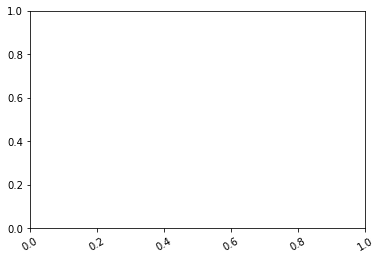

In [783]:
plt.xticks(rotation=30)

In [566]:
i=9
'./figuresAugust/Methods_squareMat_{:02d}.png'.format(i)

'./figuresAugust/Methods_squareMat_09.png'

In [567]:
np.random.randint(700)

442

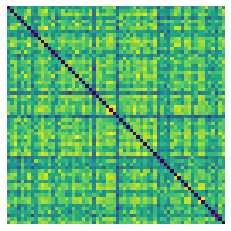

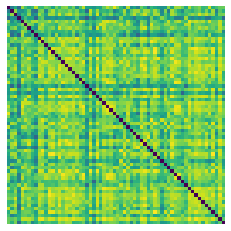

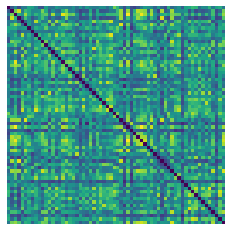

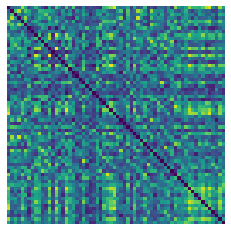

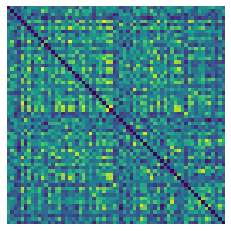

...

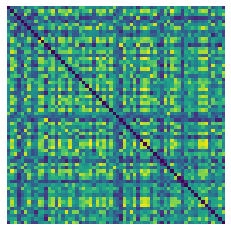

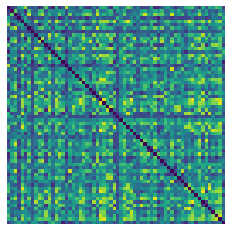

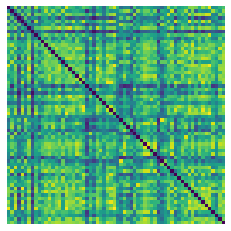

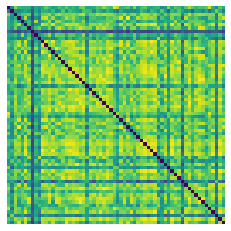

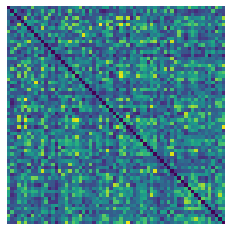

In [604]:
for i in range(18):
    fig = plt.figure()
    plt.imshow(squareform(WCT[i][:,0,np.random.randint(700)]))
    plt.axis('off')
    plt.savefig('./figuresAugust/Methods_squareMat_{:02d}.png'.format(i),dpi=300, transparent=True)
    plt.show()

In [540]:
import networkx as nx

In [557]:
G = nx.gaussian_random_partition_graph(20, 10, 10, 0.25, 0.1)

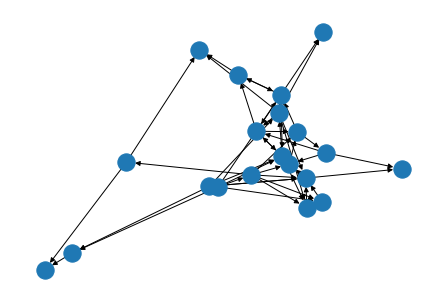

In [558]:
nx.draw(G)

In [573]:
h1.shape

(328, 13986)

-3.969599565

In [579]:
np.max(np.array(list(set(polyset.keys()) - set(missingVoxels))))

333

In [583]:
color

152

In [585]:
np.histogram(h1[:,200])

(array([ 4, 19, 39, 55, 70, 74, 39, 18,  7,  3]),
 array([-0.89885457, -0.73191178, -0.56496899, -0.39802619, -0.2310834 ,
        -0.06414061,  0.10280218,  0.26974498,  0.43668777,  0.60363056,
         0.77057336]))

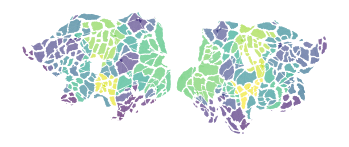

In [603]:
ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

rngCmap = 333
cmap = plt.get_cmap('viridis',rngCmap)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

for segi, seg in enumerate(list(set(polyset.keys()) - set(missingVoxels))):
    color = int((h1[segi,200]+0.9)/0.8*256)
    color = seg
    patches = [Polygon(tri, edgecolor = None, facecolor=cmap(color), alpha=1) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])

plt.axis('off')
plt.axis('scaled')
plt.savefig('./figuresAugust/Methods_Brain.png',dpi=300, transparent=True)
plt.show()

In [606]:
np.min(h1[:,80:86]), np.max(h1[:,80:86])

(-1.116167472, 2.492759705)

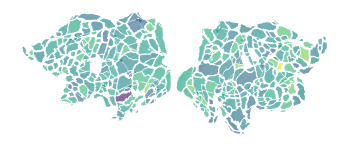

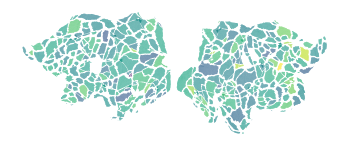

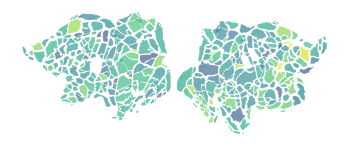

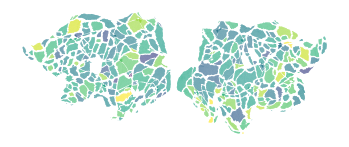

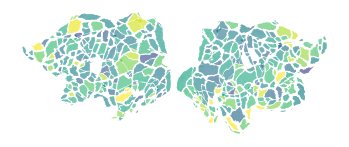

In [607]:
minn, maxx = np.min(h1[:,80:86]), np.max(h1[:,80:86])

for i in range(80,85):
    ax = plt.subplot(111)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)

    #minn, maxx = np.min(h1[:,i]), np.max(h1[:,i])
    for segi, seg in enumerate(list(set(polyset.keys()) - set(missingVoxels))):
        color = int((h1[segi,i]-minn)/maxx*rngCmap)
        patches = [Polygon(tri, edgecolor = None, facecolor=cmap(color), alpha=1) for tri in polyset[seg]]
        polyobs[seg] = PatchCollection(patches,match_original=True)
        ax.add_collection(polyobs[seg])

    plt.axis('off')
    plt.axis('scaled')
    plt.savefig('./figuresAugust/Methods_Brain_{}.png'.format(i),dpi=300, transparent=True)
    plt.show()

In [590]:
minn, maxx = np.min(h1[segi,i]), np.max(h1[segi,i])

In [592]:
maxx

-0.01118079147

In [795]:
h0['SBJ01_Gordon333.npy'].shape

(328, 1017)

In [ ]:
WCTPow = []

pool.close()
pool.join()
pool.terminate

pool = Pool(10)

for qdata in adata:

    idata = qdata
    
    sj, frequencies, coi, mother, s0, dj, J, s1, TR = p_utils.getCWT_auxInfoPlus(idata[0,:])

    W = pool.map(p_utils.getCWT_coeff,tqdm(idata))        

    W = np.array(W)
    print(W.shape)
    #W = W[:10,:]
    _, m, n = nP, nW, nT = W.shape 

    k = 2 * np.pi * fft.fftfreq(fft_kwargs(W[0, 0, :])['n'])
    k2 = k ** 2            
    scales1 = np.ones([1, n]) * sj[:, None]
    snorm = sj / TR
    F = np.exp(-0.5 * (snorm[:, np.newaxis] ** 2) * k2)  # Outer product

    wsize = mother.deltaj0 / dj * 2
    win = rect(np.int(np.round(wsize)), normalize=True)                                                

    print('Smooth wavelets')
    mapFun = partial(p_utils.cwt2smooth_local, n=n, F=F, win=win)
    S = pool.map(mapFun,tqdm( list(np.abs(W[ic,:,:].squeeze())**2/scales1 for ic in range(nP)) ))                
    print('One smoothed values histogram')
    print(np.histogram(S[0].ravel()))

    samps = np.arange(nP)

    mapCross = partial(p_utils.cross)
    W12 = list(pool.imap(mapCross,tqdm(list([W[sma,:,:].squeeze(),W[smb,:,:].squeeze()] for sma, smb in itertools.combinations(samps,2)), desc='Cross wavelets')))

    temp = [np.mean(np.abs(tt),axis=1) for tt in W12]    
    np.mean(temp,axis=0)
    print(temp)

    WCTPow.append(temp)

pool.close()
pool.join()
pool.terminate


In [ ]:

pool.close()
#pool.join()
pool.terminate


In [825]:
print(2)

In [ ]:
len(WCTPow)

### Aux Commands

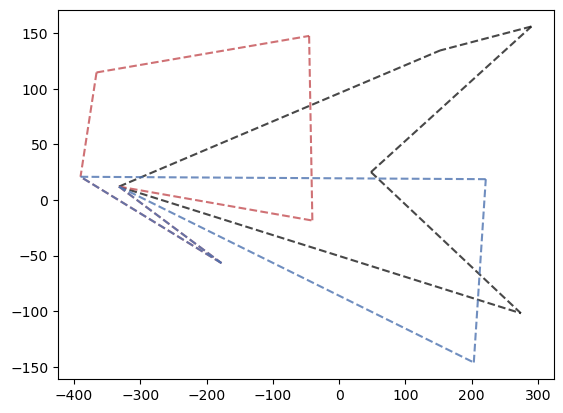

In [464]:

targs = []
targs_full = np.empty(clusts.shape, dtype='int')
for clu in np.unique(clusts):
    those = clusts==clu
    temp = avgG[those,:][:,those]
    temp = np.mean(temp,axis=0)
    temp = np.argmax(temp)
    val = np.arange(len(clusts))[those][temp]
    targs.append(val)
    targs_full[those] = val
        
colors = ['k','r','b','g','m','y','w']        
markers = ['dashed','dashed','dashed','dashed','dashed','dashed','dashed']
xoffset = [-30,0]
for ci, cc in enumerate(cycles):
    labelSet = set()
    for row,col in cc:
        if row not in labelSet:
            labelSet.add(row)
            #plt.text(masks['centroids'][:,0][targs[row]]+xoffset[ci],
            #         masks['centroids'][:,1][targs[row]]+5, len(labelSet), color=colors[ci]) 
        if col not in labelSet:
            labelSet.add(col)
            #plt.text(masks['centroids'][:,0][targs[col]]+xoffset[ci], 
            #         masks['centroids'][:,1][targs[col]]+5, len(labelSet), color=colors[ci]) 
        xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
        ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
        plt.plot(xs,ys,linestyle=markers[ci],color=colors[ci],alpha=0.8)

In [454]:
targs[row]

23

In [432]:
tt[0]

'[[0.3928571428571429, 0.47142857142857153), [0.47142857142857153, 0.55), [0.47142857142857153, 0.55)]\n'

In [425]:
tt[1]

'[[0,32] + -[0,55] + [28,55] + [16,28] + [16,32], [4,5] + [0,57] + [4,12] + [5,57] + [2,12] + [0,2], [0,2] + [2,12] + [7,61] + [0,7] + [12,61]]\n'

In [433]:
lifetimes = []
yy=tt[0].split(sep='),')
for y in yy:
    newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
    lifetimes.append( [float(i) for i in newstr.split()] )

In [430]:
generators = []
yy=tt[1].split(sep='],')
for y in yy:
    newstr = ''.join((ch if ch in '0123456789.' else ' ') for ch in y)
    generators.append( [int(i) for i in newstr.split()] )

In [431]:
generators

[[0, 32, 0, 55, 28, 55, 16, 28, 16, 32],
 [4, 5, 0, 57, 4, 12, 5, 57, 2, 12, 0, 2],
 [0, 2, 2, 12, 7, 61, 0, 7, 12, 61]]

In [434]:
lifetimes

[[0.3928571428571429, 0.47142857142857153],
 [0.47142857142857153, 0.55],
 [0.47142857142857153, 0.55]]

In [337]:
coarsegraph.shape

(64, 64)

In [366]:
for i,c in enumerate(m):
    print(f[i],end=': ')
    print(" + ".join(["%d * %s" % (x.element, f[x.index]) for x in c]))

<0> 0: 
<1> 0: 
<2> 0: 
<3> 0: 
<4> 0: 
<5> 0: 
<6> 0: 
<7> 0: 
<8> 0: 
<9> 0: 
<10> 0: 
<11> 0: 
<12> 0: 
<13> 0: 
<14> 0: 
<15> 0: 
<16> 0: 
<17> 0: 
<18> 0: 
<19> 0: 
<20> 0: 
<21> 0: 
<22> 0: 
<23> 0: 
<24> 0: 
<25> 0: 
<26> 0: 
<27> 0: 
<28> 0: 
<29> 0: 
<30> 0: 
<31> 0: 
<32> 0: 
<33> 0: 
<34> 0: 
<35> 0: 
<36> 0: 
<37> 0: 
<38> 0: 
<39> 0: 
<40> 0: 
<41> 0: 
<42> 0: 
<43> 0: 
<44> 0: 
<45> 0: 
<46> 0: 
<47> 0: 
<48> 0: 
<49> 0: 
<50> 0: 
<51> 0: 
<52> 0: 
<53> 0: 
<54> 0: 
<55> 0: 
<56> 0: 
<57> 0: 
<58> 0: 
<59> 0: 
<60> 0: 
<61> 0: 
<62> 0: 
<63> 0: 
<49,52> 0.334956: 1 * <49> 0 + 1 * <52> 0
<7,52> 0.40358: 1 * <7> 0 + 1 * <49> 0
<7,49> 0.412601: 
<7,49,52> 0.412601: 1 * <49,52> 0.334956 + 1 * <7,52> 0.40358 + 1 * <7,49> 0.412601
<16,32> 0.414944: 1 * <16> 0 + 1 * <32> 0
<43,55> 0.417259: 1 * <43> 0 + 1 * <55> 0
<7,44> 0.419269: 1 * <7> 0 + 1 * <44> 0
<52,56> 0.430021: 1 * <52> 0 + 1 * <56> 0
<49,56> 0.433567: 
<49,52,56> 0.433567: 1 * <49,52> 0.334956 + 1 * <52,56> 0.430021 +

<17,31,38> 0.521111: 1 * <17,31> 0.515313 + 1 * <17,38> 0.515371 + 1 * <31,38> 0.521111
<41,55> 0.521452: 
<7,41,55> 0.521452: 1 * <7,41> 0.471688 + 1 * <7,55> 0.473417 + 1 * <41,55> 0.521452
<40,41,55> 0.521452: 
<41,49,55> 0.521452: 
<41,52,55> 0.521452: 
<28,32> 0.521667: 
<16,28,32> 0.521667: 1 * <16,32> 0.414944 + 1 * <16,28> 0.460966 + 1 * <28,32> 0.521667
<7,61> 0.522086: 
<12,47> 0.522191: 1 * <12> 0 + 1 * <47> 0
<10,45> 0.522297: 1 * <10> 0 + 1 * <11> 0
<24,41> 0.522578: 
<7,24,41> 0.522578: 1 * <7,41> 0.471688 + 1 * <7,24> 0.502195 + 1 * <24,41> 0.522578
<24,41,49> 0.522578: 
<24,41,52> 0.522578: 
<24,41,55> 0.522578: 
<28,30> 0.522931: 
<16,28,30> 0.522931: 1 * <16,28> 0.460966 + 1 * <16,30> 0.517939 + 1 * <28,30> 0.522931
<40,56> 0.523227: 
<0,40,56> 0.523227: 1 * <0,40> 0.516614 + 1 * <0,56> 0.517368 + 1 * <40,56> 0.523227
<7,40,56> 0.523227: 
<40,49,56> 0.523227: 
<40,52,56> 0.523227: 
<40,55,56> 0.523227: 
<43,52> 0.523858: 
<0,43,52> 0.523858: 1 * <0,52> 0.501158 + 1 * 

<0,28,44> 0.539693: 1 * <0,28> 0.533988 + 1 * <0,44> 0.534129 + 1 * <28,44> 0.539693
<28,32,44> 0.539693: 
<28,36,44> 0.539693: 
<28,44,55> 0.539693: 
<3,16> 0.539704: 
<3,16,32> 0.539704: 1 * <16,32> 0.414944 + 1 * <3,32> 0.521102 + 1 * <3,16> 0.539704
<40,43> 0.539891: 
<0,40,43> 0.539891: 1 * <0,43> 0.510061 + 1 * <0,40> 0.516614 + 1 * <40,43> 0.539891
<7,40,43> 0.539891: 
<40,41,43> 0.539891: 
<40,43,49> 0.539891: 
<40,43,52> 0.539891: 
<40,43,55> 0.539891: 
<1,17> 0.540077: 1 * <0> 0 + 1 * <1> 0
<27,41> 0.5403: 
<7,27,41> 0.5403: 1 * <7,41> 0.471688 + 1 * <7,27> 0.503336 + 1 * <27,41> 0.5403
<27,41,49> 0.5403: 
<27,41,52> 0.5403: 
<44,53> 0.540692: 
<7,44,53> 0.540692: 1 * <7,44> 0.419269 + 1 * <7,53> 0.527285 + 1 * <44,53> 0.540692
<32,44,53> 0.540692: 
<44,46,53> 0.540692: 
<44,49,53> 0.540692: 
<44,52,53> 0.540692: 
<11,53> 0.540843: 
<7,28> 0.54111: 
<0,7,28> 0.54111: 1 * <0,7> 0.48545 + 1 * <0,28> 0.533988 + 1 * <7,28> 0.54111
<7,28,32> 0.54111: 
<7,28,36> 0.54111: 
<7,28,43>

<0,27,55> 0.549431: 1 * <0,55> 0.459666 + 1 * <0,27> 0.547854 + 1 * <27,55> 0.549431
<7,27,55> 0.549431: 
<27,40,55> 0.549431: 
<27,41,55> 0.549431: 
<27,49,55> 0.549431: 
<27,52,55> 0.549431: 
<28,39> 0.549511: 
<7,28,39> 0.549511: 1 * <7,39> 0.536306 + 1 * <7,28> 0.54111 + 1 * <28,39> 0.549511
<28,32,39> 0.549511: 
<28,39,49> 0.549511: 
<28,39,55> 0.549511: 
<24,44> 0.549593: 
<0,24,44> 0.549593: 1 * <0,44> 0.534129 + 1 * <0,24> 0.546321 + 1 * <24,44> 0.549593
<7,24,44> 0.549593: 
<24,40,44> 0.549593: 
<24,44,49> 0.549593: 
<24,44,52> 0.549593: 
<24,44,53> 0.549593: 
<24,44,55> 0.549593: 
<24,44,56> 0.549593: 
<2,29> 0.549684: 
<8,28> 0.550083: 
<0,8,28> 0.550083: 1 * <0,8> 0.519083 + 1 * <0,28> 0.533988 + 1 * <8,28> 0.550083
<7,8,28> 0.550083: 
<8,28,43> 0.550083: 
<8,28,49> 0.550083: 
<8,28,55> 0.550083: 
<12,60> 0.5502: 
<12,49,60> 0.5502: 1 * <49,60> 0.54868 + 1 * <12,49> 0.548791 + 1 * <12,60> 0.5502
<0,48> 0.550222: 
<0,7,48> 0.550222: 1 * <0,7> 0.48545 + 1 * <7,48> 0.507339 + 

<7,37,56> 0.558134: 1 * <7,56> 0.472932 + 1 * <7,37> 0.508919 + 1 * <37,56> 0.558134
<32,37,56> 0.558134: 
<37,40,56> 0.558134: 
<37,41,56> 0.558134: 
<37,49,56> 0.558134: 
<37,52,56> 0.558134: 
<37,55,56> 0.558134: 
<30,31> 0.558168: 
<30,31,63> 0.558168: 1 * <31,63> 0.500279 + 1 * <30,63> 0.518135 + 1 * <30,31> 0.558168
<2,27> 0.558219: 
<0,2,27> 0.558219: 1 * <0,2> 0.520354 + 1 * <0,27> 0.547854 + 1 * <2,27> 0.558219
<2,7,27> 0.558219: 
<2,27,32> 0.558219: 
<2,27,40> 0.558219: 
<2,27,41> 0.558219: 
<2,27,49> 0.558219: 
<2,27,52> 0.558219: 
<2,27,55> 0.558219: 
<24,37> 0.55825: 
<7,24,37> 0.55825: 1 * <7,24> 0.502195 + 1 * <7,37> 0.508919 + 1 * <24,37> 0.55825
<24,37,40> 0.55825: 
<24,37,41> 0.55825: 
<24,37,49> 0.55825: 
<24,37,52> 0.55825: 
<24,37,55> 0.55825: 
<24,37,56> 0.55825: 
<37,46> 0.558266: 
<7,37,46> 0.558266: 1 * <7,46> 0.497425 + 1 * <7,37> 0.508919 + 1 * <37,46> 0.558266
<32,37,46> 0.558266: 
<37,46,49> 0.558266: 
<37,46,52> 0.558266: 
<37,46,56> 0.558266: 
<32,60> 0.5

<32,40,54> 0.564286: 
<40,41,54> 0.564286: 
<40,43,54> 0.564286: 
<40,49,54> 0.564286: 
<40,52,54> 0.564286: 
<40,54,55> 0.564286: 
<40,54,57> 0.564286: 
<14,51> 0.564401: 
<6,56> 0.564457: 
<0,6,56> 0.564457: 1 * <0,56> 0.517368 + 1 * <0,6> 0.552031 + 1 * <6,56> 0.564457
<3,6,56> 0.564457: 
<6,7,56> 0.564457: 
<6,32,56> 0.564457: 
<6,41,56> 0.564457: 
<6,43,56> 0.564457: 
<6,44,56> 0.564457: 
<6,46,56> 0.564457: 
<6,49,56> 0.564457: 
<6,52,56> 0.564457: 
<6,53,56> 0.564457: 
<6,55,56> 0.564457: 
<24,46> 0.564791: 
<0,24,46> 0.564791: 1 * <0,24> 0.546321 + 1 * <0,46> 0.559226 + 1 * <24,46> 0.564791
<7,24,46> 0.564791: 
<24,32,46> 0.564791: 
<24,37,46> 0.564791: 
<24,44,46> 0.564791: 
<24,46,48> 0.564791: 
<24,46,49> 0.564791: 
<24,46,52> 0.564791: 
<24,46,53> 0.564791: 
<24,46,56> 0.564791: 
<36,56> 0.564792: 
<0,36,56> 0.564792: 1 * <0,56> 0.517368 + 1 * <0,36> 0.552678 + 1 * <36,56> 0.564792
<3,36,56> 0.564792: 
<6,36,56> 0.564792: 
<7,36,56> 0.564792: 
<28,36,56> 0.564792: 
<32,36,5

<39,50,54> 0.56855: 
<39,52,54> 0.56855: 
<39,54,55> 0.56855: 
<2,17> 0.568635: 
<0,2,17> 0.568635: 1 * <0,2> 0.520354 + 1 * <0,17> 0.550631 + 1 * <2,17> 0.568635
<2,7,17> 0.568635: 
<2,8,17> 0.568635: 
<2,17,22> 0.568635: 
<2,17,29> 0.568635: 
<2,17,32> 0.568635: 
<2,17,33> 0.568635: 
<2,17,35> 0.568635: 
<2,17,40> 0.568635: 
<2,17,41> 0.568635: 
<6,24> 0.568671: 
<0,6,24> 0.568671: 1 * <0,24> 0.546321 + 1 * <0,6> 0.552031 + 1 * <6,24> 0.568671
<6,7,24> 0.568671: 
<6,9,24> 0.568671: 
<6,24,27> 0.568671: 
<6,24,32> 0.568671: 
<6,24,36> 0.568671: 
<6,24,41> 0.568671: 
<6,24,43> 0.568671: 
<6,24,44> 0.568671: 
<6,24,46> 0.568671: 
<6,24,49> 0.568671: 
<6,24,52> 0.568671: 
<6,24,53> 0.568671: 
<6,24,54> 0.568671: 
<6,24,55> 0.568671: 
<6,24,56> 0.568671: 
<6,48> 0.568752: 
<0,6,48> 0.568752: 1 * <0,48> 0.550222 + 1 * <0,6> 0.552031 + 1 * <6,48> 0.568752
<3,6,48> 0.568752: 
<6,7,48> 0.568752: 
<6,24,48> 0.568752: 
<6,32,48> 0.568752: 
<6,36,48> 0.568752: 
<6,41,48> 0.568752: 
<6,44,48> 0.5

<43,55,61> 0.572485: 
<43,57,61> 0.572485: 
<6,28> 0.572511: 
<0,6,28> 0.572511: 1 * <0,28> 0.533988 + 1 * <0,6> 0.552031 + 1 * <6,28> 0.572511
<3,6,28> 0.572511: 
<6,7,28> 0.572511: 
<6,16,28> 0.572511: 
<6,24,28> 0.572511: 
<6,28,32> 0.572511: 
<6,28,36> 0.572511: 
<6,28,41> 0.572511: 
<6,28,43> 0.572511: 
<6,28,44> 0.572511: 
<6,28,49> 0.572511: 
<6,28,50> 0.572511: 
<6,28,52> 0.572511: 
<6,28,54> 0.572511: 
<6,28,55> 0.572511: 
<6,28,56> 0.572511: 
<35,43> 0.572521: 
<0,35,43> 0.572521: 1 * <0,43> 0.510061 + 1 * <0,35> 0.549263 + 1 * <35,43> 0.572521
<2,35,43> 0.572521: 
<8,35,43> 0.572521: 
<33,35,43> 0.572521: 
<35,43,49> 0.572521: 
<35,43,55> 0.572521: 
<30,32> 0.572528: 
<16,30,32> 0.572528: 1 * <16,32> 0.414944 + 1 * <16,30> 0.517939 + 1 * <30,32> 0.572528
<28,30,32> 0.572528: 
<30,32,36> 0.572528: 
<30,32,41> 0.572528: 
<30,32,43> 0.572528: 
<30,32,50> 0.572528: 
<30,32,54> 0.572528: 
<30,32,55> 0.572528: 
<1,31> 0.572541: 
<1,17,31> 0.572541: 1 * <17,31> 0.515313 + 1 * <1,17

<2,37,57> 0.575794: 
<6,37,57> 0.575794: 
<7,37,57> 0.575794: 
<24,37,57> 0.575794: 
<32,37,57> 0.575794: 
<37,40,57> 0.575794: 
<37,41,57> 0.575794: 
<37,43,57> 0.575794: 
<37,49,57> 0.575794: 
<37,52,57> 0.575794: 
<37,55,57> 0.575794: 
<37,56,57> 0.575794: 
<14,27> 0.575897: 
<7,14,27> 0.575897: 1 * <7,27> 0.503336 + 1 * <7,14> 0.557231 + 1 * <14,27> 0.575897
<14,24,27> 0.575897: 
<43,53> 0.575905: 
<6,43,53> 0.575905: 1 * <6,53> 0.560165 + 1 * <6,43> 0.562198 + 1 * <43,53> 0.575905
<7,43,53> 0.575905: 
<9,43,53> 0.575905: 
<24,43,53> 0.575905: 
<32,43,53> 0.575905: 
<36,43,53> 0.575905: 
<37,43,53> 0.575905: 
<41,43,53> 0.575905: 
<43,44,53> 0.575905: 
<43,48,53> 0.575905: 
<43,49,53> 0.575905: 
<43,52,53> 0.575905: 
<43,53,55> 0.575905: 
<43,53,56> 0.575905: 
<35,47> 0.576031: 
<0,35,47> 0.576031: 1 * <0,35> 0.549263 + 1 * <0,47> 0.573733 + 1 * <35,47> 0.576031
<2,35,47> 0.576031: 
<8,35,47> 0.576031: 
<29,35,47> 0.576031: 
<35,47,55> 0.576031: 
<7,60> 0.576193: 
<2,7,60> 0.576193

<0,29,32> 0.578708: 1 * <0,32> 0.47729 + 1 * <0,29> 0.55666 + 1 * <29,32> 0.578708
<2,29,32> 0.578708: 
<8,29,32> 0.578708: 
<10,29,32> 0.578708: 
<17,29,32> 0.578708: 
<22,29,32> 0.578708: 
<29,32,33> 0.578708: 
<29,32,35> 0.578708: 
<43,47> 0.578843: 
<0,43,47> 0.578843: 1 * <0,43> 0.510061 + 1 * <0,47> 0.573733 + 1 * <43,47> 0.578843
<2,43,47> 0.578843: 
<8,43,47> 0.578843: 
<22,43,47> 0.578843: 
<35,43,47> 0.578843: 
<43,47,55> 0.578843: 
<43,47,61> 0.578843: 
<1,45> 0.578853: 
<1,11,45> 0.578853: 1 * <11,45> 0.513503 + 1 * <1,11> 0.570597 + 1 * <1,45> 0.578853
<1,14,45> 0.578853: 
<1,45,51> 0.578853: 
<1,45,63> 0.578853: 
<46,54> 0.578882: 
<0,46,54> 0.578882: 1 * <0,54> 0.531382 + 1 * <0,46> 0.559226 + 1 * <46,54> 0.578882
<3,46,54> 0.578882: 
<6,46,54> 0.578882: 
<7,46,54> 0.578882: 
<9,46,54> 0.578882: 
<24,46,54> 0.578882: 
<26,46,54> 0.578882: 
<32,46,54> 0.578882: 
<36,46,54> 0.578882: 
<40,46,54> 0.578882: 
<41,46,54> 0.578882: 
<44,46,54> 0.578882: 
<46,48,54> 0.578882: 
<

<2,36,53> 0.580905: 
<2,37,53> 0.580905: 
<2,41,53> 0.580905: 
<2,43,53> 0.580905: 
<2,44,53> 0.580905: 
<2,46,53> 0.580905: 
<2,48,53> 0.580905: 
<2,49,53> 0.580905: 
<2,52,53> 0.580905: 
<2,53,55> 0.580905: 
<2,53,56> 0.580905: 
<52,60> 0.580954: 
<2,52,60> 0.580954: 1 * <2,52> 0.481181 + 1 * <2,60> 0.560169 + 1 * <52,60> 0.580954
<7,52,60> 0.580954: 
<22,52,60> 0.580954: 
<32,52,60> 0.580954: 
<36,52,60> 0.580954: 
<49,52,60> 0.580954: 
<52,55,60> 0.580954: 
<52,60,61> 0.580954: 
<17,24> 0.580961: 
<0,17,24> 0.580961: 1 * <0,24> 0.546321 + 1 * <0,17> 0.550631 + 1 * <17,24> 0.580961
<2,17,24> 0.580961: 
<7,17,24> 0.580961: 
<8,17,24> 0.580961: 
<17,24,28> 0.580961: 
<17,24,32> 0.580961: 
<17,24,33> 0.580961: 
<17,24,36> 0.580961: 
<17,24,39> 0.580961: 
<17,24,40> 0.580961: 
<17,24,41> 0.580961: 
<17,24,43> 0.580961: 
<17,24,49> 0.580961: 
<17,24,52> 0.580961: 
<17,24,55> 0.580961: 
<27,53> 0.581107: 
<0,27,53> 0.581107: 1 * <0,27> 0.547854 + 1 * <0,53> 0.577476 + 1 * <27,53> 0.581107

<0,27,29> 0.583905: 1 * <0,27> 0.547854 + 1 * <0,29> 0.55666 + 1 * <27,29> 0.583905
<2,27,29> 0.583905: 
<8,27,29> 0.583905: 
<27,29,32> 0.583905: 
<27,29,33> 0.583905: 
<27,29,55> 0.583905: 
<22,24> 0.583954: 
<0,22,24> 0.583954: 1 * <0,24> 0.546321 + 1 * <0,22> 0.55524 + 1 * <22,24> 0.583954
<2,22,24> 0.583954: 
<7,22,24> 0.583954: 
<8,22,24> 0.583954: 
<17,22,24> 0.583954: 
<22,24,32> 0.583954: 
<22,24,33> 0.583954: 
<22,24,36> 0.583954: 
<22,24,40> 0.583954: 
<22,24,41> 0.583954: 
<22,24,43> 0.583954: 
<22,24,44> 0.583954: 
<22,24,46> 0.583954: 
<22,24,48> 0.583954: 
<22,24,49> 0.583954: 
<22,24,52> 0.583954: 
<22,24,53> 0.583954: 
<22,24,55> 0.583954: 
<22,24,56> 0.583954: 
<22,24,57> 0.583954: 
<22,24,61> 0.583954: 
<0,60> 0.583976: 
<0,2,60> 0.583976: 1 * <0,2> 0.520354 + 1 * <2,60> 0.560169 + 1 * <0,60> 0.583976
<0,7,60> 0.583976: 
<0,22,60> 0.583976: 
<0,32,60> 0.583976: 
<0,36,60> 0.583976: 
<0,49,60> 0.583976: 
<0,52,60> 0.583976: 
<0,55,60> 0.583976: 
<0,60,61> 0.583976: 
<

<37,40,54> 0.586494: 
<37,41,54> 0.586494: 
<37,43,54> 0.586494: 
<37,44,54> 0.586494: 
<37,46,54> 0.586494: 
<37,48,54> 0.586494: 
<37,49,54> 0.586494: 
<37,52,54> 0.586494: 
<37,53,54> 0.586494: 
<37,54,55> 0.586494: 
<37,54,56> 0.586494: 
<37,54,57> 0.586494: 
<11,24> 0.586688: 
<3,11,24> 0.586688: 1 * <3,24> 0.574222 + 1 * <3,11> 0.574885 + 1 * <11,24> 0.586688
<9,11,24> 0.586688: 
<11,14,24> 0.586688: 
<11,24,36> 0.586688: 
<11,24,46> 0.586688: 
<11,24,48> 0.586688: 
<11,24,51> 0.586688: 
<11,24,53> 0.586688: 
<5,41> 0.58673: 
<0,5,41> 0.58673: 1 * <0,41> 0.528519 + 1 * <0,5> 0.580316 + 1 * <5,41> 0.58673
<5,6,41> 0.58673: 
<5,7,41> 0.58673: 
<5,8,41> 0.58673: 
<5,9,41> 0.58673: 
<5,24,41> 0.58673: 
<5,32,41> 0.58673: 
<5,36,41> 0.58673: 
<5,41,43> 0.58673: 
<5,41,49> 0.58673: 
<5,41,55> 0.58673: 
<5,41,57> 0.58673: 
<17,56> 0.586833: 
<0,17,56> 0.586833: 1 * <0,56> 0.517368 + 1 * <0,17> 0.550631 + 1 * <17,56> 0.586833
<2,17,56> 0.586833: 
<7,17,56> 0.586833: 
<8,17,56> 0.586833: 

<52,53,57> 0.589102: 
<53,54,57> 0.589102: 
<53,55,57> 0.589102: 
<53,56,57> 0.589102: 
<43,60> 0.58913: 
<0,43,60> 0.58913: 1 * <0,43> 0.510061 + 1 * <0,60> 0.583976 + 1 * <43,60> 0.58913
<2,43,60> 0.58913: 
<7,43,60> 0.58913: 
<22,43,60> 0.58913: 
<32,43,60> 0.58913: 
<36,43,60> 0.58913: 
<43,49,60> 0.58913: 
<43,52,60> 0.58913: 
<43,55,60> 0.58913: 
<43,60,61> 0.58913: 
<4,47> 0.589237: 
<4,8,47> 0.589237: 1 * <8,47> 0.561451 + 1 * <4,8> 0.574338 + 1 * <4,47> 0.589237
<4,12,47> 0.589237: 
<4,17,47> 0.589237: 
<4,43,47> 0.589237: 
<4,47,49> 0.589237: 
<4,47,55> 0.589237: 
<4,47,57> 0.589237: 
<22,28> 0.589376: 
<0,22,28> 0.589376: 1 * <0,28> 0.533988 + 1 * <0,22> 0.55524 + 1 * <22,28> 0.589376
<2,22,28> 0.589376: 
<6,22,28> 0.589376: 
<7,22,28> 0.589376: 
<8,22,28> 0.589376: 
<9,22,28> 0.589376: 
<17,22,28> 0.589376: 
<22,24,28> 0.589376: 
<22,28,32> 0.589376: 
<22,28,33> 0.589376: 
<22,28,34> 0.589376: 
<22,28,35> 0.589376: 
<22,28,36> 0.589376: 
<22,28,40> 0.589376: 
<22,28,41> 0.5

<1,58,63> 0.591303: 
<24,50> 0.591464: 
<0,24,50> 0.591464: 1 * <0,24> 0.546321 + 1 * <0,50> 0.572014 + 1 * <24,50> 0.591464
<3,24,50> 0.591464: 
<6,24,50> 0.591464: 
<7,24,50> 0.591464: 
<8,24,50> 0.591464: 
<17,24,50> 0.591464: 
<24,28,50> 0.591464: 
<24,32,50> 0.591464: 
<24,36,50> 0.591464: 
<24,39,50> 0.591464: 
<24,40,50> 0.591464: 
<24,41,50> 0.591464: 
<24,43,50> 0.591464: 
<24,49,50> 0.591464: 
<24,50,54> 0.591464: 
<24,50,55> 0.591464: 
<12,57> 0.591497: 
<2,12,57> 0.591497: 1 * <2,57> 0.555486 + 1 * <2,12> 0.564212 + 1 * <12,57> 0.591497
<4,12,57> 0.591497: 
<7,12,57> 0.591497: 
<9,12,57> 0.591497: 
<12,22,57> 0.591497: 
<12,32,57> 0.591497: 
<12,47,57> 0.591497: 
<12,49,57> 0.591497: 
<12,53,57> 0.591497: 
<12,55,57> 0.591497: 
<12,56,57> 0.591497: 
<12,57,61> 0.591497: 
<4,36> 0.591638: 
<4,5,36> 0.591638: 1 * <4,5> 0.567503 + 1 * <5,36> 0.578057 + 1 * <4,36> 0.591638
<4,8,36> 0.591638: 
<4,17,36> 0.591638: 
<4,33,36> 0.591638: 
<4,36,39> 0.591638: 
<4,36,43> 0.591638: 
<4

<0,23,32> 0.593165: 1 * <0,32> 0.47729 + 1 * <23,32> 0.590878 + 1 * <0,23> 0.593165
<0,23,33> 0.593165: 
<0,23,35> 0.593165: 
<0,23,38> 0.593165: 
<16,27> 0.593175: 
<0,16,27> 0.593175: 1 * <0,27> 0.547854 + 1 * <0,16> 0.570317 + 1 * <16,27> 0.593175
<6,16,27> 0.593175: 
<7,16,27> 0.593175: 
<9,16,27> 0.593175: 
<16,27,28> 0.593175: 
<16,27,32> 0.593175: 
<16,27,36> 0.593175: 
<16,27,39> 0.593175: 
<16,27,41> 0.593175: 
<16,27,43> 0.593175: 
<16,27,54> 0.593175: 
<5,22> 0.593188: 
<0,5,22> 0.593188: 1 * <0,22> 0.55524 + 1 * <0,5> 0.580316 + 1 * <5,22> 0.593188
<5,6,22> 0.593188: 
<5,7,22> 0.593188: 
<5,8,22> 0.593188: 
<5,9,22> 0.593188: 
<5,22,24> 0.593188: 
<5,22,32> 0.593188: 
<5,22,36> 0.593188: 
<5,22,41> 0.593188: 
<5,22,43> 0.593188: 
<5,22,44> 0.593188: 
<5,22,49> 0.593188: 
<5,22,52> 0.593188: 
<5,22,55> 0.593188: 
<5,22,57> 0.593188: 
<13,52> 0.593199: 
<0,13,52> 0.593199: 1 * <0,52> 0.501158 + 1 * <0,13> 0.579969 + 1 * <13,52> 0.593199
<2,13,52> 0.593199: 
<7,13,52> 0.593199

<6,14,48> 0.59469: 1 * <6,48> 0.568752 + 1 * <6,14> 0.592051 + 1 * <14,48> 0.59469
<7,14,48> 0.59469: 
<11,14,48> 0.59469: 
<14,24,48> 0.59469: 
<14,27,48> 0.59469: 
<14,36,48> 0.59469: 
<14,37,48> 0.59469: 
<14,39,48> 0.59469: 
<14,40,48> 0.59469: 
<14,41,48> 0.59469: 
<14,46,48> 0.59469: 
<14,48,49> 0.59469: 
<14,48,51> 0.59469: 
<14,48,52> 0.59469: 
<14,48,53> 0.59469: 
<8,20> 0.594765: 
<4,8,20> 0.594765: 1 * <4,20> 0.571716 + 1 * <4,8> 0.574338 + 1 * <8,20> 0.594765
<8,17,20> 0.594765: 
<8,20,39> 0.594765: 
<28,60> 0.594804: 
<0,28,60> 0.594804: 1 * <0,28> 0.533988 + 1 * <0,60> 0.583976 + 1 * <28,60> 0.594804
<2,28,60> 0.594804: 
<7,28,60> 0.594804: 
<8,28,60> 0.594804: 
<22,28,60> 0.594804: 
<28,32,60> 0.594804: 
<28,36,60> 0.594804: 
<28,43,60> 0.594804: 
<28,49,60> 0.594804: 
<28,52,60> 0.594804: 
<28,55,60> 0.594804: 
<6,17> 0.594833: 
<0,6,17> 0.594833: 1 * <0,17> 0.550631 + 1 * <0,6> 0.552031 + 1 * <6,17> 0.594833
<2,6,17> 0.594833: 
<4,6,17> 0.594833: 
<6,7,17> 0.594833: 
<

<29,35,40> 0.595876: 
<29,40,42> 0.595876: 
<29,40,49> 0.595876: 
<29,40,52> 0.595876: 
<29,40,55> 0.595876: 
<11,41> 0.595927: 
<3,11,41> 0.595927: 1 * <3,11> 0.574885 + 1 * <3,41> 0.590905 + 1 * <11,41> 0.595927
<9,11,41> 0.595927: 
<11,14,41> 0.595927: 
<11,24,41> 0.595927: 
<11,27,41> 0.595927: 
<11,31,41> 0.595927: 
<11,36,41> 0.595927: 
<11,39,41> 0.595927: 
<11,41,46> 0.595927: 
<11,41,48> 0.595927: 
<11,41,51> 0.595927: 
<11,41,53> 0.595927: 
<11,41,63> 0.595927: 
<8,53> 0.596027: 
<0,8,53> 0.596027: 1 * <0,8> 0.519083 + 1 * <0,53> 0.577476 + 1 * <8,53> 0.596027
<2,8,53> 0.596027: 
<6,8,53> 0.596027: 
<7,8,53> 0.596027: 
<8,9,53> 0.596027: 
<8,22,53> 0.596027: 
<8,24,53> 0.596027: 
<8,27,53> 0.596027: 
<8,28,53> 0.596027: 
<8,32,53> 0.596027: 
<8,33,53> 0.596027: 
<8,36,53> 0.596027: 
<8,37,53> 0.596027: 
<8,39,53> 0.596027: 
<8,40,53> 0.596027: 
<8,41,53> 0.596027: 
<8,43,53> 0.596027: 
<8,44,53> 0.596027: 
<8,48,53> 0.596027: 
<8,49,53> 0.596027: 
<8,52,53> 0.596027: 
<8,53,5

<5,17> 0.597521: 
<0,5,17> 0.597521: 1 * <0,17> 0.550631 + 1 * <0,5> 0.580316 + 1 * <5,17> 0.597521
<2,5,17> 0.597521: 
<4,5,17> 0.597521: 
<5,6,17> 0.597521: 
<5,7,17> 0.597521: 
<5,8,17> 0.597521: 
<5,15,17> 0.597521: 
<5,17,22> 0.597521: 
<5,17,24> 0.597521: 
<5,17,32> 0.597521: 
<5,17,33> 0.597521: 
<5,17,36> 0.597521: 
<5,17,41> 0.597521: 
<5,17,43> 0.597521: 
<5,17,44> 0.597521: 
<5,17,49> 0.597521: 
<5,17,52> 0.597521: 
<5,17,55> 0.597521: 
<5,17,57> 0.597521: 
<16,48> 0.59753: 
<0,16,48> 0.59753: 1 * <0,48> 0.550222 + 1 * <0,16> 0.570317 + 1 * <16,48> 0.59753
<3,16,48> 0.59753: 
<6,16,48> 0.59753: 
<7,16,48> 0.59753: 
<9,16,48> 0.59753: 
<16,27,48> 0.59753: 
<16,28,48> 0.59753: 
<16,32,48> 0.59753: 
<16,36,48> 0.59753: 
<16,39,48> 0.59753: 
<16,41,48> 0.59753: 
<16,43,48> 0.59753: 
<16,48,54> 0.59753: 
<22,51> 0.597643: 
<1,22,51> 0.597643: 1 * <1,51> 0.561047 + 1 * <1,22> 0.591731 + 1 * <22,51> 0.597643
<4,22,51> 0.597643: 
<6,22,51> 0.597643: 
<7,22,51> 0.597643: 
<9,22,51> 0

<8,24,60> 0.598775: 
<22,24,60> 0.598775: 
<24,27,60> 0.598775: 
<24,28,60> 0.598775: 
<24,32,60> 0.598775: 
<24,36,60> 0.598775: 
<24,39,60> 0.598775: 
<24,43,60> 0.598775: 
<24,44,60> 0.598775: 
<24,46,60> 0.598775: 
<24,49,60> 0.598775: 
<24,52,60> 0.598775: 
<24,55,60> 0.598775: 
<24,56,60> 0.598775: 
<24,57,60> 0.598775: 
<24,60,61> 0.598775: 
<38,40> 0.598797: 
<0,38,40> 0.598797: 1 * <0,40> 0.516614 + 1 * <0,38> 0.582235 + 1 * <38,40> 0.598797
<2,38,40> 0.598797: 
<4,38,40> 0.598797: 
<8,38,40> 0.598797: 
<17,38,40> 0.598797: 
<27,38,40> 0.598797: 
<29,38,40> 0.598797: 
<31,38,40> 0.598797: 
<33,38,40> 0.598797: 
<35,38,40> 0.598797: 
<38,40,42> 0.598797: 
<38,40,55> 0.598797: 
<40,51> 0.598875: 
<2,40,51> 0.598875: 1 * <2,40> 0.549342 + 1 * <2,51> 0.598489 + 1 * <40,51> 0.598875
<4,40,51> 0.598875: 
<6,40,51> 0.598875: 
<7,40,51> 0.598875: 
<9,40,51> 0.598875: 
<14,40,51> 0.598875: 
<17,40,51> 0.598875: 
<22,40,51> 0.598875: 
<24,40,51> 0.598875: 
<27,40,51> 0.598875: 
<32,40,5

<6,28,46> 0.599823: 
<7,28,46> 0.599823: 
<8,28,46> 0.599823: 
<9,28,46> 0.599823: 
<17,28,46> 0.599823: 
<22,28,46> 0.599823: 
<24,28,46> 0.599823: 
<26,28,46> 0.599823: 
<27,28,46> 0.599823: 
<28,32,46> 0.599823: 
<28,33,46> 0.599823: 
<28,36,46> 0.599823: 
<28,37,46> 0.599823: 
<28,39,46> 0.599823: 
<28,40,46> 0.599823: 
<28,41,46> 0.599823: 
<28,43,46> 0.599823: 
<28,44,46> 0.599823: 
<28,46,48> 0.599823: 
<28,46,49> 0.599823: 
<28,46,52> 0.599823: 
<28,46,53> 0.599823: 
<28,46,54> 0.599823: 
<28,46,55> 0.599823: 
<28,46,56> 0.599823: 
<28,46,57> 0.599823: 
<28,46,60> 0.599823: 
<4,14> 0.599828: 
<1,4,14> 0.599828: 1 * <1,14> 0.574216 + 1 * <1,4> 0.589014 + 1 * <4,14> 0.599828
<4,6,14> 0.599828: 
<4,7,14> 0.599828: 
<4,11,14> 0.599828: 
<4,14,17> 0.599828: 
<4,14,18> 0.599828: 
<4,14,20> 0.599828: 
<4,14,24> 0.599828: 
<4,14,27> 0.599828: 
<4,14,36> 0.599828: 
<4,14,39> 0.599828: 
<4,14,40> 0.599828: 
<4,14,41> 0.599828: 
<4,14,46> 0.599828: 
<4,14,49> 0.599828: 
<4,14,51> 0.599828

<28,29,33> 0.601051: 
<28,29,35> 0.601051: 
<28,29,39> 0.601051: 
<28,29,40> 0.601051: 
<28,29,49> 0.601051: 
<28,29,52> 0.601051: 
<28,29,55> 0.601051: 
<9,35> 0.601097: 
<0,9,35> 0.601097: 1 * <0,35> 0.549263 + 1 * <0,9> 0.55401 + 1 * <9,35> 0.601097
<2,9,35> 0.601097: 
<7,9,35> 0.601097: 
<8,9,35> 0.601097: 
<9,15,35> 0.601097: 
<9,22,35> 0.601097: 
<9,24,35> 0.601097: 
<9,27,35> 0.601097: 
<9,28,35> 0.601097: 
<9,30,35> 0.601097: 
<9,32,35> 0.601097: 
<9,33,35> 0.601097: 
<9,35,39> 0.601097: 
<9,35,40> 0.601097: 
<9,35,41> 0.601097: 
<9,35,43> 0.601097: 
<9,35,47> 0.601097: 
<9,35,48> 0.601097: 
<9,35,49> 0.601097: 
<9,35,52> 0.601097: 
<9,35,54> 0.601097: 
<9,35,55> 0.601097: 
<9,35,56> 0.601097: 
<9,35,57> 0.601097: 
<10,14> 0.601161: 
<1,10,14> 0.601161: 1 * <1,14> 0.574216 + 1 * <1,10> 0.591241 + 1 * <10,14> 0.601161
<10,11,14> 0.601161: 
<10,14,17> 0.601161: 
<10,14,26> 0.601161: 
<10,14,36> 0.601161: 
<10,14,37> 0.601161: 
<10,14,45> 0.601161: 
<10,14,46> 0.601161: 
<10,14,49

<32,50,56> 0.602496: 
<36,50,56> 0.602496: 
<37,50,56> 0.602496: 
<39,50,56> 0.602496: 
<40,50,56> 0.602496: 
<41,50,56> 0.602496: 
<43,50,56> 0.602496: 
<44,50,56> 0.602496: 
<48,50,56> 0.602496: 
<49,50,56> 0.602496: 
<50,51,56> 0.602496: 
<50,52,56> 0.602496: 
<50,53,56> 0.602496: 
<50,54,56> 0.602496: 
<50,55,56> 0.602496: 
<50,56,57> 0.602496: 
<10,13> 0.602518: 
<10,12,13> 0.602518: 1 * <12,13> 0.50277 + 1 * <10,12> 0.526682 + 1 * <10,13> 0.602518
<10,13,17> 0.602518: 
<10,13,22> 0.602518: 
<10,13,29> 0.602518: 
<10,13,32> 0.602518: 
<10,13,35> 0.602518: 
<10,13,36> 0.602518: 
<10,13,49> 0.602518: 
<18,50> 0.602521: 
<14,18,50> 0.602521: 1 * <14,18> 0.599291 + 1 * <14,50> 0.600761 + 1 * <18,50> 0.602521
<17,18,50> 0.602521: 
<18,32,50> 0.602521: 
<18,39,50> 0.602521: 
<18,40,50> 0.602521: 
<18,42,50> 0.602521: 
<18,50,51> 0.602521: 
<18,50,58> 0.602521: 
<18,50,63> 0.602521: 
<13,40> 0.602566: 
<0,13,40> 0.602566: 1 * <0,40> 0.516614 + 1 * <0,13> 0.579969 + 1 * <13,40> 0.602566
<

<0,5,61> 0.603468: 1 * <0,61> 0.567826 + 1 * <0,5> 0.580316 + 1 * <5,61> 0.603468
<2,5,61> 0.603468: 
<5,7,61> 0.603468: 
<5,8,61> 0.603468: 
<5,9,61> 0.603468: 
<5,17,61> 0.603468: 
<5,22,61> 0.603468: 
<5,24,61> 0.603468: 
<5,32,61> 0.603468: 
<5,33,61> 0.603468: 
<5,36,61> 0.603468: 
<5,37,61> 0.603468: 
<5,41,61> 0.603468: 
<5,43,61> 0.603468: 
<5,44,61> 0.603468: 
<5,47,61> 0.603468: 
<5,48,61> 0.603468: 
<5,49,61> 0.603468: 
<5,52,61> 0.603468: 
<5,55,61> 0.603468: 
<5,57,61> 0.603468: 
<4,50> 0.603494: 
<0,4,50> 0.603494: 1 * <0,50> 0.572014 + 1 * <0,4> 0.592532 + 1 * <4,50> 0.603494
<4,6,50> 0.603494: 
<4,7,50> 0.603494: 
<4,8,50> 0.603494: 
<4,9,50> 0.603494: 
<4,14,50> 0.603494: 
<4,17,50> 0.603494: 
<4,18,50> 0.603494: 
<4,24,50> 0.603494: 
<4,27,50> 0.603494: 
<4,32,50> 0.603494: 
<4,36,50> 0.603494: 
<4,39,50> 0.603494: 
<4,40,50> 0.603494: 
<4,41,50> 0.603494: 
<4,42,50> 0.603494: 
<4,43,50> 0.603494: 
<4,44,50> 0.603494: 
<4,49,50> 0.603494: 
<4,50,51> 0.603494: 
<4,50,5

<33,50,57> 0.604562: 
<33,50,58> 0.604562: 
<7,58> 0.604633: 
<0,7,58> 0.604633: 1 * <0,7> 0.48545 + 1 * <0,58> 0.594983 + 1 * <7,58> 0.604633
<6,7,58> 0.604633: 
<7,14,58> 0.604633: 
<7,16,58> 0.604633: 
<7,17,58> 0.604633: 
<7,26,58> 0.604633: 
<7,27,58> 0.604633: 
<7,29,58> 0.604633: 
<7,30,58> 0.604633: 
<7,32,58> 0.604633: 
<7,33,58> 0.604633: 
<7,36,58> 0.604633: 
<7,39,58> 0.604633: 
<7,50,58> 0.604633: 
<7,51,58> 0.604633: 
<14,55> 0.604671: 
<3,14,55> 0.604671: 1 * <3,55> 0.592698 + 1 * <3,14> 0.600698 + 1 * <14,55> 0.604671
<4,14,55> 0.604671: 
<6,14,55> 0.604671: 
<7,14,55> 0.604671: 
<14,17,55> 0.604671: 
<14,24,55> 0.604671: 
<14,27,55> 0.604671: 
<14,32,55> 0.604671: 
<14,36,55> 0.604671: 
<14,37,55> 0.604671: 
<14,39,55> 0.604671: 
<14,40,55> 0.604671: 
<14,41,55> 0.604671: 
<14,46,55> 0.604671: 
<14,48,55> 0.604671: 
<14,49,55> 0.604671: 
<14,50,55> 0.604671: 
<14,52,55> 0.604671: 
<14,53,55> 0.604671: 
<14,54,55> 0.604671: 
<3,45> 0.604751: 
<3,9,45> 0.604751: 1 * <3,9

<4,30,55> 0.605892: 
<4,30,57> 0.605892: 
<20,27> 0.606058: 
<4,20,27> 0.606058: 1 * <4,20> 0.571716 + 1 * <4,27> 0.596839 + 1 * <20,27> 0.606058
<8,20,27> 0.606058: 
<11,20,27> 0.606058: 
<14,20,27> 0.606058: 
<17,20,27> 0.606058: 
<20,21,27> 0.606058: 
<20,24,27> 0.606058: 
<20,27,38> 0.606058: 
<20,27,39> 0.606058: 
<20,27,40> 0.606058: 
<20,27,45> 0.606058: 
<20,27,51> 0.606058: 
<20,27,63> 0.606058: 
<15,20> 0.6061: 
<4,15,20> 0.6061: 1 * <4,20> 0.571716 + 1 * <4,15> 0.585894 + 1 * <15,20> 0.6061
<8,15,20> 0.6061: 
<15,17,20> 0.6061: 
<15,20,31> 0.6061: 
<15,20,38> 0.6061: 
<15,20,39> 0.6061: 
<15,20,40> 0.6061: 
<15,20,42> 0.6061: 
<13,30> 0.606101: 
<0,13,30> 0.606101: 1 * <0,30> 0.57381 + 1 * <0,13> 0.579969 + 1 * <13,30> 0.606101
<2,13,30> 0.606101: 
<4,13,30> 0.606101: 
<7,13,30> 0.606101: 
<8,13,30> 0.606101: 
<13,17,30> 0.606101: 
<13,22,30> 0.606101: 
<13,26,30> 0.606101: 
<13,27,30> 0.606101: 
<13,30,31> 0.606101: 
<13,30,32> 0.606101: 
<13,30,33> 0.606101: 
<13,30,34> 0.

<6,35,52> 0.60702: 
<6,35,54> 0.60702: 
<6,35,55> 0.60702: 
<6,35,56> 0.60702: 
<6,35,57> 0.60702: 
<10,48> 0.607054: 
<2,10,48> 0.607054: 1 * <2,48> 0.552144 + 1 * <2,10> 0.604159 + 1 * <10,48> 0.607054
<10,11,48> 0.607054: 
<10,12,48> 0.607054: 
<10,13,48> 0.607054: 
<10,14,48> 0.607054: 
<10,17,48> 0.607054: 
<10,22,48> 0.607054: 
<10,32,48> 0.607054: 
<10,35,48> 0.607054: 
<10,36,48> 0.607054: 
<10,37,48> 0.607054: 
<10,46,48> 0.607054: 
<10,48,49> 0.607054: 
<10,48,51> 0.607054: 
<10,48,53> 0.607054: 
<10,48,58> 0.607054: 
<2,50> 0.607058: 
<0,2,50> 0.607058: 1 * <0,2> 0.520354 + 1 * <0,50> 0.572014 + 1 * <2,50> 0.607058
<2,3,50> 0.607058: 
<2,4,50> 0.607058: 
<2,5,50> 0.607058: 
<2,6,50> 0.607058: 
<2,7,50> 0.607058: 
<2,8,50> 0.607058: 
<2,9,50> 0.607058: 
<2,17,50> 0.607058: 
<2,24,50> 0.607058: 
<2,27,50> 0.607058: 
<2,28,50> 0.607058: 
<2,30,50> 0.607058: 
<2,32,50> 0.607058: 
<2,33,50> 0.607058: 
<2,36,50> 0.607058: 
<2,37,50> 0.607058: 
<2,39,50> 0.607058: 
<2,40,50> 0.6070

<28,35,37> 0.607719: 
<32,35,37> 0.607719: 
<33,35,37> 0.607719: 
<35,36,37> 0.607719: 
<35,37,39> 0.607719: 
<35,37,40> 0.607719: 
<35,37,41> 0.607719: 
<35,37,43> 0.607719: 
<35,37,47> 0.607719: 
<35,37,48> 0.607719: 
<35,37,49> 0.607719: 
<35,37,52> 0.607719: 
<35,37,54> 0.607719: 
<35,37,55> 0.607719: 
<35,37,56> 0.607719: 
<35,37,57> 0.607719: 
<35,37,61> 0.607719: 
<39,45> 0.607734: 
<1,39,45> 0.607734: 1 * <1,39> 0.577792 + 1 * <1,45> 0.578853 + 1 * <39,45> 0.607734
<3,39,45> 0.607734: 
<9,39,45> 0.607734: 
<11,39,45> 0.607734: 
<13,39,45> 0.607734: 
<14,39,45> 0.607734: 
<20,39,45> 0.607734: 
<21,39,45> 0.607734: 
<22,39,45> 0.607734: 
<26,39,45> 0.607734: 
<27,39,45> 0.607734: 
<28,39,45> 0.607734: 
<36,39,45> 0.607734: 
<39,45,46> 0.607734: 
<39,45,51> 0.607734: 
<39,45,53> 0.607734: 
<39,45,60> 0.607734: 
<39,45,63> 0.607734: 
<28,61> 0.607773: 
<0,28,61> 0.607773: 1 * <0,28> 0.533988 + 1 * <0,61> 0.567826 + 1 * <28,61> 0.607773
<2,28,61> 0.607773: 
<5,28,61> 0.607773: 
<7,2

<18,36,39> 0.60877: 
<18,36,40> 0.60877: 
<18,36,41> 0.60877: 
<18,36,43> 0.60877: 
<18,36,50> 0.60877: 
<18,36,51> 0.60877: 
<18,36,58> 0.60877: 
<18,36,63> 0.60877: 
<11,33> 0.608783: 
<2,11,33> 0.608783: 1 * <2,33> 0.551711 + 1 * <2,11> 0.6039 + 1 * <11,33> 0.608783
<4,11,33> 0.608783: 
<5,11,33> 0.608783: 
<6,11,33> 0.608783: 
<9,11,33> 0.608783: 
<11,13,33> 0.608783: 
<11,17,33> 0.608783: 
<11,24,33> 0.608783: 
<11,27,33> 0.608783: 
<11,31,33> 0.608783: 
<11,33,35> 0.608783: 
<11,33,36> 0.608783: 
<11,33,37> 0.608783: 
<11,33,38> 0.608783: 
<11,33,39> 0.608783: 
<11,33,41> 0.608783: 
<11,33,44> 0.608783: 
<11,33,46> 0.608783: 
<11,33,48> 0.608783: 
<11,33,53> 0.608783: 
<11,33,55> 0.608783: 
<4,37> 0.608788: 
<0,4,37> 0.608788: 1 * <0,37> 0.560365 + 1 * <0,4> 0.592532 + 1 * <4,37> 0.608788
<2,4,37> 0.608788: 
<3,4,37> 0.608788: 
<4,5,37> 0.608788: 
<4,6,37> 0.608788: 
<4,7,37> 0.608788: 
<4,8,37> 0.608788: 
<4,9,37> 0.608788: 
<4,11,37> 0.608788: 
<4,12,37> 0.608788: 
<4,14,37> 0.

<29,35,36> 0.609575: 
<29,36,39> 0.609575: 
<29,36,40> 0.609575: 
<29,36,41> 0.609575: 
<29,36,43> 0.609575: 
<29,36,49> 0.609575: 
<29,36,52> 0.609575: 
<29,36,55> 0.609575: 
<29,36,56> 0.609575: 
<29,36,57> 0.609575: 
<29,36,58> 0.609575: 
<3,40> 0.609588: 
<0,3,40> 0.609588: 1 * <0,40> 0.516614 + 1 * <0,3> 0.581444 + 1 * <3,40> 0.609588
<2,3,40> 0.609588: 
<3,4,40> 0.609588: 
<3,6,40> 0.609588: 
<3,7,40> 0.609588: 
<3,9,40> 0.609588: 
<3,14,40> 0.609588: 
<3,18,40> 0.609588: 
<3,24,40> 0.609588: 
<3,27,40> 0.609588: 
<3,28,40> 0.609588: 
<3,30,40> 0.609588: 
<3,32,40> 0.609588: 
<3,36,40> 0.609588: 
<3,37,40> 0.609588: 
<3,39,40> 0.609588: 
<3,40,41> 0.609588: 
<3,40,43> 0.609588: 
<3,40,44> 0.609588: 
<3,40,46> 0.609588: 
<3,40,48> 0.609588: 
<3,40,49> 0.609588: 
<3,40,50> 0.609588: 
<3,40,51> 0.609588: 
<3,40,52> 0.609588: 
<3,40,53> 0.609588: 
<3,40,54> 0.609588: 
<3,40,55> 0.609588: 
<3,40,56> 0.609588: 
<26,34> 0.609593: 
<4,26,34> 0.609593: 1 * <4,34> 0.599626 + 1 * <4,26> 0.6

<7,11,39> 0.610331: 
<7,11,41> 0.610331: 
<7,11,44> 0.610331: 
<7,11,46> 0.610331: 
<7,11,48> 0.610331: 
<7,11,51> 0.610331: 
<7,11,53> 0.610331: 
<7,11,55> 0.610331: 
<18,28> 0.610356: 
<3,18,28> 0.610356: 1 * <3,28> 0.55852 + 1 * <3,18> 0.606298 + 1 * <18,28> 0.610356
<14,18,28> 0.610356: 
<17,18,28> 0.610356: 
<18,21,28> 0.610356: 
<18,26,28> 0.610356: 
<18,28,30> 0.610356: 
<18,28,32> 0.610356: 
<18,28,36> 0.610356: 
<18,28,39> 0.610356: 
<18,28,40> 0.610356: 
<18,28,41> 0.610356: 
<18,28,42> 0.610356: 
<18,28,43> 0.610356: 
<18,28,50> 0.610356: 
<18,28,58> 0.610356: 
<18,28,63> 0.610356: 
<35,58> 0.610374: 
<0,35,58> 0.610374: 1 * <0,35> 0.549263 + 1 * <0,58> 0.594983 + 1 * <35,58> 0.610374
<6,35,58> 0.610374: 
<7,35,58> 0.610374: 
<10,35,58> 0.610374: 
<17,35,58> 0.610374: 
<22,35,58> 0.610374: 
<27,35,58> 0.610374: 
<28,35,58> 0.610374: 
<29,35,58> 0.610374: 
<30,35,58> 0.610374: 
<31,35,58> 0.610374: 
<32,35,58> 0.610374: 
<33,35,58> 0.610374: 
<35,36,58> 0.610374: 
<35,38,58> 

<26,39,44> 0.61119: 
<26,41,44> 0.61119: 
<26,43,44> 0.61119: 
<26,44,46> 0.61119: 
<26,44,48> 0.61119: 
<26,44,49> 0.61119: 
<26,44,50> 0.61119: 
<26,44,51> 0.61119: 
<26,44,53> 0.61119: 
<26,44,54> 0.61119: 
<26,44,60> 0.61119: 
<18,24> 0.611196: 
<1,18,24> 0.611196: 1 * <1,18> 0.554633 + 1 * <1,24> 0.596389 + 1 * <18,24> 0.611196
<3,18,24> 0.611196: 
<4,18,24> 0.611196: 
<6,18,24> 0.611196: 
<11,18,24> 0.611196: 
<14,18,24> 0.611196: 
<15,18,24> 0.611196: 
<17,18,24> 0.611196: 
<18,20,24> 0.611196: 
<18,21,24> 0.611196: 
<18,24,26> 0.611196: 
<18,24,28> 0.611196: 
<18,24,30> 0.611196: 
<18,24,32> 0.611196: 
<18,24,36> 0.611196: 
<18,24,39> 0.611196: 
<18,24,40> 0.611196: 
<18,24,41> 0.611196: 
<18,24,43> 0.611196: 
<18,24,50> 0.611196: 
<18,24,51> 0.611196: 
<50,60> 0.611227: 
<0,50,60> 0.611227: 1 * <0,50> 0.572014 + 1 * <0,60> 0.583976 + 1 * <50,60> 0.611227
<2,50,60> 0.611227: 
<5,50,60> 0.611227: 
<6,50,60> 0.611227: 
<7,50,60> 0.611227: 
<8,50,60> 0.611227: 
<9,50,60> 0.611227:

<11,24,47> 0.611922: 
<11,27,47> 0.611922: 
<11,30,47> 0.611922: 
<11,33,47> 0.611922: 
<11,34,47> 0.611922: 
<11,35,47> 0.611922: 
<11,37,47> 0.611922: 
<11,38,47> 0.611922: 
<11,41,47> 0.611922: 
<11,47,49> 0.611922: 
<11,47,53> 0.611922: 
<11,47,55> 0.611922: 
<0,34> 0.611923: 
<0,2,34> 0.611923: 1 * <0,2> 0.520354 + 1 * <2,34> 0.60955 + 1 * <0,34> 0.611923
<0,4,34> 0.611923: 
<0,6,34> 0.611923: 
<0,9,34> 0.611923: 
<0,12,34> 0.611923: 
<0,13,34> 0.611923: 
<0,16,34> 0.611923: 
<0,22,34> 0.611923: 
<0,26,34> 0.611923: 
<0,28,34> 0.611923: 
<0,30,34> 0.611923: 
<0,34,36> 0.611923: 
<0,34,39> 0.611923: 
<0,34,41> 0.611923: 
<0,34,46> 0.611923: 
<0,34,47> 0.611923: 
<0,34,49> 0.611923: 
<0,34,51> 0.611923: 
<0,34,53> 0.611923: 
<0,34,55> 0.611923: 
<0,34,56> 0.611923: 
<0,34,60> 0.611923: 
<0,34,61> 0.611923: 
<17,63> 0.61193: 
<1,17,63> 0.61193: 1 * <1,17> 0.540077 + 1 * <1,63> 0.563663 + 1 * <17,63> 0.61193
<11,17,63> 0.61193: 
<14,17,63> 0.61193: 
<15,17,63> 0.61193: 
<17,18,63> 0.6

<7,30,53> 0.613122: 
<8,30,53> 0.613122: 
<9,30,53> 0.613122: 
<11,30,53> 0.613122: 
<13,30,53> 0.613122: 
<16,30,53> 0.613122: 
<17,30,53> 0.613122: 
<21,30,53> 0.613122: 
<22,30,53> 0.613122: 
<24,30,53> 0.613122: 
<26,30,53> 0.613122: 
<27,30,53> 0.613122: 
<28,30,53> 0.613122: 
<30,32,53> 0.613122: 
<30,33,53> 0.613122: 
<30,34,53> 0.613122: 
<30,36,53> 0.613122: 
<30,39,53> 0.613122: 
<30,40,53> 0.613122: 
<30,41,53> 0.613122: 
<30,43,53> 0.613122: 
<30,44,53> 0.613122: 
<30,47,53> 0.613122: 
<30,48,53> 0.613122: 
<30,49,53> 0.613122: 
<30,50,53> 0.613122: 
<30,52,53> 0.613122: 
<30,53,54> 0.613122: 
<30,53,55> 0.613122: 
<30,53,56> 0.613122: 
<30,53,57> 0.613122: 
<5,42> 0.613179: 
<0,5,42> 0.613179: 1 * <0,5> 0.580316 + 1 * <0,42> 0.587821 + 1 * <5,42> 0.613179
<2,5,42> 0.613179: 
<4,5,42> 0.613179: 
<5,6,42> 0.613179: 
<5,7,42> 0.613179: 
<5,8,42> 0.613179: 
<5,15,42> 0.613179: 
<5,17,42> 0.613179: 
<5,22,42> 0.613179: 
<5,28,42> 0.613179: 
<5,30,42> 0.613179: 
<5,32,42> 0.6131

<2,3,10> 0.61388: 
<3,7,10> 0.61388: 
<3,10,11> 0.61388: 
<3,10,14> 0.61388: 
<3,10,21> 0.61388: 
<3,10,26> 0.61388: 
<3,10,32> 0.61388: 
<3,10,36> 0.61388: 
<3,10,37> 0.61388: 
<3,10,39> 0.61388: 
<3,10,45> 0.61388: 
<3,10,46> 0.61388: 
<3,10,48> 0.61388: 
<3,10,49> 0.61388: 
<3,10,51> 0.61388: 
<3,10,52> 0.61388: 
<3,10,53> 0.61388: 
<3,10,58> 0.61388: 
<1,50> 0.613901: 
<1,2,50> 0.613901: 1 * <2,50> 0.607058 + 1 * <1,2> 0.607651 + 1 * <1,50> 0.613901
<1,4,50> 0.613901: 
<1,6,50> 0.613901: 
<1,8,50> 0.613901: 
<1,14,50> 0.613901: 
<1,17,50> 0.613901: 
<1,18,50> 0.613901: 
<1,20,50> 0.613901: 
<1,21,50> 0.613901: 
<1,22,50> 0.613901: 
<1,24,50> 0.613901: 
<1,26,50> 0.613901: 
<1,27,50> 0.613901: 
<1,30,50> 0.613901: 
<1,31,50> 0.613901: 
<1,32,50> 0.613901: 
<1,36,50> 0.613901: 
<1,39,50> 0.613901: 
<1,40,50> 0.613901: 
<1,41,50> 0.613901: 
<1,42,50> 0.613901: 
<1,46,50> 0.613901: 
<1,49,50> 0.613901: 
<1,50,51> 0.613901: 
<1,50,53> 0.613901: 
<1,50,58> 0.613901: 
<1,50,60> 0.613901: 

<6,16,45> 0.614908: 
<6,20,45> 0.614908: 
<6,21,45> 0.614908: 
<6,22,45> 0.614908: 
<6,24,45> 0.614908: 
<6,26,45> 0.614908: 
<6,27,45> 0.614908: 
<6,28,45> 0.614908: 
<6,32,45> 0.614908: 
<6,34,45> 0.614908: 
<6,36,45> 0.614908: 
<6,39,45> 0.614908: 
<6,45,46> 0.614908: 
<6,45,48> 0.614908: 
<6,45,51> 0.614908: 
<6,45,53> 0.614908: 
<6,45,54> 0.614908: 
<6,45,60> 0.614908: 
<3,22> 0.614911: 
<0,3,22> 0.614911: 1 * <0,22> 0.55524 + 1 * <0,3> 0.581444 + 1 * <3,22> 0.614911
<2,3,22> 0.614911: 
<3,4,22> 0.614911: 
<3,6,22> 0.614911: 
<3,7,22> 0.614911: 
<3,9,22> 0.614911: 
<3,10,22> 0.614911: 
<3,11,22> 0.614911: 
<3,18,22> 0.614911: 
<3,22,24> 0.614911: 
<3,22,26> 0.614911: 
<3,22,27> 0.614911: 
<3,22,28> 0.614911: 
<3,22,30> 0.614911: 
<3,22,32> 0.614911: 
<3,22,34> 0.614911: 
<3,22,36> 0.614911: 
<3,22,37> 0.614911: 
<3,22,39> 0.614911: 
<3,22,40> 0.614911: 
<3,22,41> 0.614911: 
<3,22,43> 0.614911: 
<3,22,44> 0.614911: 
<3,22,45> 0.614911: 
<3,22,46> 0.614911: 
<3,22,48> 0.614911: 
<3,

<3,17,46> 0.615746: 
<3,17,48> 0.615746: 
<3,17,49> 0.615746: 
<3,17,50> 0.615746: 
<3,17,51> 0.615746: 
<3,17,52> 0.615746: 
<3,17,53> 0.615746: 
<3,17,54> 0.615746: 
<3,17,55> 0.615746: 
<3,17,56> 0.615746: 
<3,17,57> 0.615746: 
<3,17,58> 0.615746: 
<4,61> 0.615782: 
<0,4,61> 0.615782: 1 * <0,61> 0.567826 + 1 * <0,4> 0.592532 + 1 * <4,61> 0.615782
<2,4,61> 0.615782: 
<4,5,61> 0.615782: 
<4,6,61> 0.615782: 
<4,7,61> 0.615782: 
<4,8,61> 0.615782: 
<4,9,61> 0.615782: 
<4,12,61> 0.615782: 
<4,13,61> 0.615782: 
<4,15,61> 0.615782: 
<4,17,61> 0.615782: 
<4,22,61> 0.615782: 
<4,24,61> 0.615782: 
<4,27,61> 0.615782: 
<4,29,61> 0.615782: 
<4,32,61> 0.615782: 
<4,33,61> 0.615782: 
<4,34,61> 0.615782: 
<4,36,61> 0.615782: 
<4,37,61> 0.615782: 
<4,39,61> 0.615782: 
<4,40,61> 0.615782: 
<4,41,61> 0.615782: 
<4,43,61> 0.615782: 
<4,44,61> 0.615782: 
<4,46,61> 0.615782: 
<4,47,61> 0.615782: 
<4,48,61> 0.615782: 
<4,49,61> 0.615782: 
<4,52,61> 0.615782: 
<4,53,61> 0.615782: 
<4,55,61> 0.615782: 
<4,

<5,22,31> 0.616583: 
<5,27,31> 0.616583: 
<5,28,31> 0.616583: 
<5,30,31> 0.616583: 
<5,31,32> 0.616583: 
<5,31,33> 0.616583: 
<5,31,35> 0.616583: 
<5,31,36> 0.616583: 
<5,31,39> 0.616583: 
<5,31,40> 0.616583: 
<5,31,41> 0.616583: 
<5,31,42> 0.616583: 
<5,31,43> 0.616583: 
<5,31,47> 0.616583: 
<5,31,50> 0.616583: 
<5,31,51> 0.616583: 
<0,11> 0.616614: 
<0,1,11> 0.616614: 1 * <1,11> 0.570597 + 1 * <0,1> 0.616124 + 1 * <0,11> 0.616614
<0,2,11> 0.616614: 
<0,3,11> 0.616614: 
<0,4,11> 0.616614: 
<0,5,11> 0.616614: 
<0,6,11> 0.616614: 
<0,7,11> 0.616614: 
<0,8,11> 0.616614: 
<0,9,11> 0.616614: 
<0,10,11> 0.616614: 
<0,11,12> 0.616614: 
<0,11,13> 0.616614: 
<0,11,14> 0.616614: 
<0,11,15> 0.616614: 
<0,11,17> 0.616614: 
<0,11,22> 0.616614: 
<0,11,24> 0.616614: 
<0,11,26> 0.616614: 
<0,11,27> 0.616614: 
<0,11,28> 0.616614: 
<0,11,30> 0.616614: 
<0,11,31> 0.616614: 
<0,11,32> 0.616614: 
<0,11,33> 0.616614: 
<0,11,34> 0.616614: 
<0,11,35> 0.616614: 
<0,11,36> 0.616614: 
<0,11,37> 0.616614: 
<0,11

<28,47> 0.617966: 
<0,28,47> 0.617966: 1 * <0,28> 0.533988 + 1 * <0,47> 0.573733 + 1 * <28,47> 0.617966
<2,28,47> 0.617966: 
<4,28,47> 0.617966: 
<5,28,47> 0.617966: 
<6,28,47> 0.617966: 
<7,28,47> 0.617966: 
<8,28,47> 0.617966: 
<9,28,47> 0.617966: 
<11,28,47> 0.617966: 
<13,28,47> 0.617966: 
<17,28,47> 0.617966: 
<22,28,47> 0.617966: 
<24,28,47> 0.617966: 
<27,28,47> 0.617966: 
<28,29,47> 0.617966: 
<28,30,47> 0.617966: 
<28,31,47> 0.617966: 
<28,32,47> 0.617966: 
<28,33,47> 0.617966: 
<28,34,47> 0.617966: 
<28,35,47> 0.617966: 
<28,36,47> 0.617966: 
<28,37,47> 0.617966: 
<28,39,47> 0.617966: 
<28,40,47> 0.617966: 
<28,41,47> 0.617966: 
<28,42,47> 0.617966: 
<28,43,47> 0.617966: 
<28,44,47> 0.617966: 
<28,47,48> 0.617966: 
<28,47,49> 0.617966: 
<28,47,52> 0.617966: 
<28,47,53> 0.617966: 
<28,47,55> 0.617966: 
<28,47,56> 0.617966: 
<28,47,57> 0.617966: 
<28,47,60> 0.617966: 
<28,47,61> 0.617966: 
<12,27> 0.617991: 
<0,12,27> 0.617991: 1 * <0,27> 0.547854 + 1 * <0,12> 0.597992 + 1 * <1

<29,30,48> 0.618785: 
<29,30,49> 0.618785: 
<29,30,52> 0.618785: 
<29,30,55> 0.618785: 
<29,30,56> 0.618785: 
<29,30,57> 0.618785: 
<29,30,58> 0.618785: 
<29,30,60> 0.618785: 
<35,53> 0.618794: 
<0,35,53> 0.618794: 1 * <0,35> 0.549263 + 1 * <0,53> 0.577476 + 1 * <35,53> 0.618794
<1,35,53> 0.618794: 
<2,35,53> 0.618794: 
<4,35,53> 0.618794: 
<5,35,53> 0.618794: 
<6,35,53> 0.618794: 
<7,35,53> 0.618794: 
<8,35,53> 0.618794: 
<9,35,53> 0.618794: 
<10,35,53> 0.618794: 
<11,35,53> 0.618794: 
<12,35,53> 0.618794: 
<13,35,53> 0.618794: 
<17,35,53> 0.618794: 
<22,35,53> 0.618794: 
<24,35,53> 0.618794: 
<27,35,53> 0.618794: 
<28,35,53> 0.618794: 
<30,35,53> 0.618794: 
<32,35,53> 0.618794: 
<33,35,53> 0.618794: 
<35,36,53> 0.618794: 
<35,37,53> 0.618794: 
<35,39,53> 0.618794: 
<35,40,53> 0.618794: 
<35,41,53> 0.618794: 
<35,43,53> 0.618794: 
<35,46,53> 0.618794: 
<35,47,53> 0.618794: 
<35,48,53> 0.618794: 
<35,49,53> 0.618794: 
<35,50,53> 0.618794: 
<35,52,53> 0.618794: 
<35,53,54> 0.618794: 
<3

<6,12,40> 0.620005: 
<7,12,40> 0.620005: 
<8,12,40> 0.620005: 
<9,12,40> 0.620005: 
<12,13,40> 0.620005: 
<12,17,40> 0.620005: 
<12,22,40> 0.620005: 
<12,24,40> 0.620005: 
<12,26,40> 0.620005: 
<12,27,40> 0.620005: 
<12,32,40> 0.620005: 
<12,33,40> 0.620005: 
<12,35,40> 0.620005: 
<12,36,40> 0.620005: 
<12,37,40> 0.620005: 
<12,40,41> 0.620005: 
<12,40,43> 0.620005: 
<12,40,46> 0.620005: 
<12,40,47> 0.620005: 
<12,40,48> 0.620005: 
<12,40,49> 0.620005: 
<12,40,51> 0.620005: 
<12,40,52> 0.620005: 
<12,40,53> 0.620005: 
<12,40,55> 0.620005: 
<12,40,56> 0.620005: 
<12,40,57> 0.620005: 
<12,40,60> 0.620005: 
<12,40,61> 0.620005: 
<12,14> 0.620061: 
<0,12,14> 0.620061: 1 * <0,12> 0.597992 + 1 * <0,14> 0.611663 + 1 * <12,14> 0.620061
<1,12,14> 0.620061: 
<2,12,14> 0.620061: 
<4,12,14> 0.620061: 
<6,12,14> 0.620061: 
<7,12,14> 0.620061: 
<8,12,14> 0.620061: 
<9,12,14> 0.620061: 
<10,12,14> 0.620061: 
<11,12,14> 0.620061: 
<12,14,17> 0.620061: 
<12,14,22> 0.620061: 
<12,14,24> 0.620061: 
<12,1

<35,40,44> 0.620686: 
<35,41,44> 0.620686: 
<35,43,44> 0.620686: 
<35,44,46> 0.620686: 
<35,44,47> 0.620686: 
<35,44,48> 0.620686: 
<35,44,49> 0.620686: 
<35,44,50> 0.620686: 
<35,44,52> 0.620686: 
<35,44,53> 0.620686: 
<35,44,54> 0.620686: 
<35,44,55> 0.620686: 
<35,44,56> 0.620686: 
<35,44,57> 0.620686: 
<35,44,60> 0.620686: 
<35,44,61> 0.620686: 
<51,55> 0.62077: 
<0,51,55> 0.62077: 1 * <0,55> 0.459666 + 1 * <0,51> 0.602382 + 1 * <51,55> 0.62077
<2,51,55> 0.62077: 
<3,51,55> 0.62077: 
<4,51,55> 0.62077: 
<5,51,55> 0.62077: 
<6,51,55> 0.62077: 
<7,51,55> 0.62077: 
<8,51,55> 0.62077: 
<9,51,55> 0.62077: 
<11,51,55> 0.62077: 
<12,51,55> 0.62077: 
<13,51,55> 0.62077: 
<14,51,55> 0.62077: 
<16,51,55> 0.62077: 
<17,51,55> 0.62077: 
<22,51,55> 0.62077: 
<24,51,55> 0.62077: 
<26,51,55> 0.62077: 
<27,51,55> 0.62077: 
<28,51,55> 0.62077: 
<30,51,55> 0.62077: 
<32,51,55> 0.62077: 
<33,51,55> 0.62077: 
<34,51,55> 0.62077: 
<36,51,55> 0.62077: 
<37,51,55> 0.62077: 
<39,51,55> 0.62077: 
<40,51,55

<15,28,61> 0.621429: 
<15,28,63> 0.621429: 
<15,21> 0.621511: 
<1,15,21> 0.621511: 1 * <1,21> 0.584464 + 1 * <1,15> 0.609972 + 1 * <15,21> 0.621511
<4,15,21> 0.621511: 
<5,15,21> 0.621511: 
<6,15,21> 0.621511: 
<9,15,21> 0.621511: 
<11,15,21> 0.621511: 
<15,17,21> 0.621511: 
<15,18,21> 0.621511: 
<15,20,21> 0.621511: 
<15,21,24> 0.621511: 
<15,21,27> 0.621511: 
<15,21,28> 0.621511: 
<15,21,30> 0.621511: 
<15,21,31> 0.621511: 
<15,21,32> 0.621511: 
<15,21,35> 0.621511: 
<15,21,36> 0.621511: 
<15,21,39> 0.621511: 
<15,21,41> 0.621511: 
<15,21,50> 0.621511: 
<15,21,54> 0.621511: 
<15,21,63> 0.621511: 
<6,23> 0.621572: 
<0,6,23> 0.621572: 1 * <0,6> 0.552031 + 1 * <0,23> 0.593165 + 1 * <6,23> 0.621572
<2,6,23> 0.621572: 
<6,8,23> 0.621572: 
<6,13,23> 0.621572: 
<6,17,23> 0.621572: 
<6,23,28> 0.621572: 
<6,23,29> 0.621572: 
<6,23,30> 0.621572: 
<6,23,32> 0.621572: 
<6,23,33> 0.621572: 
<6,23,35> 0.621572: 
<6,23,40> 0.621572: 
<6,23,43> 0.621572: 
<6,23,47> 0.621572: 
<6,23,49> 0.621572: 
<6

<5,38,39> 0.622158: 
<5,38,40> 0.622158: 
<5,38,41> 0.622158: 
<5,38,42> 0.622158: 
<5,38,43> 0.622158: 
<5,38,47> 0.622158: 
<5,38,52> 0.622158: 
<5,38,55> 0.622158: 
<5,38,57> 0.622158: 
<20,52> 0.622194: 
<1,20,52> 0.622194: 1 * <1,20> 0.576759 + 1 * <1,52> 0.61846 + 1 * <20,52> 0.622194
<3,20,52> 0.622194: 
<4,20,52> 0.622194: 
<5,20,52> 0.622194: 
<6,20,52> 0.622194: 
<8,20,52> 0.622194: 
<11,20,52> 0.622194: 
<14,20,52> 0.622194: 
<15,20,52> 0.622194: 
<17,20,52> 0.622194: 
<20,24,52> 0.622194: 
<20,26,52> 0.622194: 
<20,27,52> 0.622194: 
<20,29,52> 0.622194: 
<20,30,52> 0.622194: 
<20,33,52> 0.622194: 
<20,36,52> 0.622194: 
<20,37,52> 0.622194: 
<20,38,52> 0.622194: 
<20,39,52> 0.622194: 
<20,40,52> 0.622194: 
<20,41,52> 0.622194: 
<20,42,52> 0.622194: 
<20,43,52> 0.622194: 
<20,47,52> 0.622194: 
<20,50,52> 0.622194: 
<20,51,52> 0.622194: 
<20,52,57> 0.622194: 
<5,10> 0.622203: 
<0,5,10> 0.622203: 1 * <0,5> 0.580316 + 1 * <0,10> 0.613369 + 1 * <5,10> 0.622203
<2,5,10> 0.622203: 

<51,54,57> 0.622961: 
<51,55,57> 0.622961: 
<51,56,57> 0.622961: 
<51,57,60> 0.622961: 
<29,44> 0.622996: 
<0,29,44> 0.622996: 1 * <0,44> 0.534129 + 1 * <0,29> 0.55666 + 1 * <29,44> 0.622996
<2,29,44> 0.622996: 
<4,29,44> 0.622996: 
<5,29,44> 0.622996: 
<6,29,44> 0.622996: 
<7,29,44> 0.622996: 
<8,29,44> 0.622996: 
<11,29,44> 0.622996: 
<17,29,44> 0.622996: 
<22,29,44> 0.622996: 
<24,29,44> 0.622996: 
<27,29,44> 0.622996: 
<28,29,44> 0.622996: 
<29,30,44> 0.622996: 
<29,32,44> 0.622996: 
<29,33,44> 0.622996: 
<29,35,44> 0.622996: 
<29,36,44> 0.622996: 
<29,37,44> 0.622996: 
<29,39,44> 0.622996: 
<29,40,44> 0.622996: 
<29,41,44> 0.622996: 
<29,43,44> 0.622996: 
<29,44,47> 0.622996: 
<29,44,48> 0.622996: 
<29,44,49> 0.622996: 
<29,44,52> 0.622996: 
<29,44,55> 0.622996: 
<29,44,56> 0.622996: 
<29,44,57> 0.622996: 
<29,44,60> 0.622996: 
<29,44,61> 0.622996: 
<55,58> 0.623236: 
<0,55,58> 0.623236: 1 * <0,55> 0.459666 + 1 * <0,58> 0.594983 + 1 * <55,58> 0.623236
<2,55,58> 0.623236: 
<3,55,58

<28,31,48> 0.623906: 
<29,31,48> 0.623906: 
<30,31,48> 0.623906: 
<31,32,48> 0.623906: 
<31,33,48> 0.623906: 
<31,35,48> 0.623906: 
<31,36,48> 0.623906: 
<31,39,48> 0.623906: 
<31,40,48> 0.623906: 
<31,41,48> 0.623906: 
<31,42,48> 0.623906: 
<31,43,48> 0.623906: 
<31,47,48> 0.623906: 
<31,48,50> 0.623906: 
<31,48,51> 0.623906: 
<31,48,55> 0.623906: 
<31,48,58> 0.623906: 
<31,48,63> 0.623906: 
<15,58> 0.624164: 
<0,15,58> 0.624164: 1 * <0,58> 0.594983 + 1 * <0,15> 0.596553 + 1 * <15,58> 0.624164
<1,15,58> 0.624164: 
<2,15,58> 0.624164: 
<4,15,58> 0.624164: 
<5,15,58> 0.624164: 
<6,15,58> 0.624164: 
<7,15,58> 0.624164: 
<8,15,58> 0.624164: 
<11,15,58> 0.624164: 
<13,15,58> 0.624164: 
<15,17,58> 0.624164: 
<15,18,58> 0.624164: 
<15,20,58> 0.624164: 
<15,21,58> 0.624164: 
<15,22,58> 0.624164: 
<15,24,58> 0.624164: 
<15,27,58> 0.624164: 
<15,28,58> 0.624164: 
<15,29,58> 0.624164: 
<15,30,58> 0.624164: 
<15,31,58> 0.624164: 
<15,32,58> 0.624164: 
<15,33,58> 0.624164: 
<15,35,58> 0.624164: 
<

<31,33,34> 0.624577: 
<31,34,35> 0.624577: 
<31,34,36> 0.624577: 
<31,34,39> 0.624577: 
<31,34,41> 0.624577: 
<31,34,43> 0.624577: 
<31,34,47> 0.624577: 
<31,34,48> 0.624577: 
<31,34,50> 0.624577: 
<31,34,51> 0.624577: 
<31,34,55> 0.624577: 
<31,34,57> 0.624577: 
<31,34,63> 0.624577: 
<5,26> 0.624605: 
<0,5,26> 0.624605: 1 * <0,5> 0.580316 + 1 * <0,26> 0.608148 + 1 * <5,26> 0.624605
<2,5,26> 0.624605: 
<3,5,26> 0.624605: 
<4,5,26> 0.624605: 
<5,6,26> 0.624605: 
<5,7,26> 0.624605: 
<5,9,26> 0.624605: 
<5,10,26> 0.624605: 
<5,11,26> 0.624605: 
<5,12,26> 0.624605: 
<5,13,26> 0.624605: 
<5,17,26> 0.624605: 
<5,20,26> 0.624605: 
<5,21,26> 0.624605: 
<5,22,26> 0.624605: 
<5,24,26> 0.624605: 
<5,26,27> 0.624605: 
<5,26,28> 0.624605: 
<5,26,30> 0.624605: 
<5,26,31> 0.624605: 
<5,26,32> 0.624605: 
<5,26,34> 0.624605: 
<5,26,36> 0.624605: 
<5,26,37> 0.624605: 
<5,26,39> 0.624605: 
<5,26,40> 0.624605: 
<5,26,41> 0.624605: 
<5,26,42> 0.624605: 
<5,26,43> 0.624605: 
<5,26,44> 0.624605: 
<5,26,46> 0

<11,60> 0.625608: 
<0,11,60> 0.625608: 1 * <0,60> 0.583976 + 1 * <0,11> 0.616614 + 1 * <11,60> 0.625608
<1,11,60> 0.625608: 
<2,11,60> 0.625608: 
<3,11,60> 0.625608: 
<4,11,60> 0.625608: 
<5,11,60> 0.625608: 
<6,11,60> 0.625608: 
<7,11,60> 0.625608: 
<8,11,60> 0.625608: 
<9,11,60> 0.625608: 
<10,11,60> 0.625608: 
<11,12,60> 0.625608: 
<11,13,60> 0.625608: 
<11,14,60> 0.625608: 
<11,15,60> 0.625608: 
<11,16,60> 0.625608: 
<11,17,60> 0.625608: 
<11,21,60> 0.625608: 
<11,22,60> 0.625608: 
<11,24,60> 0.625608: 
<11,26,60> 0.625608: 
<11,27,60> 0.625608: 
<11,28,60> 0.625608: 
<11,29,60> 0.625608: 
<11,30,60> 0.625608: 
<11,32,60> 0.625608: 
<11,33,60> 0.625608: 
<11,34,60> 0.625608: 
<11,35,60> 0.625608: 
<11,36,60> 0.625608: 
<11,37,60> 0.625608: 
<11,39,60> 0.625608: 
<11,40,60> 0.625608: 
<11,41,60> 0.625608: 
<11,43,60> 0.625608: 
<11,44,60> 0.625608: 
<11,45,60> 0.625608: 
<11,46,60> 0.625608: 
<11,47,60> 0.625608: 
<11,48,60> 0.625608: 
<11,49,60> 0.625608: 
<11,51,60> 0.625608: 
<11

<18,27,42> 0.626561: 
<18,27,43> 0.626561: 
<18,27,46> 0.626561: 
<18,27,49> 0.626561: 
<18,27,50> 0.626561: 
<18,27,51> 0.626561: 
<18,27,53> 0.626561: 
<18,27,54> 0.626561: 
<18,27,55> 0.626561: 
<18,27,57> 0.626561: 
<18,27,58> 0.626561: 
<18,27,63> 0.626561: 
<34,37> 0.62657: 
<0,34,37> 0.62657: 1 * <0,37> 0.560365 + 1 * <0,34> 0.611923 + 1 * <34,37> 0.62657
<1,34,37> 0.62657: 
<2,34,37> 0.62657: 
<3,34,37> 0.62657: 
<4,34,37> 0.62657: 
<5,34,37> 0.62657: 
<6,34,37> 0.62657: 
<7,34,37> 0.62657: 
<8,34,37> 0.62657: 
<9,34,37> 0.62657: 
<10,34,37> 0.62657: 
<11,34,37> 0.62657: 
<12,34,37> 0.62657: 
<13,34,37> 0.62657: 
<16,34,37> 0.62657: 
<17,34,37> 0.62657: 
<22,34,37> 0.62657: 
<24,34,37> 0.62657: 
<26,34,37> 0.62657: 
<27,34,37> 0.62657: 
<28,34,37> 0.62657: 
<30,34,37> 0.62657: 
<31,34,37> 0.62657: 
<32,34,37> 0.62657: 
<33,34,37> 0.62657: 
<34,35,37> 0.62657: 
<34,36,37> 0.62657: 
<34,37,39> 0.62657: 
<34,37,41> 0.62657: 
<34,37,43> 0.62657: 
<34,37,44> 0.62657: 
<34,37,45> 0.6

<25,50,53> 0.627481: 
<18,45> 0.62752: 
<1,18,45> 0.62752: 1 * <1,18> 0.554633 + 1 * <1,45> 0.578853 + 1 * <18,45> 0.62752
<3,18,45> 0.62752: 
<4,18,45> 0.62752: 
<5,18,45> 0.62752: 
<6,18,45> 0.62752: 
<9,18,45> 0.62752: 
<10,18,45> 0.62752: 
<11,18,45> 0.62752: 
<14,18,45> 0.62752: 
<16,18,45> 0.62752: 
<18,20,45> 0.62752: 
<18,21,45> 0.62752: 
<18,22,45> 0.62752: 
<18,24,45> 0.62752: 
<18,26,45> 0.62752: 
<18,27,45> 0.62752: 
<18,28,45> 0.62752: 
<18,30,45> 0.62752: 
<18,31,45> 0.62752: 
<18,32,45> 0.62752: 
<18,36,45> 0.62752: 
<18,37,45> 0.62752: 
<18,39,45> 0.62752: 
<18,45,46> 0.62752: 
<18,45,51> 0.62752: 
<18,45,53> 0.62752: 
<18,45,54> 0.62752: 
<18,45,55> 0.62752: 
<18,45,58> 0.62752: 
<18,45,63> 0.62752: 
<10,56> 0.62768: 
<0,10,56> 0.62768: 1 * <0,56> 0.517368 + 1 * <0,10> 0.613369 + 1 * <10,56> 0.62768
<2,10,56> 0.62768: 
<3,10,56> 0.62768: 
<5,10,56> 0.62768: 
<6,10,56> 0.62768: 
<7,10,56> 0.62768: 
<8,10,56> 0.62768: 
<10,12,56> 0.62768: 
<10,13,56> 0.62768: 
<10,14,56>

<21,29,31> 0.628462: 
<21,29,32> 0.628462: 
<21,29,35> 0.628462: 
<21,29,36> 0.628462: 
<21,29,38> 0.628462: 
<21,29,39> 0.628462: 
<21,29,41> 0.628462: 
<21,29,42> 0.628462: 
<21,29,43> 0.628462: 
<21,29,48> 0.628462: 
<21,29,54> 0.628462: 
<21,29,58> 0.628462: 
<21,29,60> 0.628462: 
<42,60> 0.628561: 
<0,42,60> 0.628561: 1 * <0,60> 0.583976 + 1 * <0,42> 0.587821 + 1 * <42,60> 0.628561
<1,42,60> 0.628561: 
<2,42,60> 0.628561: 
<4,42,60> 0.628561: 
<5,42,60> 0.628561: 
<6,42,60> 0.628561: 
<7,42,60> 0.628561: 
<8,42,60> 0.628561: 
<11,42,60> 0.628561: 
<13,42,60> 0.628561: 
<14,42,60> 0.628561: 
<15,42,60> 0.628561: 
<16,42,60> 0.628561: 
<17,42,60> 0.628561: 
<21,42,60> 0.628561: 
<22,42,60> 0.628561: 
<24,42,60> 0.628561: 
<26,42,60> 0.628561: 
<27,42,60> 0.628561: 
<28,42,60> 0.628561: 
<29,42,60> 0.628561: 
<30,42,60> 0.628561: 
<32,42,60> 0.628561: 
<33,42,60> 0.628561: 
<35,42,60> 0.628561: 
<36,42,60> 0.628561: 
<37,42,60> 0.628561: 
<39,42,60> 0.628561: 
<40,42,60> 0.628561: 
<

<0,1,20> 0.629238: 1 * <1,20> 0.576759 + 1 * <0,1> 0.616124 + 1 * <0,20> 0.629238
<0,3,20> 0.629238: 
<0,4,20> 0.629238: 
<0,5,20> 0.629238: 
<0,6,20> 0.629238: 
<0,8,20> 0.629238: 
<0,11,20> 0.629238: 
<0,14,20> 0.629238: 
<0,15,20> 0.629238: 
<0,17,20> 0.629238: 
<0,18,20> 0.629238: 
<0,20,24> 0.629238: 
<0,20,26> 0.629238: 
<0,20,27> 0.629238: 
<0,20,28> 0.629238: 
<0,20,29> 0.629238: 
<0,20,30> 0.629238: 
<0,20,31> 0.629238: 
<0,20,33> 0.629238: 
<0,20,36> 0.629238: 
<0,20,37> 0.629238: 
<0,20,38> 0.629238: 
<0,20,39> 0.629238: 
<0,20,40> 0.629238: 
<0,20,41> 0.629238: 
<0,20,42> 0.629238: 
<0,20,43> 0.629238: 
<0,20,47> 0.629238: 
<0,20,50> 0.629238: 
<0,20,51> 0.629238: 
<0,20,52> 0.629238: 
<0,20,53> 0.629238: 
<0,20,54> 0.629238: 
<0,20,55> 0.629238: 
<0,20,57> 0.629238: 
<0,20,58> 0.629238: 
<24,31> 0.629324: 
<0,24,31> 0.629324: 1 * <0,24> 0.546321 + 1 * <0,31> 0.603934 + 1 * <24,31> 0.629324
<1,24,31> 0.629324: 
<2,24,31> 0.629324: 
<4,24,31> 0.629324: 
<5,24,31> 0.629324: 


<6,9,42> 0.630121: 
<7,9,42> 0.630121: 
<8,9,42> 0.630121: 
<9,11,42> 0.630121: 
<9,13,42> 0.630121: 
<9,14,42> 0.630121: 
<9,15,42> 0.630121: 
<9,16,42> 0.630121: 
<9,17,42> 0.630121: 
<9,18,42> 0.630121: 
<9,21,42> 0.630121: 
<9,22,42> 0.630121: 
<9,24,42> 0.630121: 
<9,26,42> 0.630121: 
<9,27,42> 0.630121: 
<9,28,42> 0.630121: 
<9,29,42> 0.630121: 
<9,30,42> 0.630121: 
<9,32,42> 0.630121: 
<9,33,42> 0.630121: 
<9,35,42> 0.630121: 
<9,36,42> 0.630121: 
<9,37,42> 0.630121: 
<9,39,42> 0.630121: 
<9,40,42> 0.630121: 
<9,41,42> 0.630121: 
<9,42,43> 0.630121: 
<9,42,47> 0.630121: 
<9,42,48> 0.630121: 
<9,42,49> 0.630121: 
<9,42,50> 0.630121: 
<9,42,51> 0.630121: 
<9,42,52> 0.630121: 
<9,42,54> 0.630121: 
<9,42,55> 0.630121: 
<9,42,57> 0.630121: 
<9,42,60> 0.630121: 
<36,38> 0.63032: 
<0,36,38> 0.63032: 1 * <0,36> 0.552678 + 1 * <0,38> 0.582235 + 1 * <36,38> 0.63032
<1,36,38> 0.63032: 
<2,36,38> 0.63032: 
<4,36,38> 0.63032: 
<5,36,38> 0.63032: 
<6,36,38> 0.63032: 
<7,36,38> 0.63032: 
<8,36

<34,49,54> 0.630661: 
<34,50,54> 0.630661: 
<34,51,54> 0.630661: 
<34,53,54> 0.630661: 
<34,54,55> 0.630661: 
<34,54,56> 0.630661: 
<34,54,57> 0.630661: 
<34,54,60> 0.630661: 
<34,54,61> 0.630661: 
<34,54,63> 0.630661: 
<27,59> 0.630731: 
<0,27,59> 0.630731: 1 * <0,27> 0.547854 + 1 * <0,59> 0.603172 + 1 * <27,59> 0.630731
<2,27,59> 0.630731: 
<4,27,59> 0.630731: 
<8,27,59> 0.630731: 
<12,27,59> 0.630731: 
<13,27,59> 0.630731: 
<17,27,59> 0.630731: 
<22,27,59> 0.630731: 
<27,29,59> 0.630731: 
<27,30,59> 0.630731: 
<27,31,59> 0.630731: 
<27,32,59> 0.630731: 
<27,33,59> 0.630731: 
<27,34,59> 0.630731: 
<27,35,59> 0.630731: 
<27,38,59> 0.630731: 
<27,39,59> 0.630731: 
<27,42,59> 0.630731: 
<27,43,59> 0.630731: 
<27,47,59> 0.630731: 
<27,55,59> 0.630731: 
<27,57,59> 0.630731: 
<27,58,59> 0.630731: 
<29,53> 0.63076: 
<0,29,53> 0.63076: 1 * <0,29> 0.55666 + 1 * <0,53> 0.577476 + 1 * <29,53> 0.63076
<1,29,53> 0.63076: 
<2,29,53> 0.63076: 
<4,29,53> 0.63076: 
<5,29,53> 0.63076: 
<6,29,53> 0.630

<3,35,53> 0.63166: 
<3,35,54> 0.63166: 
<3,35,55> 0.63166: 
<3,35,56> 0.63166: 
<3,35,57> 0.63166: 
<3,35,58> 0.63166: 
<3,35,60> 0.63166: 
<3,35,63> 0.63166: 
<2,21> 0.631688: 
<0,2,21> 0.631688: 1 * <0,2> 0.520354 + 1 * <0,21> 0.63052 + 1 * <2,21> 0.631688
<1,2,21> 0.631688: 
<2,3,21> 0.631688: 
<2,4,21> 0.631688: 
<2,5,21> 0.631688: 
<2,6,21> 0.631688: 
<2,8,21> 0.631688: 
<2,9,21> 0.631688: 
<2,10,21> 0.631688: 
<2,11,21> 0.631688: 
<2,13,21> 0.631688: 
<2,14,21> 0.631688: 
<2,15,21> 0.631688: 
<2,16,21> 0.631688: 
<2,17,21> 0.631688: 
<2,20,21> 0.631688: 
<2,21,22> 0.631688: 
<2,21,24> 0.631688: 
<2,21,26> 0.631688: 
<2,21,27> 0.631688: 
<2,21,28> 0.631688: 
<2,21,29> 0.631688: 
<2,21,30> 0.631688: 
<2,21,31> 0.631688: 
<2,21,32> 0.631688: 
<2,21,34> 0.631688: 
<2,21,35> 0.631688: 
<2,21,36> 0.631688: 
<2,21,37> 0.631688: 
<2,21,38> 0.631688: 
<2,21,39> 0.631688: 
<2,21,41> 0.631688: 
<2,21,42> 0.631688: 
<2,21,43> 0.631688: 
<2,21,45> 0.631688: 
<2,21,46> 0.631688: 
<2,21,48> 0.6

<16,22,57> 0.632017: 
<16,22,58> 0.632017: 
<16,22,60> 0.632017: 
<16,22,63> 0.632017: 
<8,63> 0.6321: 
<1,8,63> 0.6321: 1 * <1,63> 0.563663 + 1 * <1,8> 0.613389 + 1 * <8,63> 0.6321
<3,8,63> 0.6321: 
<4,8,63> 0.6321: 
<6,8,63> 0.6321: 
<8,11,63> 0.6321: 
<8,13,63> 0.6321: 
<8,14,63> 0.6321: 
<8,15,63> 0.6321: 
<8,16,63> 0.6321: 
<8,17,63> 0.6321: 
<8,18,63> 0.6321: 
<8,20,63> 0.6321: 
<8,21,63> 0.6321: 
<8,22,63> 0.6321: 
<8,24,63> 0.6321: 
<8,26,63> 0.6321: 
<8,27,63> 0.6321: 
<8,28,63> 0.6321: 
<8,30,63> 0.6321: 
<8,31,63> 0.6321: 
<8,34,63> 0.6321: 
<8,35,63> 0.6321: 
<8,36,63> 0.6321: 
<8,39,63> 0.6321: 
<8,40,63> 0.6321: 
<8,41,63> 0.6321: 
<8,42,63> 0.6321: 
<8,43,63> 0.6321: 
<8,46,63> 0.6321: 
<8,48,63> 0.6321: 
<8,50,63> 0.6321: 
<8,51,63> 0.6321: 
<8,54,63> 0.6321: 
<8,58,63> 0.6321: 
<23,52> 0.632128: 
<0,23,52> 0.632128: 1 * <0,52> 0.501158 + 1 * <0,23> 0.593165 + 1 * <23,52> 0.632128
<2,23,52> 0.632128: 
<6,23,52> 0.632128: 
<7,23,52> 0.632128: 
<8,23,52> 0.632128: 
<9,23,

<20,35,38> 0.632513: 
<20,35,39> 0.632513: 
<20,35,40> 0.632513: 
<20,35,41> 0.632513: 
<20,35,42> 0.632513: 
<20,35,43> 0.632513: 
<20,35,45> 0.632513: 
<20,35,47> 0.632513: 
<20,35,49> 0.632513: 
<20,35,50> 0.632513: 
<20,35,51> 0.632513: 
<20,35,52> 0.632513: 
<20,35,53> 0.632513: 
<20,35,54> 0.632513: 
<20,35,55> 0.632513: 
<20,35,57> 0.632513: 
<20,35,58> 0.632513: 
<20,35,63> 0.632513: 
<18,60> 0.632541: 
<0,18,60> 0.632541: 1 * <0,60> 0.583976 + 1 * <0,18> 0.622651 + 1 * <18,60> 0.632541
<1,18,60> 0.632541: 
<3,18,60> 0.632541: 
<4,18,60> 0.632541: 
<5,18,60> 0.632541: 
<6,18,60> 0.632541: 
<7,18,60> 0.632541: 
<8,18,60> 0.632541: 
<9,18,60> 0.632541: 
<10,18,60> 0.632541: 
<11,18,60> 0.632541: 
<13,18,60> 0.632541: 
<14,18,60> 0.632541: 
<15,18,60> 0.632541: 
<16,18,60> 0.632541: 
<17,18,60> 0.632541: 
<18,21,60> 0.632541: 
<18,22,60> 0.632541: 
<18,24,60> 0.632541: 
<18,26,60> 0.632541: 
<18,27,60> 0.632541: 
<18,28,60> 0.632541: 
<18,30,60> 0.632541: 
<18,32,60> 0.632541: 
<1

<7,55,59> 0.633636: 
<7,57,59> 0.633636: 
<7,58,59> 0.633636: 
<26,38> 0.633739: 
<0,26,38> 0.633739: 1 * <0,38> 0.582235 + 1 * <0,26> 0.608148 + 1 * <26,38> 0.633739
<1,26,38> 0.633739: 
<2,26,38> 0.633739: 
<4,26,38> 0.633739: 
<5,26,38> 0.633739: 
<6,26,38> 0.633739: 
<7,26,38> 0.633739: 
<8,26,38> 0.633739: 
<10,26,38> 0.633739: 
<11,26,38> 0.633739: 
<13,26,38> 0.633739: 
<14,26,38> 0.633739: 
<15,26,38> 0.633739: 
<17,26,38> 0.633739: 
<18,26,38> 0.633739: 
<20,26,38> 0.633739: 
<21,26,38> 0.633739: 
<22,26,38> 0.633739: 
<26,27,38> 0.633739: 
<26,28,38> 0.633739: 
<26,30,38> 0.633739: 
<26,31,38> 0.633739: 
<26,33,38> 0.633739: 
<26,35,38> 0.633739: 
<26,36,38> 0.633739: 
<26,37,38> 0.633739: 
<26,38,39> 0.633739: 
<26,38,40> 0.633739: 
<26,38,41> 0.633739: 
<26,38,42> 0.633739: 
<26,38,43> 0.633739: 
<26,38,47> 0.633739: 
<26,38,48> 0.633739: 
<26,38,49> 0.633739: 
<26,38,52> 0.633739: 
<26,38,55> 0.633739: 
<26,38,57> 0.633739: 
<26,38,58> 0.633739: 
<26,38,61> 0.633739: 
<12,

<28,45,50> 0.634554: 
<29,45,50> 0.634554: 
<30,45,50> 0.634554: 
<31,45,50> 0.634554: 
<32,45,50> 0.634554: 
<34,45,50> 0.634554: 
<35,45,50> 0.634554: 
<36,45,50> 0.634554: 
<37,45,50> 0.634554: 
<39,45,50> 0.634554: 
<41,45,50> 0.634554: 
<44,45,50> 0.634554: 
<45,46,50> 0.634554: 
<45,48,50> 0.634554: 
<45,49,50> 0.634554: 
<45,50,51> 0.634554: 
<45,50,53> 0.634554: 
<45,50,54> 0.634554: 
<45,50,55> 0.634554: 
<45,50,58> 0.634554: 
<45,50,60> 0.634554: 
<45,50,63> 0.634554: 
<0,45> 0.634725: 
<0,1,45> 0.634725: 1 * <1,45> 0.578853 + 1 * <0,1> 0.616124 + 1 * <0,45> 0.634725
<0,2,45> 0.634725: 
<0,3,45> 0.634725: 
<0,4,45> 0.634725: 
<0,5,45> 0.634725: 
<0,6,45> 0.634725: 
<0,8,45> 0.634725: 
<0,9,45> 0.634725: 
<0,10,45> 0.634725: 
<0,11,45> 0.634725: 
<0,12,45> 0.634725: 
<0,13,45> 0.634725: 
<0,14,45> 0.634725: 
<0,16,45> 0.634725: 
<0,18,45> 0.634725: 
<0,20,45> 0.634725: 
<0,21,45> 0.634725: 
<0,22,45> 0.634725: 
<0,24,45> 0.634725: 
<0,26,45> 0.634725: 
<0,27,45> 0.634725: 
<0,

<10,43,45> 0.635434: 
<11,43,45> 0.635434: 
<12,43,45> 0.635434: 
<13,43,45> 0.635434: 
<14,43,45> 0.635434: 
<16,43,45> 0.635434: 
<17,43,45> 0.635434: 
<18,43,45> 0.635434: 
<20,43,45> 0.635434: 
<21,43,45> 0.635434: 
<22,43,45> 0.635434: 
<24,43,45> 0.635434: 
<26,43,45> 0.635434: 
<27,43,45> 0.635434: 
<28,43,45> 0.635434: 
<29,43,45> 0.635434: 
<30,43,45> 0.635434: 
<31,43,45> 0.635434: 
<32,43,45> 0.635434: 
<34,43,45> 0.635434: 
<35,43,45> 0.635434: 
<36,43,45> 0.635434: 
<37,43,45> 0.635434: 
<39,43,45> 0.635434: 
<41,43,45> 0.635434: 
<43,44,45> 0.635434: 
<43,45,46> 0.635434: 
<43,45,47> 0.635434: 
<43,45,48> 0.635434: 
<43,45,49> 0.635434: 
<43,45,50> 0.635434: 
<43,45,51> 0.635434: 
<43,45,53> 0.635434: 
<43,45,54> 0.635434: 
<43,45,55> 0.635434: 
<43,45,58> 0.635434: 
<43,45,60> 0.635434: 
<43,45,63> 0.635434: 
<12,44> 0.635858: 
<0,12,44> 0.635858: 1 * <0,44> 0.534129 + 1 * <0,12> 0.597992 + 1 * <12,44> 0.635858
<2,12,44> 0.635858: 
<4,12,44> 0.635858: 
<5,12,44> 0.635858

<10,40> 0.636927: 
<0,10,40> 0.636927: 1 * <0,40> 0.516614 + 1 * <0,10> 0.613369 + 1 * <10,40> 0.636927
<1,10,40> 0.636927: 
<2,10,40> 0.636927: 
<3,10,40> 0.636927: 
<4,10,40> 0.636927: 
<5,10,40> 0.636927: 
<6,10,40> 0.636927: 
<7,10,40> 0.636927: 
<8,10,40> 0.636927: 
<9,10,40> 0.636927: 
<10,11,40> 0.636927: 
<10,12,40> 0.636927: 
<10,13,40> 0.636927: 
<10,14,40> 0.636927: 
<10,16,40> 0.636927: 
<10,17,40> 0.636927: 
<10,18,40> 0.636927: 
<10,21,40> 0.636927: 
<10,22,40> 0.636927: 
<10,23,40> 0.636927: 
<10,24,40> 0.636927: 
<10,26,40> 0.636927: 
<10,27,40> 0.636927: 
<10,28,40> 0.636927: 
<10,29,40> 0.636927: 
<10,31,40> 0.636927: 
<10,32,40> 0.636927: 
<10,34,40> 0.636927: 
<10,35,40> 0.636927: 
<10,36,40> 0.636927: 
<10,37,40> 0.636927: 
<10,38,40> 0.636927: 
<10,39,40> 0.636927: 
<10,40,41> 0.636927: 
<10,40,42> 0.636927: 
<10,40,43> 0.636927: 
<10,40,46> 0.636927: 
<10,40,47> 0.636927: 
<10,40,48> 0.636927: 
<10,40,49> 0.636927: 
<10,40,51> 0.636927: 
<10,40,52> 0.636927: 
<10

<21,33,47> 0.637783: 
<21,34,47> 0.637783: 
<21,35,47> 0.637783: 
<21,36,47> 0.637783: 
<21,37,47> 0.637783: 
<21,38,47> 0.637783: 
<21,39,47> 0.637783: 
<21,40,47> 0.637783: 
<21,41,47> 0.637783: 
<21,42,47> 0.637783: 
<21,43,47> 0.637783: 
<21,45,47> 0.637783: 
<21,46,47> 0.637783: 
<21,47,48> 0.637783: 
<21,47,49> 0.637783: 
<21,47,51> 0.637783: 
<21,47,53> 0.637783: 
<21,47,54> 0.637783: 
<21,47,55> 0.637783: 
<21,47,60> 0.637783: 
<59,60> 0.637792: 
<0,59,60> 0.637792: 1 * <0,60> 0.583976 + 1 * <0,59> 0.603172 + 1 * <59,60> 0.637792
<2,59,60> 0.637792: 
<4,59,60> 0.637792: 
<6,59,60> 0.637792: 
<7,59,60> 0.637792: 
<8,59,60> 0.637792: 
<9,59,60> 0.637792: 
<10,59,60> 0.637792: 
<12,59,60> 0.637792: 
<13,59,60> 0.637792: 
<15,59,60> 0.637792: 
<17,59,60> 0.637792: 
<22,59,60> 0.637792: 
<27,59,60> 0.637792: 
<29,59,60> 0.637792: 
<30,59,60> 0.637792: 
<31,59,60> 0.637792: 
<32,59,60> 0.637792: 
<33,59,60> 0.637792: 
<34,59,60> 0.637792: 
<35,59,60> 0.637792: 
<39,59,60> 0.637792: 


<27,38,51> 0.63855: 
<28,38,51> 0.63855: 
<30,38,51> 0.63855: 
<31,38,51> 0.63855: 
<33,38,51> 0.63855: 
<35,38,51> 0.63855: 
<36,38,51> 0.63855: 
<37,38,51> 0.63855: 
<38,39,51> 0.63855: 
<38,40,51> 0.63855: 
<38,41,51> 0.63855: 
<38,42,51> 0.63855: 
<38,43,51> 0.63855: 
<38,45,51> 0.63855: 
<38,47,51> 0.63855: 
<38,48,51> 0.63855: 
<38,49,51> 0.63855: 
<38,51,52> 0.63855: 
<38,51,55> 0.63855: 
<38,51,57> 0.63855: 
<38,51,58> 0.63855: 
<38,51,61> 0.63855: 
<21,52> 0.638554: 
<0,21,52> 0.638554: 1 * <0,52> 0.501158 + 1 * <0,21> 0.63052 + 1 * <21,52> 0.638554
<1,21,52> 0.638554: 
<2,21,52> 0.638554: 
<3,21,52> 0.638554: 
<4,21,52> 0.638554: 
<5,21,52> 0.638554: 
<6,21,52> 0.638554: 
<7,21,52> 0.638554: 
<8,21,52> 0.638554: 
<9,21,52> 0.638554: 
<10,21,52> 0.638554: 
<11,21,52> 0.638554: 
<12,21,52> 0.638554: 
<13,21,52> 0.638554: 
<14,21,52> 0.638554: 
<15,21,52> 0.638554: 
<16,21,52> 0.638554: 
<17,21,52> 0.638554: 
<18,21,52> 0.638554: 
<20,21,52> 0.638554: 
<21,22,52> 0.638554: 
<21,

<14,36,47> 0.639028: 
<14,37,47> 0.639028: 
<14,38,47> 0.639028: 
<14,39,47> 0.639028: 
<14,40,47> 0.639028: 
<14,41,47> 0.639028: 
<14,42,47> 0.639028: 
<14,43,47> 0.639028: 
<14,44,47> 0.639028: 
<14,45,47> 0.639028: 
<14,46,47> 0.639028: 
<14,47,48> 0.639028: 
<14,47,49> 0.639028: 
<14,47,50> 0.639028: 
<14,47,51> 0.639028: 
<14,47,52> 0.639028: 
<14,47,53> 0.639028: 
<14,47,54> 0.639028: 
<14,47,55> 0.639028: 
<14,47,56> 0.639028: 
<14,47,57> 0.639028: 
<14,47,58> 0.639028: 
<14,47,60> 0.639028: 
<14,47,61> 0.639028: 
<6,25> 0.639034: 
<1,6,25> 0.639034: 1 * <1,25> 0.58824 + 1 * <1,6> 0.610468 + 1 * <6,25> 0.639034
<3,6,25> 0.639034: 
<4,6,25> 0.639034: 
<6,7,25> 0.639034: 
<6,11,25> 0.639034: 
<6,14,25> 0.639034: 
<6,17,25> 0.639034: 
<6,18,25> 0.639034: 
<6,20,25> 0.639034: 
<6,21,25> 0.639034: 
<6,24,25> 0.639034: 
<6,25,26> 0.639034: 
<6,25,39> 0.639034: 
<6,25,40> 0.639034: 
<6,25,42> 0.639034: 
<6,25,50> 0.639034: 
<6,25,51> 0.639034: 
<6,25,53> 0.639034: 
<6,25,63> 0.639034:

<29,56,59> 0.639787: 
<30,56,59> 0.639787: 
<32,56,59> 0.639787: 
<33,56,59> 0.639787: 
<34,56,59> 0.639787: 
<35,56,59> 0.639787: 
<36,56,59> 0.639787: 
<38,56,59> 0.639787: 
<39,56,59> 0.639787: 
<41,56,59> 0.639787: 
<42,56,59> 0.639787: 
<43,56,59> 0.639787: 
<47,56,59> 0.639787: 
<48,56,59> 0.639787: 
<52,56,59> 0.639787: 
<55,56,59> 0.639787: 
<56,57,59> 0.639787: 
<56,59,60> 0.639787: 
<56,59,61> 0.639787: 
<44,59> 0.639892: 
<0,44,59> 0.639892: 1 * <0,44> 0.534129 + 1 * <0,59> 0.603172 + 1 * <44,59> 0.639892
<2,44,59> 0.639892: 
<4,44,59> 0.639892: 
<5,44,59> 0.639892: 
<6,44,59> 0.639892: 
<7,44,59> 0.639892: 
<8,44,59> 0.639892: 
<9,44,59> 0.639892: 
<11,44,59> 0.639892: 
<12,44,59> 0.639892: 
<13,44,59> 0.639892: 
<15,44,59> 0.639892: 
<17,44,59> 0.639892: 
<22,44,59> 0.639892: 
<23,44,59> 0.639892: 
<27,44,59> 0.639892: 
<28,44,59> 0.639892: 
<29,44,59> 0.639892: 
<30,44,59> 0.639892: 
<32,44,59> 0.639892: 
<33,44,59> 0.639892: 
<34,44,59> 0.639892: 
<35,44,59> 0.639892: 
<

<38,50,63> 0.640744: 
<16,25> 0.641083: 
<3,16,25> 0.641083: 1 * <3,16> 0.539704 + 1 * <3,25> 0.616232 + 1 * <16,25> 0.641083
<4,16,25> 0.641083: 
<6,16,25> 0.641083: 
<7,16,25> 0.641083: 
<11,16,25> 0.641083: 
<14,16,25> 0.641083: 
<15,16,25> 0.641083: 
<16,17,25> 0.641083: 
<16,18,25> 0.641083: 
<16,20,25> 0.641083: 
<16,21,25> 0.641083: 
<16,24,25> 0.641083: 
<16,25,26> 0.641083: 
<16,25,39> 0.641083: 
<16,25,40> 0.641083: 
<16,25,42> 0.641083: 
<16,25,45> 0.641083: 
<16,25,50> 0.641083: 
<16,25,51> 0.641083: 
<16,25,53> 0.641083: 
<16,25,63> 0.641083: 
<21,44> 0.641105: 
<0,21,44> 0.641105: 1 * <0,44> 0.534129 + 1 * <0,21> 0.63052 + 1 * <21,44> 0.641105
<1,21,44> 0.641105: 
<2,21,44> 0.641105: 
<3,21,44> 0.641105: 
<4,21,44> 0.641105: 
<5,21,44> 0.641105: 
<6,21,44> 0.641105: 
<7,21,44> 0.641105: 
<8,21,44> 0.641105: 
<9,21,44> 0.641105: 
<11,21,44> 0.641105: 
<12,21,44> 0.641105: 
<13,21,44> 0.641105: 
<14,21,44> 0.641105: 
<15,21,44> 0.641105: 
<16,21,44> 0.641105: 
<17,21,44> 0.

<10,23,60> 0.641948: 
<13,23,60> 0.641948: 
<15,23,60> 0.641948: 
<17,23,60> 0.641948: 
<22,23,60> 0.641948: 
<23,24,60> 0.641948: 
<23,27,60> 0.641948: 
<23,28,60> 0.641948: 
<23,29,60> 0.641948: 
<23,30,60> 0.641948: 
<23,31,60> 0.641948: 
<23,32,60> 0.641948: 
<23,33,60> 0.641948: 
<23,34,60> 0.641948: 
<23,35,60> 0.641948: 
<23,36,60> 0.641948: 
<23,37,60> 0.641948: 
<23,39,60> 0.641948: 
<23,40,60> 0.641948: 
<23,41,60> 0.641948: 
<23,42,60> 0.641948: 
<23,43,60> 0.641948: 
<23,44,60> 0.641948: 
<23,46,60> 0.641948: 
<23,47,60> 0.641948: 
<23,48,60> 0.641948: 
<23,49,60> 0.641948: 
<23,52,60> 0.641948: 
<23,54,60> 0.641948: 
<23,55,60> 0.641948: 
<23,56,60> 0.641948: 
<23,57,60> 0.641948: 
<23,58,60> 0.641948: 
<23,59,60> 0.641948: 
<23,60,61> 0.641948: 
<32,38> 0.64207: 
<0,32,38> 0.64207: 1 * <0,32> 0.47729 + 1 * <0,38> 0.582235 + 1 * <32,38> 0.64207
<1,32,38> 0.64207: 
<2,32,38> 0.64207: 
<4,32,38> 0.64207: 
<5,32,38> 0.64207: 
<6,32,38> 0.64207: 
<7,32,38> 0.64207: 
<8,32,38> 

<5,41,63> 0.643278: 
<5,42,63> 0.643278: 
<5,43,63> 0.643278: 
<5,45,63> 0.643278: 
<5,46,63> 0.643278: 
<5,48,63> 0.643278: 
<5,50,63> 0.643278: 
<5,51,63> 0.643278: 
<5,54,63> 0.643278: 
<5,58,63> 0.643278: 
<60,63> 0.643425: 
<1,60,63> 0.643425: 1 * <1,63> 0.563663 + 1 * <1,60> 0.609158 + 1 * <60,63> 0.643425
<3,60,63> 0.643425: 
<4,60,63> 0.643425: 
<5,60,63> 0.643425: 
<6,60,63> 0.643425: 
<8,60,63> 0.643425: 
<9,60,63> 0.643425: 
<10,60,63> 0.643425: 
<11,60,63> 0.643425: 
<13,60,63> 0.643425: 
<14,60,63> 0.643425: 
<15,60,63> 0.643425: 
<16,60,63> 0.643425: 
<17,60,63> 0.643425: 
<18,60,63> 0.643425: 
<20,60,63> 0.643425: 
<21,60,63> 0.643425: 
<22,60,63> 0.643425: 
<24,60,63> 0.643425: 
<26,60,63> 0.643425: 
<27,60,63> 0.643425: 
<28,60,63> 0.643425: 
<30,60,63> 0.643425: 
<31,60,63> 0.643425: 
<34,60,63> 0.643425: 
<35,60,63> 0.643425: 
<36,60,63> 0.643425: 
<37,60,63> 0.643425: 
<39,60,63> 0.643425: 
<40,60,63> 0.643425: 
<41,60,63> 0.643425: 
<42,60,63> 0.643425: 
<43,60,63>

<10,30,33> 0.64461: 
<10,30,34> 0.64461: 
<10,30,35> 0.64461: 
<10,30,36> 0.64461: 
<10,30,37> 0.64461: 
<10,30,38> 0.64461: 
<10,30,39> 0.64461: 
<10,30,40> 0.64461: 
<10,30,41> 0.64461: 
<10,30,42> 0.64461: 
<10,30,43> 0.64461: 
<10,30,45> 0.64461: 
<10,30,46> 0.64461: 
<10,30,47> 0.64461: 
<10,30,48> 0.64461: 
<10,30,49> 0.64461: 
<10,30,50> 0.64461: 
<10,30,51> 0.64461: 
<10,30,52> 0.64461: 
<10,30,53> 0.64461: 
<10,30,54> 0.64461: 
<10,30,55> 0.64461: 
<10,30,56> 0.64461: 
<10,30,57> 0.64461: 
<10,30,58> 0.64461: 
<10,30,59> 0.64461: 
<10,30,60> 0.64461: 
<10,30,61> 0.64461: 
<10,30,63> 0.64461: 
<25,60> 0.644639: 
<1,25,60> 0.644639: 1 * <1,25> 0.58824 + 1 * <1,60> 0.609158 + 1 * <25,60> 0.644639
<3,25,60> 0.644639: 
<4,25,60> 0.644639: 
<6,25,60> 0.644639: 
<7,25,60> 0.644639: 
<11,25,60> 0.644639: 
<14,25,60> 0.644639: 
<15,25,60> 0.644639: 
<16,25,60> 0.644639: 
<17,25,60> 0.644639: 
<18,25,60> 0.644639: 
<20,25,60> 0.644639: 
<21,25,60> 0.644639: 
<24,25,60> 0.644639: 
<25,26

<26,47,63> 0.64556: 
<27,47,63> 0.64556: 
<28,47,63> 0.64556: 
<30,47,63> 0.64556: 
<31,47,63> 0.64556: 
<34,47,63> 0.64556: 
<35,47,63> 0.64556: 
<36,47,63> 0.64556: 
<37,47,63> 0.64556: 
<38,47,63> 0.64556: 
<39,47,63> 0.64556: 
<40,47,63> 0.64556: 
<41,47,63> 0.64556: 
<42,47,63> 0.64556: 
<43,47,63> 0.64556: 
<45,47,63> 0.64556: 
<46,47,63> 0.64556: 
<47,48,63> 0.64556: 
<47,50,63> 0.64556: 
<47,51,63> 0.64556: 
<47,53,63> 0.64556: 
<47,54,63> 0.64556: 
<47,58,63> 0.64556: 
<47,60,63> 0.64556: 
<58,61> 0.645628: 
<0,58,61> 0.645628: 1 * <0,61> 0.567826 + 1 * <0,58> 0.594983 + 1 * <58,61> 0.645628
<1,58,61> 0.645628: 
<2,58,61> 0.645628: 
<3,58,61> 0.645628: 
<4,58,61> 0.645628: 
<5,58,61> 0.645628: 
<6,58,61> 0.645628: 
<7,58,61> 0.645628: 
<8,58,61> 0.645628: 
<9,58,61> 0.645628: 
<10,58,61> 0.645628: 
<11,58,61> 0.645628: 
<13,58,61> 0.645628: 
<14,58,61> 0.645628: 
<15,58,61> 0.645628: 
<17,58,61> 0.645628: 
<18,58,61> 0.645628: 
<22,58,61> 0.645628: 
<23,58,61> 0.645628: 
<24,5

<0,3,47> 0.646994: 1 * <0,47> 0.573733 + 1 * <0,3> 0.581444 + 1 * <3,47> 0.646994
<1,3,47> 0.646994: 
<2,3,47> 0.646994: 
<3,4,47> 0.646994: 
<3,5,47> 0.646994: 
<3,6,47> 0.646994: 
<3,7,47> 0.646994: 
<3,8,47> 0.646994: 
<3,9,47> 0.646994: 
<3,10,47> 0.646994: 
<3,11,47> 0.646994: 
<3,12,47> 0.646994: 
<3,13,47> 0.646994: 
<3,14,47> 0.646994: 
<3,15,47> 0.646994: 
<3,17,47> 0.646994: 
<3,18,47> 0.646994: 
<3,20,47> 0.646994: 
<3,21,47> 0.646994: 
<3,22,47> 0.646994: 
<3,24,47> 0.646994: 
<3,26,47> 0.646994: 
<3,27,47> 0.646994: 
<3,28,47> 0.646994: 
<3,30,47> 0.646994: 
<3,31,47> 0.646994: 
<3,32,47> 0.646994: 
<3,33,47> 0.646994: 
<3,34,47> 0.646994: 
<3,35,47> 0.646994: 
<3,36,47> 0.646994: 
<3,37,47> 0.646994: 
<3,39,47> 0.646994: 
<3,40,47> 0.646994: 
<3,41,47> 0.646994: 
<3,42,47> 0.646994: 
<3,43,47> 0.646994: 
<3,44,47> 0.646994: 
<3,45,47> 0.646994: 
<3,46,47> 0.646994: 
<3,47,48> 0.646994: 
<3,47,49> 0.646994: 
<3,47,50> 0.646994: 
<3,47,51> 0.646994: 
<3,47,52> 0.646994: 
<3

<45,58,59> 0.648836: 
<45,59,60> 0.648836: 
<45,59,61> 0.648836: 
<47,62> 0.649003: 
<0,47,62> 0.649003: 1 * <0,47> 0.573733 + 1 * <0,62> 0.645294 + 1 * <47,62> 0.649003
<8,47,62> 0.649003: 
<15,47,62> 0.649003: 
<17,47,62> 0.649003: 
<23,47,62> 0.649003: 
<27,47,62> 0.649003: 
<29,47,62> 0.649003: 
<30,47,62> 0.649003: 
<31,47,62> 0.649003: 
<33,47,62> 0.649003: 
<35,47,62> 0.649003: 
<38,47,62> 0.649003: 
<42,47,62> 0.649003: 
<43,47,62> 0.649003: 
<47,55,62> 0.649003: 
<47,58,62> 0.649003: 
<12,58> 0.649096: 
<0,12,58> 0.649096: 1 * <0,58> 0.594983 + 1 * <0,12> 0.597992 + 1 * <12,58> 0.649096
<1,12,58> 0.649096: 
<2,12,58> 0.649096: 
<3,12,58> 0.649096: 
<4,12,58> 0.649096: 
<5,12,58> 0.649096: 
<6,12,58> 0.649096: 
<7,12,58> 0.649096: 
<8,12,58> 0.649096: 
<9,12,58> 0.649096: 
<10,12,58> 0.649096: 
<11,12,58> 0.649096: 
<12,13,58> 0.649096: 
<12,14,58> 0.649096: 
<12,15,58> 0.649096: 
<12,17,58> 0.649096: 
<12,18,58> 0.649096: 
<12,21,58> 0.649096: 
<12,22,58> 0.649096: 
<12,24,58>

<13,62> 0.65113: 
<0,13,62> 0.65113: 1 * <0,13> 0.579969 + 1 * <0,62> 0.645294 + 1 * <13,62> 0.65113
<2,13,62> 0.65113: 
<8,13,62> 0.65113: 
<13,15,62> 0.65113: 
<13,17,62> 0.65113: 
<13,23,62> 0.65113: 
<13,27,62> 0.65113: 
<13,28,62> 0.65113: 
<13,29,62> 0.65113: 
<13,30,62> 0.65113: 
<13,31,62> 0.65113: 
<13,33,62> 0.65113: 
<13,35,62> 0.65113: 
<13,38,62> 0.65113: 
<13,42,62> 0.65113: 
<13,43,62> 0.65113: 
<13,47,62> 0.65113: 
<13,55,62> 0.65113: 
<13,58,62> 0.65113: 
<23,51> 0.651373: 
<0,23,51> 0.651373: 1 * <0,23> 0.593165 + 1 * <0,51> 0.602382 + 1 * <23,51> 0.651373
<2,23,51> 0.651373: 
<4,23,51> 0.651373: 
<5,23,51> 0.651373: 
<6,23,51> 0.651373: 
<7,23,51> 0.651373: 
<8,23,51> 0.651373: 
<9,23,51> 0.651373: 
<10,23,51> 0.651373: 
<12,23,51> 0.651373: 
<13,23,51> 0.651373: 
<15,23,51> 0.651373: 
<16,23,51> 0.651373: 
<17,23,51> 0.651373: 
<22,23,51> 0.651373: 
<23,24,51> 0.651373: 
<23,26,51> 0.651373: 
<23,27,51> 0.651373: 
<23,28,51> 0.651373: 
<23,29,51> 0.651373: 
<23,30,5

<0,20,56> 0.653128: 1 * <0,56> 0.517368 + 1 * <0,20> 0.629238 + 1 * <20,56> 0.653128
<1,20,56> 0.653128: 
<2,20,56> 0.653128: 
<3,20,56> 0.653128: 
<4,20,56> 0.653128: 
<5,20,56> 0.653128: 
<6,20,56> 0.653128: 
<7,20,56> 0.653128: 
<8,20,56> 0.653128: 
<9,20,56> 0.653128: 
<10,20,56> 0.653128: 
<11,20,56> 0.653128: 
<13,20,56> 0.653128: 
<14,20,56> 0.653128: 
<15,20,56> 0.653128: 
<16,20,56> 0.653128: 
<17,20,56> 0.653128: 
<18,20,56> 0.653128: 
<20,22,56> 0.653128: 
<20,24,56> 0.653128: 
<20,26,56> 0.653128: 
<20,27,56> 0.653128: 
<20,28,56> 0.653128: 
<20,29,56> 0.653128: 
<20,30,56> 0.653128: 
<20,31,56> 0.653128: 
<20,32,56> 0.653128: 
<20,33,56> 0.653128: 
<20,35,56> 0.653128: 
<20,36,56> 0.653128: 
<20,37,56> 0.653128: 
<20,38,56> 0.653128: 
<20,39,56> 0.653128: 
<20,40,56> 0.653128: 
<20,41,56> 0.653128: 
<20,42,56> 0.653128: 
<20,43,56> 0.653128: 
<20,44,56> 0.653128: 
<20,45,56> 0.653128: 
<20,46,56> 0.653128: 
<20,47,56> 0.653128: 
<20,48,56> 0.653128: 
<20,49,56> 0.653128: 


<31,44,55> 0.655479: 
<31,44,56> 0.655479: 
<31,44,57> 0.655479: 
<31,44,58> 0.655479: 
<31,44,59> 0.655479: 
<31,44,60> 0.655479: 
<31,44,61> 0.655479: 
<33,63> 0.655596: 
<0,33,63> 0.655596: 1 * <0,33> 0.5305 + 1 * <0,63> 0.647295 + 1 * <33,63> 0.655596
<1,33,63> 0.655596: 
<2,33,63> 0.655596: 
<3,33,63> 0.655596: 
<4,33,63> 0.655596: 
<5,33,63> 0.655596: 
<6,33,63> 0.655596: 
<8,33,63> 0.655596: 
<9,33,63> 0.655596: 
<10,33,63> 0.655596: 
<11,33,63> 0.655596: 
<13,33,63> 0.655596: 
<14,33,63> 0.655596: 
<15,33,63> 0.655596: 
<16,33,63> 0.655596: 
<17,33,63> 0.655596: 
<18,33,63> 0.655596: 
<20,33,63> 0.655596: 
<21,33,63> 0.655596: 
<22,33,63> 0.655596: 
<24,33,63> 0.655596: 
<26,33,63> 0.655596: 
<27,33,63> 0.655596: 
<28,33,63> 0.655596: 
<29,33,63> 0.655596: 
<30,33,63> 0.655596: 
<31,33,63> 0.655596: 
<32,33,63> 0.655596: 
<33,34,63> 0.655596: 
<33,35,63> 0.655596: 
<33,36,63> 0.655596: 
<33,37,63> 0.655596: 
<33,38,63> 0.655596: 
<33,39,63> 0.655596: 
<33,40,63> 0.655596: 
<33,

<12,31,51> 0.658737: 
<12,31,52> 0.658737: 
<12,31,53> 0.658737: 
<12,31,54> 0.658737: 
<12,31,55> 0.658737: 
<12,31,56> 0.658737: 
<12,31,57> 0.658737: 
<12,31,58> 0.658737: 
<12,31,59> 0.658737: 
<12,31,60> 0.658737: 
<12,31,61> 0.658737: 
<25,28> 0.65898: 
<1,25,28> 0.65898: 1 * <1,25> 0.58824 + 1 * <1,28> 0.629482 + 1 * <25,28> 0.65898
<3,25,28> 0.65898: 
<4,25,28> 0.65898: 
<6,25,28> 0.65898: 
<7,25,28> 0.65898: 
<8,25,28> 0.65898: 
<11,25,28> 0.65898: 
<13,25,28> 0.65898: 
<14,25,28> 0.65898: 
<15,25,28> 0.65898: 
<16,25,28> 0.65898: 
<17,25,28> 0.65898: 
<18,25,28> 0.65898: 
<20,25,28> 0.65898: 
<21,25,28> 0.65898: 
<24,25,28> 0.65898: 
<25,26,28> 0.65898: 
<25,27,28> 0.65898: 
<25,28,30> 0.65898: 
<25,28,31> 0.65898: 
<25,28,35> 0.65898: 
<25,28,36> 0.65898: 
<25,28,37> 0.65898: 
<25,28,39> 0.65898: 
<25,28,40> 0.65898: 
<25,28,41> 0.65898: 
<25,28,42> 0.65898: 
<25,28,44> 0.65898: 
<25,28,45> 0.65898: 
<25,28,46> 0.65898: 
<25,28,48> 0.65898: 
<25,28,49> 0.65898: 
<25,28,50> 0

<49,54,63> 0.660113: 
<49,55,63> 0.660113: 
<49,56,63> 0.660113: 
<49,58,63> 0.660113: 
<49,59,63> 0.660113: 
<49,60,63> 0.660113: 
<49,62,63> 0.660113: 
<18,62> 0.660302: 
<0,18,62> 0.660302: 1 * <0,18> 0.622651 + 1 * <0,62> 0.645294 + 1 * <18,62> 0.660302
<1,18,62> 0.660302: 
<2,18,62> 0.660302: 
<4,18,62> 0.660302: 
<6,18,62> 0.660302: 
<8,18,62> 0.660302: 
<13,18,62> 0.660302: 
<15,18,62> 0.660302: 
<17,18,62> 0.660302: 
<18,20,62> 0.660302: 
<18,21,62> 0.660302: 
<18,22,62> 0.660302: 
<18,27,62> 0.660302: 
<18,28,62> 0.660302: 
<18,29,62> 0.660302: 
<18,30,62> 0.660302: 
<18,31,62> 0.660302: 
<18,33,62> 0.660302: 
<18,35,62> 0.660302: 
<18,38,62> 0.660302: 
<18,39,62> 0.660302: 
<18,40,62> 0.660302: 
<18,41,62> 0.660302: 
<18,42,62> 0.660302: 
<18,43,62> 0.660302: 
<18,47,62> 0.660302: 
<18,49,62> 0.660302: 
<18,55,62> 0.660302: 
<18,57,62> 0.660302: 
<18,58,62> 0.660302: 
<18,59,62> 0.660302: 
<18,62,63> 0.660302: 
<10,25> 0.660372: 
<1,10,25> 0.660372: 1 * <1,25> 0.58824 + 1 * <

<19,60> 0.661688: 
<1,19,60> 0.661688: 1 * <1,60> 0.609158 + 1 * <1,19> 0.65592 + 1 * <19,60> 0.661688
<2,19,60> 0.661688: 
<4,19,60> 0.661688: 
<8,19,60> 0.661688: 
<15,19,60> 0.661688: 
<16,19,60> 0.661688: 
<17,19,60> 0.661688: 
<19,23,60> 0.661688: 
<19,27,60> 0.661688: 
<19,29,60> 0.661688: 
<19,31,60> 0.661688: 
<19,32,60> 0.661688: 
<19,33,60> 0.661688: 
<19,35,60> 0.661688: 
<19,38,60> 0.661688: 
<19,39,60> 0.661688: 
<19,40,60> 0.661688: 
<19,42,60> 0.661688: 
<19,43,60> 0.661688: 
<19,47,60> 0.661688: 
<19,57,60> 0.661688: 
<19,58,60> 0.661688: 
<19,59,60> 0.661688: 
<19,20> 0.661724: 
<1,19,20> 0.661724: 1 * <1,20> 0.576759 + 1 * <1,19> 0.65592 + 1 * <19,20> 0.661724
<2,19,20> 0.661724: 
<4,19,20> 0.661724: 
<8,19,20> 0.661724: 
<15,19,20> 0.661724: 
<16,19,20> 0.661724: 
<17,19,20> 0.661724: 
<19,20,27> 0.661724: 
<19,20,29> 0.661724: 
<19,20,31> 0.661724: 
<19,20,32> 0.661724: 
<19,20,33> 0.661724: 
<19,20,35> 0.661724: 
<19,20,38> 0.661724: 
<19,20,39> 0.661724: 
<19,20,4

<12,21,23> 0.663681: 
<13,21,23> 0.663681: 
<14,21,23> 0.663681: 
<15,21,23> 0.663681: 
<16,21,23> 0.663681: 
<17,21,23> 0.663681: 
<21,22,23> 0.663681: 
<21,23,24> 0.663681: 
<21,23,25> 0.663681: 
<21,23,26> 0.663681: 
<21,23,27> 0.663681: 
<21,23,28> 0.663681: 
<21,23,29> 0.663681: 
<21,23,30> 0.663681: 
<21,23,31> 0.663681: 
<21,23,32> 0.663681: 
<21,23,33> 0.663681: 
<21,23,34> 0.663681: 
<21,23,35> 0.663681: 
<21,23,36> 0.663681: 
<21,23,37> 0.663681: 
<21,23,38> 0.663681: 
<21,23,39> 0.663681: 
<21,23,40> 0.663681: 
<21,23,41> 0.663681: 
<21,23,42> 0.663681: 
<21,23,43> 0.663681: 
<21,23,44> 0.663681: 
<21,23,46> 0.663681: 
<21,23,47> 0.663681: 
<21,23,48> 0.663681: 
<21,23,49> 0.663681: 
<21,23,50> 0.663681: 
<21,23,51> 0.663681: 
<21,23,52> 0.663681: 
<21,23,53> 0.663681: 
<21,23,54> 0.663681: 
<21,23,55> 0.663681: 
<21,23,56> 0.663681: 
<21,23,57> 0.663681: 
<21,23,58> 0.663681: 
<21,23,59> 0.663681: 
<21,23,60> 0.663681: 
<21,23,61> 0.663681: 
<21,23,62> 0.663681: 
<25,43> 0.

<10,17,62> 0.664522: 
<10,18,62> 0.664522: 
<10,20,62> 0.664522: 
<10,21,62> 0.664522: 
<10,22,62> 0.664522: 
<10,23,62> 0.664522: 
<10,24,62> 0.664522: 
<10,26,62> 0.664522: 
<10,27,62> 0.664522: 
<10,28,62> 0.664522: 
<10,29,62> 0.664522: 
<10,30,62> 0.664522: 
<10,31,62> 0.664522: 
<10,32,62> 0.664522: 
<10,33,62> 0.664522: 
<10,35,62> 0.664522: 
<10,36,62> 0.664522: 
<10,38,62> 0.664522: 
<10,39,62> 0.664522: 
<10,40,62> 0.664522: 
<10,41,62> 0.664522: 
<10,42,62> 0.664522: 
<10,43,62> 0.664522: 
<10,45,62> 0.664522: 
<10,47,62> 0.664522: 
<10,49,62> 0.664522: 
<10,54,62> 0.664522: 
<10,55,62> 0.664522: 
<10,57,62> 0.664522: 
<10,58,62> 0.664522: 
<10,59,62> 0.664522: 
<10,60,62> 0.664522: 
<10,61,62> 0.664522: 
<10,62,63> 0.664522: 
<19,36> 0.66491: 
<0,19,36> 0.66491: 1 * <0,36> 0.552678 + 1 * <0,19> 0.662058 + 1 * <19,36> 0.66491
<1,19,36> 0.66491: 
<2,19,36> 0.66491: 
<4,19,36> 0.66491: 
<7,19,36> 0.66491: 
<8,19,36> 0.66491: 
<15,19,36> 0.66491: 
<16,19,36> 0.66491: 
<17,19,36

<19,49> 0.666252: 
<0,19,49> 0.666252: 1 * <0,49> 0.475533 + 1 * <0,19> 0.662058 + 1 * <19,49> 0.666252
<1,19,49> 0.666252: 
<2,19,49> 0.666252: 
<4,19,49> 0.666252: 
<5,19,49> 0.666252: 
<7,19,49> 0.666252: 
<8,19,49> 0.666252: 
<15,19,49> 0.666252: 
<16,19,49> 0.666252: 
<17,19,49> 0.666252: 
<18,19,49> 0.666252: 
<19,20,49> 0.666252: 
<19,23,49> 0.666252: 
<19,27,49> 0.666252: 
<19,29,49> 0.666252: 
<19,30,49> 0.666252: 
<19,31,49> 0.666252: 
<19,32,49> 0.666252: 
<19,33,49> 0.666252: 
<19,35,49> 0.666252: 
<19,36,49> 0.666252: 
<19,38,49> 0.666252: 
<19,39,49> 0.666252: 
<19,40,49> 0.666252: 
<19,41,49> 0.666252: 
<19,42,49> 0.666252: 
<19,43,49> 0.666252: 
<19,47,49> 0.666252: 
<19,49,50> 0.666252: 
<19,49,55> 0.666252: 
<19,49,57> 0.666252: 
<19,49,58> 0.666252: 
<19,49,59> 0.666252: 
<19,49,60> 0.666252: 
<19,49,61> 0.666252: 
<19,49,62> 0.666252: 
<48,62> 0.666307: 
<0,48,62> 0.666307: 1 * <0,48> 0.550222 + 1 * <0,62> 0.645294 + 1 * <48,62> 0.666307
<1,48,62> 0.666307: 
<2,48,6

<45,52,62> 0.668238: 
<47,52,62> 0.668238: 
<48,52,62> 0.668238: 
<49,52,62> 0.668238: 
<50,52,62> 0.668238: 
<52,54,62> 0.668238: 
<52,55,62> 0.668238: 
<52,57,62> 0.668238: 
<52,58,62> 0.668238: 
<52,59,62> 0.668238: 
<52,60,62> 0.668238: 
<52,61,62> 0.668238: 
<52,62,63> 0.668238: 
<9,62> 0.668326: 
<0,9,62> 0.668326: 1 * <0,9> 0.55401 + 1 * <0,62> 0.645294 + 1 * <9,62> 0.668326
<1,9,62> 0.668326: 
<2,9,62> 0.668326: 
<3,9,62> 0.668326: 
<4,9,62> 0.668326: 
<5,9,62> 0.668326: 
<6,9,62> 0.668326: 
<7,9,62> 0.668326: 
<8,9,62> 0.668326: 
<9,10,62> 0.668326: 
<9,11,62> 0.668326: 
<9,13,62> 0.668326: 
<9,14,62> 0.668326: 
<9,15,62> 0.668326: 
<9,16,62> 0.668326: 
<9,17,62> 0.668326: 
<9,18,62> 0.668326: 
<9,20,62> 0.668326: 
<9,21,62> 0.668326: 
<9,22,62> 0.668326: 
<9,23,62> 0.668326: 
<9,24,62> 0.668326: 
<9,26,62> 0.668326: 
<9,27,62> 0.668326: 
<9,28,62> 0.668326: 
<9,29,62> 0.668326: 
<9,30,62> 0.668326: 
<9,31,62> 0.668326: 
<9,32,62> 0.668326: 
<9,33,62> 0.668326: 
<9,35,62> 0.66

<16,21,47> 0.670037: 
<16,22,47> 0.670037: 
<16,23,47> 0.670037: 
<16,24,47> 0.670037: 
<16,25,47> 0.670037: 
<16,26,47> 0.670037: 
<16,27,47> 0.670037: 
<16,28,47> 0.670037: 
<16,29,47> 0.670037: 
<16,30,47> 0.670037: 
<16,31,47> 0.670037: 
<16,32,47> 0.670037: 
<16,33,47> 0.670037: 
<16,34,47> 0.670037: 
<16,35,47> 0.670037: 
<16,36,47> 0.670037: 
<16,37,47> 0.670037: 
<16,38,47> 0.670037: 
<16,39,47> 0.670037: 
<16,40,47> 0.670037: 
<16,41,47> 0.670037: 
<16,42,47> 0.670037: 
<16,43,47> 0.670037: 
<16,44,47> 0.670037: 
<16,45,47> 0.670037: 
<16,46,47> 0.670037: 
<16,47,48> 0.670037: 
<16,47,49> 0.670037: 
<16,47,50> 0.670037: 
<16,47,51> 0.670037: 
<16,47,52> 0.670037: 
<16,47,53> 0.670037: 
<16,47,54> 0.670037: 
<16,47,55> 0.670037: 
<16,47,56> 0.670037: 
<16,47,57> 0.670037: 
<16,47,58> 0.670037: 
<16,47,59> 0.670037: 
<16,47,60> 0.670037: 
<16,47,62> 0.670037: 
<16,47,63> 0.670037: 
<53,62> 0.670125: 
<0,53,62> 0.670125: 1 * <0,53> 0.577476 + 1 * <0,62> 0.645294 + 1 * <53,62> 0.6

<19,28,35> 0.672154: 
<19,28,36> 0.672154: 
<19,28,38> 0.672154: 
<19,28,39> 0.672154: 
<19,28,40> 0.672154: 
<19,28,41> 0.672154: 
<19,28,42> 0.672154: 
<19,28,43> 0.672154: 
<19,28,47> 0.672154: 
<19,28,49> 0.672154: 
<19,28,50> 0.672154: 
<19,28,51> 0.672154: 
<19,28,52> 0.672154: 
<19,28,54> 0.672154: 
<19,28,55> 0.672154: 
<19,28,57> 0.672154: 
<19,28,58> 0.672154: 
<19,28,59> 0.672154: 
<19,28,60> 0.672154: 
<19,28,61> 0.672154: 
<19,28,62> 0.672154: 
<23,63> 0.672455: 
<0,23,63> 0.672455: 1 * <0,23> 0.593165 + 1 * <0,63> 0.647295 + 1 * <23,63> 0.672455
<1,23,63> 0.672455: 
<2,23,63> 0.672455: 
<3,23,63> 0.672455: 
<4,23,63> 0.672455: 
<5,23,63> 0.672455: 
<6,23,63> 0.672455: 
<7,23,63> 0.672455: 
<8,23,63> 0.672455: 
<9,23,63> 0.672455: 
<10,23,63> 0.672455: 
<12,23,63> 0.672455: 
<13,23,63> 0.672455: 
<14,23,63> 0.672455: 
<15,23,63> 0.672455: 
<16,23,63> 0.672455: 
<17,23,63> 0.672455: 
<18,23,63> 0.672455: 
<20,23,63> 0.672455: 
<21,23,63> 0.672455: 
<22,23,63> 0.672455: 
<23

<0,3,19> 0.676729: 1 * <0,3> 0.581444 + 1 * <0,19> 0.662058 + 1 * <3,19> 0.676729
<1,3,19> 0.676729: 
<2,3,19> 0.676729: 
<3,4,19> 0.676729: 
<3,5,19> 0.676729: 
<3,6,19> 0.676729: 
<3,7,19> 0.676729: 
<3,8,19> 0.676729: 
<3,9,19> 0.676729: 
<3,13,19> 0.676729: 
<3,14,19> 0.676729: 
<3,15,19> 0.676729: 
<3,16,19> 0.676729: 
<3,17,19> 0.676729: 
<3,18,19> 0.676729: 
<3,19,20> 0.676729: 
<3,19,21> 0.676729: 
<3,19,22> 0.676729: 
<3,19,23> 0.676729: 
<3,19,24> 0.676729: 
<3,19,27> 0.676729: 
<3,19,28> 0.676729: 
<3,19,29> 0.676729: 
<3,19,30> 0.676729: 
<3,19,31> 0.676729: 
<3,19,32> 0.676729: 
<3,19,33> 0.676729: 
<3,19,35> 0.676729: 
<3,19,36> 0.676729: 
<3,19,38> 0.676729: 
<3,19,39> 0.676729: 
<3,19,40> 0.676729: 
<3,19,41> 0.676729: 
<3,19,42> 0.676729: 
<3,19,43> 0.676729: 
<3,19,47> 0.676729: 
<3,19,49> 0.676729: 
<3,19,50> 0.676729: 
<3,19,51> 0.676729: 
<3,19,52> 0.676729: 
<3,19,54> 0.676729: 
<3,19,55> 0.676729: 
<3,19,57> 0.676729: 
<3,19,58> 0.676729: 
<3,19,59> 0.676729: 
<3

<25,34,56> 0.681471: 
<25,35,56> 0.681471: 
<25,36,56> 0.681471: 
<25,37,56> 0.681471: 
<25,38,56> 0.681471: 
<25,39,56> 0.681471: 
<25,40,56> 0.681471: 
<25,41,56> 0.681471: 
<25,42,56> 0.681471: 
<25,43,56> 0.681471: 
<25,44,56> 0.681471: 
<25,45,56> 0.681471: 
<25,46,56> 0.681471: 
<25,47,56> 0.681471: 
<25,48,56> 0.681471: 
<25,49,56> 0.681471: 
<25,50,56> 0.681471: 
<25,51,56> 0.681471: 
<25,52,56> 0.681471: 
<25,53,56> 0.681471: 
<25,54,56> 0.681471: 
<25,55,56> 0.681471: 
<25,56,57> 0.681471: 
<25,56,58> 0.681471: 
<25,56,59> 0.681471: 
<25,56,60> 0.681471: 
<25,56,61> 0.681471: 
<25,56,63> 0.681471: 
<46,62> 0.68193: 
<0,46,62> 0.68193: 1 * <0,46> 0.559226 + 1 * <0,62> 0.645294 + 1 * <46,62> 0.68193
<1,46,62> 0.68193: 
<2,46,62> 0.68193: 
<3,46,62> 0.68193: 
<4,46,62> 0.68193: 
<5,46,62> 0.68193: 
<6,46,62> 0.68193: 
<7,46,62> 0.68193: 
<8,46,62> 0.68193: 
<9,46,62> 0.68193: 
<10,46,62> 0.68193: 
<11,46,62> 0.68193: 
<12,46,62> 0.68193: 
<13,46,62> 0.68193: 
<14,46,62> 0.68193:

<36,44,62> 0.689882: 
<37,44,62> 0.689882: 
<38,44,62> 0.689882: 
<39,44,62> 0.689882: 
<40,44,62> 0.689882: 
<41,44,62> 0.689882: 
<42,44,62> 0.689882: 
<43,44,62> 0.689882: 
<44,45,62> 0.689882: 
<44,46,62> 0.689882: 
<44,47,62> 0.689882: 
<44,48,62> 0.689882: 
<44,49,62> 0.689882: 
<44,50,62> 0.689882: 
<44,51,62> 0.689882: 
<44,52,62> 0.689882: 
<44,53,62> 0.689882: 
<44,54,62> 0.689882: 
<44,55,62> 0.689882: 
<44,56,62> 0.689882: 
<44,57,62> 0.689882: 
<44,58,62> 0.689882: 
<44,59,62> 0.689882: 
<44,60,62> 0.689882: 
<44,61,62> 0.689882: 
<44,62,63> 0.689882: 
<19,53> 0.69025: 
<0,19,53> 0.69025: 1 * <0,53> 0.577476 + 1 * <0,19> 0.662058 + 1 * <19,53> 0.69025
<1,19,53> 0.69025: 
<2,19,53> 0.69025: 
<3,19,53> 0.69025: 
<4,19,53> 0.69025: 
<5,19,53> 0.69025: 
<6,19,53> 0.69025: 
<7,19,53> 0.69025: 
<8,19,53> 0.69025: 
<9,19,53> 0.69025: 
<11,19,53> 0.69025: 
<12,19,53> 0.69025: 
<13,19,53> 0.69025: 
<14,19,53> 0.69025: 
<15,19,53> 0.69025: 
<16,19,53> 0.69025: 
<17,19,53> 0.69025: 


In [330]:
coarseOuts['more'][e][perf]

array([[0.        , 0.52300533, 0.53073729, ..., 0.48038692, 0.5740002 ,
        0.51032016],
       [0.52300533, 0.        , 0.54842509, ..., 0.47762454, 0.53510705,
        0.47900029],
       [0.53073729, 0.54842509, 0.        , ..., 0.53340363, 0.57463594,
        0.54127868],
       ...,
       [0.48038692, 0.47762454, 0.53340363, ..., 0.        , 0.5399584 ,
        0.4599914 ],
       [0.5740002 , 0.53510705, 0.57463594, ..., 0.5399584 , 0.        ,
        0.54327897],
       [0.51032016, 0.47900029, 0.54127868, ..., 0.4599914 , 0.54327897,
        0.        ]])

In [ ]:


ax = plt.subplot(111)
ax.set_ylim(ylim)
ax.set_xlim(xlim)

this = GG


cmap_name = 'gist_ncar'
cmap = plt.get_cmap(cmap_name,max(clusts)+6)
ax.set_title(cmap_name)

polyobs = {}

missingVoxels = [133, 296, 299, 302, 304]

facecolors = []
for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
    patches = [Polygon(tri, edgecolor = None, 
                       facecolor=cmap(clusts[segi]), 
                       alpha=0.2) for tri in polyset[seg]]
    polyobs[seg] = PatchCollection(patches,match_original=True)
    ax.add_collection(polyobs[seg])
    facecolors.append(clusts[segi])
    
    pts = geo.MultiPoint(hh[clusts==2,:])
    

szs = np.mean(avgG,axis=0)
plt.scatter(*hh.T,c=facecolors, marker='x', s=szs*16, cmap=cmap)
plt.scatter(*gg.T,c=facecolors, marker='.', alpha=0.5, s=6, cmap=cmap)
plt.plot(np.array([gg.T[0,:],hh.T[0,:]]),np.array([gg.T[1,:],hh.T[1,:]]),linewidth=0.2, color='k', linestyle=':')        
        
plt.axis('scaled')    
plt.show()


In [ ]:
fig = plt.figure(dpi=300)

ax.set_ylim(ylim)
ax.set_xlim(xlim)
missingVoxels = [133, 296, 299, 302, 304]

for gi, gg in enumerate(GG_all, start=1):
    this = GG_all[gg]    
    ax = plt.subplot(3, 2, gi)

    grain = this['cycle']['grain']
    clusts = fcluster(this['linkage'], t=grain, criterion='maxclust')
    
    cycle = this['cycle']['cycle']

    cmap = plt.get_cmap('gist_rainbow',grain+1)

    polyobs = {}

    targs = []
    targs_full = np.empty(clusts.shape, dtype='int')
    for clu in np.unique(clusts):
        those = clusts==clu
        temp = this['graphs'][333][those,:][:,those]
        temp = np.mean(temp,axis=0)
        temp = np.argmax(temp)
        val = np.arange(len(clusts))[those][temp]
        targs.append(val)
        targs_full[those] = val

    for segi, seg in enumerate(list(set(polyset.keys()) - set(np.array(missingVoxels)+1))):
        if segi in set(targs):
            alpha = 1
        else:        
            alpha = 1
        patches = [Polygon(tri, edgecolor = None, 
                           facecolor=cmap(clusts[segi]), 
                           alpha=alpha) for tri in polyset[seg]]
        polyobs[seg] = PatchCollection(patches,match_original=True)
        ax.add_collection(polyobs[seg])
        
    g = this['graphs'][grain].copy()
    g[np.diag_indices(len(g))] = 2
    rows,cols = np.nonzero(g<=this['dgMax'][grain][1])

    #for row,col in zip(rows,cols):
    #    xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
    #    ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
    #    #plt.plot(xs,ys,'b',alpha=0.5)

    #rip = ripser(this['graphs'][grain],distance_matrix=True,maxdim=1,do_cocycles=True)
    #assert(this['dgMax'][grain][0]==np.argmax(np.diff(rip['dgms'][1],axis=1)))
    #cocycle = rip['cocycles'][1][this['dgMax'][grain][0]][:,:2]
    if type(cycle[0][0]) == int:
        labelSet = set()
        for row,col in cycle:
            row-=1
            if row not in labelSet:
                labelSet.add(row)
                plt.text(masks['centroids'][:,0][targs[row]],
                         masks['centroids'][:,1][targs[row]]+5, len(labelSet)) 
            col-=1
            if col not in labelSet:
                labelSet.add(col)
                plt.text(masks['centroids'][:,0][targs[col]], 
                         masks['centroids'][:,1][targs[col]]+5, len(labelSet)) 
            xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
            ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
            plt.plot(xs,ys,'--k',alpha=0.6)
        for texti in labelDict:
            plt.text
    elif type(cycle[0][0]) ==list:
        colors = ['brown','k']        
        markers = ['dashed','dotted']
        xoffset = [-30,0]
        for ci, cc in enumerate(cycle):
            labelSet = set()
            for row,col in cc:
                row-=1
                if row not in labelSet:
                    labelSet.add(row)
                    plt.text(masks['centroids'][:,0][targs[row]]+xoffset[ci],
                             masks['centroids'][:,1][targs[row]]+5, len(labelSet), color=colors[ci]) 
                col-=1
                if col not in labelSet:
                    labelSet.add(col)
                    plt.text(masks['centroids'][:,0][targs[col]]+xoffset[ci], 
                             masks['centroids'][:,1][targs[col]]+5, len(labelSet), color=colors[ci]) 
                xs = [masks['centroids'][:,0][targs[row]], masks['centroids'][:,0][targs[col]]]
                ys = [masks['centroids'][:,1][targs[row]], masks['centroids'][:,1][targs[col]]]
                plt.plot(xs,ys,linestyle=markers[ci],color=colors[ci],alpha=0.8)
    else:
        break
            
    ax.set_xticks([])
    ax.set_xticklabels('')
    ax.set_yticks([])
    ax.set_yticklabels('')
    
    if gi == 1:
        ax.set_title('More Correct')
        ax.set_ylabel('Memory')
    elif gi == 2:
        ax.set_title('Less Correct')
    elif gi == 3:
        ax.set_ylabel('Video')
    elif gi == 5:
        ax.set_ylabel('Math')
        
    plt.axis('scaled')    

plt.tight_layout()
plt.savefig('/keilholz-lab/Jacob/TDABrains_00/notebooks/z24_GonzCast_PaperFigures/figuresOHBM/Figure6_VisualizeCycles_v02r.png')
plt.show()